**Identifying features that influence low-income student success**

by Ben Lacar
<br>
March 2019

- Exploratory anaysis of features and target
- Geospatial data

In [105]:
# Import packages

# Web scraping
import os

# Dataframe munging and statistics
import re
import urllib.request

# Use xml package for GreatSchools data
import xml.etree.ElementTree as ET
from io import StringIO

import matplotlib

# Data visualization
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import seaborn as sns
import statsmodels.api as sm
from bs4 import BeautifulSoup

# Stats
from scipy.stats import mannwhitneyu, ttest_ind
from statsmodels.formula.api import ols
from statsmodels.stats import multitest

%matplotlib inline

<IPython.core.display.Javascript object>

In [106]:
# Colors and formatting
# Google theme html colors from here https://imagecolorpicker.com
B_beige = "#CDA577"
B_brown = "#643E34"
B_slate = "#3F5B66"
B_dkgray = "#5A7E8E"
B_ltgray = "#6D949B"
B_green = "#01CB8B"
B_lime = "#D3F04A"

B_colors = [B_beige, B_brown, B_slate, B_dkgray, B_ltgray, B_green, B_lime]
B_colors_cat = [B_beige, B_green, B_brown, B_ltgray, B_slate, B_lime, B_dkgray]

# Code formatting Jupyter black
%load_ext nb_black

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [107]:
sns.set_context(
    "talk", rc={"font.size": 16, "axes.titlesize": 16, "axes.labelsize": 14}
)

<IPython.core.display.Javascript object>

In [108]:
sns.set_context("talk")

<IPython.core.display.Javascript object>

In [109]:
def scatter_plot_open_circles(df, feature_x, feature_y, ax):
    x = df[feature_x]
    y = df[feature_y]
    ax.scatter(x, y, facecolors="none", edgecolors=B_dkgray)
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)

<IPython.core.display.Javascript object>

In [110]:
def hist_plot(df, feature, ax):
    df[feature].hist(ax=ax, bins=30, color=B_slate)
    ax.set_title(feature)

<IPython.core.display.Javascript object>

# Import data

In [111]:
parent_path = "/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study/"
os.chdir(parent_path)
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

<IPython.core.display.Javascript object>

In [112]:
figure_loc = "results/"

<IPython.core.display.Javascript object>

In [113]:
# Import data from data cleaning
df_state_info_gs_census = pd.read_csv(
    "data/b_intermediate/df_state_info_gs_census_200514.csv", index_col=0
)

<IPython.core.display.Javascript object>

In [114]:
df_state_info_gs_census.head()

,NCESDist,NCESSchool,NCESDistSchool,StatusType,County,District,School,Street,StreetAbr,City,...,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_LIstudents
0,691051,10947,69105110947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,Oakland,...,4.0,4.0,47.0,18.0,77.0,82.0,83.0,100.0,100.000000,100.0
1,601770,41,60177000041,Active,Alameda,Alameda Unified,Alameda High,2200 Central Avenue,2200 Central Ave.,Alameda,...,8.0,10.0,64.0,49.0,104.0,95.0,94.0,66.0,69.512195,50.0
3,628050,10726,62805010726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,Oakland,...,7.0,7.0,63.0,NaN,NaN,75.0,77.0,100.0,100.000000,100.0
4,601860,59,60186000059,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,Albany,...,8.0,10.0,66.0,45.0,55.0,93.0,92.0,63.0,66.686747,45.0
5,604740,432,60474000432,Active,Alameda,Berkeley Unified,Berkeley High,1980 Allston Way,1980 Allston Way,Berkeley,...,5.0,10.0,45.0,27.0,172.0,89.0,89.0,66.0,72.222222,50.0


<IPython.core.display.Javascript object>

In [115]:
df_state_info_gs_census.columns

Index(['NCESDist', 'NCESSchool', 'NCESDistSchool', 'StatusType', 'County',
       'District', 'School', 'Street', 'StreetAbr', 'City', 'Zip', 'zip_code',
       'State', 'Latitude', 'Longitude', 'E12',
       '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months',
       '%; INCOME_BENEFITS - w/ Social Security',
       '%; INCOME_BENEFITS - w/ Supplemental Security Income',
       'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
       '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
       '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
       '%; WORK_C

<IPython.core.display.Javascript object>

# Exploration of schools

## Variability by school size

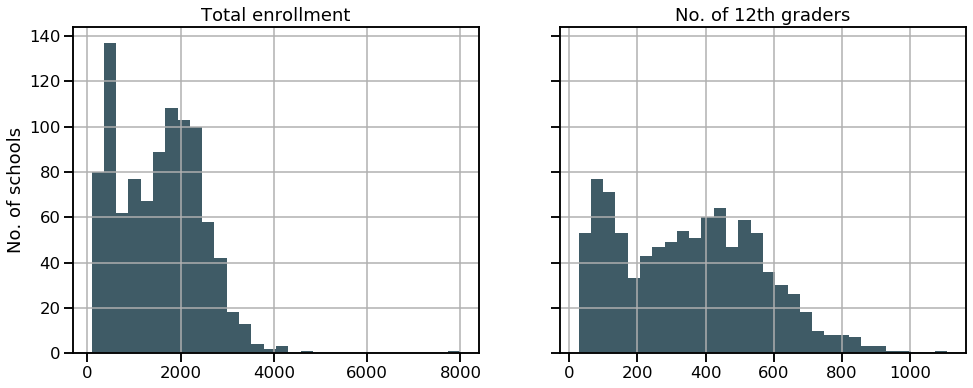

<IPython.core.display.Javascript object>

In [247]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6), sharey=True)
hist_plot(df_state_info_gs_census, "enrollment", ax1)
ax1.set_ylabel("No. of schools")
ax1.set_title("Total enrollment")

hist_plot(df_state_info_gs_census, "E12", ax2)
ax2.set_title("No. of 12th graders")

plt.savefig(figure_loc + 'enrollment_E12.png', dpi=300, bbox_inches='tight');
;

In [263]:
print(
    "Total enrolled (mean +/- SD): {0:0.1f} +/- {1:0.1f}".format(
        df_state_info_gs_census["enrollment"].mean(),
        df_state_info_gs_census["enrollment"].std(),
    )
)

Total enrolled (mean +/- SD): 1546.8 +/- 896.6


<IPython.core.display.Javascript object>

In [262]:
print(
    "Total enrollment (min - max): {0:0.0f} - {1:0.0f}".format(
        df_state_info_gs_census["enrollment"].min(),
        df_state_info_gs_census["enrollment"].max(),
    )
)

Total enrollment (min - max): 90 - 8000


<IPython.core.display.Javascript object>

In [264]:
df_state_info_gs_census[
    df_state_info_gs_census["enrollment"] == df_state_info_gs_census["enrollment"].min()
]

,NCESDist,NCESSchool,NCESDistSchool,StatusType,County,District,School,Street,StreetAbr,City,...,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_LIstudents,splice_high
458,633720,5195,63372005195,Active,Mendocino,Round Valley Unified,Round Valley High,Howard and High Streets,Howard and High Sts.,Covelo,...,1.0,18.0,NaN,NaN,92.0,92.0,NaN,NaN,NaN,0


<IPython.core.display.Javascript object>

In [265]:
df_state_info_gs_census[
    df_state_info_gs_census["enrollment"] == df_state_info_gs_census["enrollment"].max()
]

,NCESDist,NCESSchool,NCESDistSchool,StatusType,County,District,School,Street,StreetAbr,City,...,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_LIstudents,splice_high
198,603690,8715,60369008715,Active,Los Angeles,Baldwin Park Unified,Opportunities for Learning - Baldwin Park,"12731 Ramona Boulevard, Suite 201","12731 Ramona Blvd., Ste. 201",Irwindale,...,2.0,30.0,4.0,679.0,17.0,16.0,63.0,48.818182,67.0,1


<IPython.core.display.Javascript object>

In [267]:
df_state_info_gs_census[df_state_info_gs_census["School"].str.contains("Opportunities")]

,NCESDist,NCESSchool,NCESDistSchool,StatusType,County,District,School,Street,StreetAbr,City,...,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_LIstudents,splice_high
198,603690,8715,60369008715,Active,Los Angeles,Baldwin Park Unified,Opportunities for Learning - Baldwin Park,"12731 Ramona Boulevard, Suite 201","12731 Ramona Blvd., Ste. 201",Irwindale,...,2.0,30.0,4.0,679.0,17.0,16.0,63.0,48.818182,67.0,1
224,611520,13697,61152013697,Active,Los Angeles,Duarte Unified,Opportunities for Learning - Duarte,806 Huntington Drive,806 Huntington Dr.,Monrovia,...,NaN,33.0,10.0,83.0,21.0,18.0,82.0,86.000000,81.0,1
415,642510,8070,64251008070,Active,Los Angeles,William S. Hart Union High,Opportunities for Learning - Santa Clarita,27616 Newhall Ranch Road,27616 Newhall Ranch Rd.,Valencia,...,NaN,27.0,5.0,243.0,20.0,16.0,14.0,14.000000,14.0,0


<IPython.core.display.Javascript object>

In [117]:
print(
    "No. of 12th graders (mean +/- SD): {0:0.1f} +/- {1:0.1f}".format(
        df_state_info_gs_census["E12"].mean(), df_state_info_gs_census["E12"].std()
    )
)

No. of 12th graders (mean +/- SD): 355.1 +/- 207.9


<IPython.core.display.Javascript object>

In [118]:
print(
    "No. of 12th graders (min - max): {0:d} - {1:d}".format(
        df_state_info_gs_census["E12"].min(), df_state_info_gs_census["E12"].max()
    )
)

No. of 12th graders (min - max): 27 - 1110


<IPython.core.display.Javascript object>

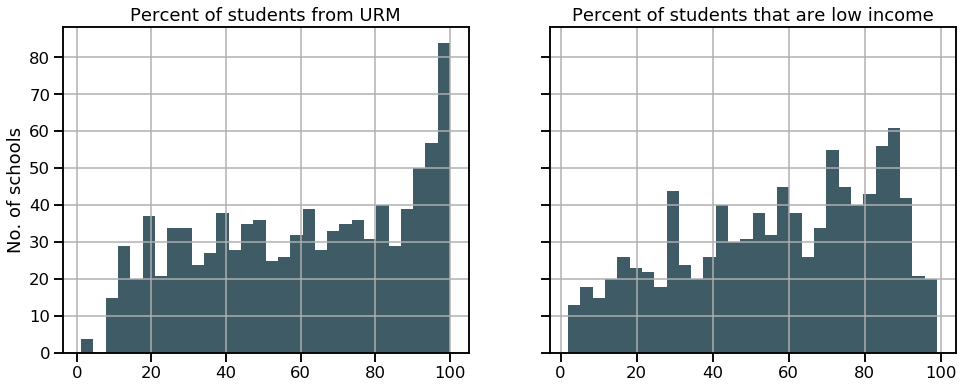

<IPython.core.display.Javascript object>

In [119]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,6), sharey=True)
hist_plot(df_state_info_gs_census, "pct_URM", ax1)
ax1.set_ylabel("No. of schools")
ax1.set_title("Percent of students from URM")

hist_plot(df_state_info_gs_census, "pct_LI_students", ax2)
ax2.set_title("Percent of students that are low income");
;

In [120]:
df_state_info_gs_census["pct_URM"].mean()

60.02963348850863

<IPython.core.display.Javascript object>

In [121]:
df_state_info_gs_census["pct_URM"].std()

27.549289412741192

<IPython.core.display.Javascript object>

## Number of schools by county

In [122]:
print("No. of counties: ", len(df_state_info_gs_census["County"].unique()))

No. of counties:  55


<IPython.core.display.Javascript object>

In [123]:
df_state_info_gs_census["County"].value_counts()

Los Angeles        234
San Diego           73
Orange              59
San Bernardino      52
Riverside           52
Sacramento          43
Santa Clara         42
Alameda             32
Fresno              28
San Joaquin         22
Tulare              21
Ventura             21
Stanislaus          19
San Mateo           19
Contra Costa        19
Kern                16
San Francisco       13
Monterey            13
Solano              12
Placer              12
Merced              11
Butte                9
San Luis Obispo      9
Sonoma               9
Shasta               9
Santa Barbara        9
Santa Cruz           8
Imperial             8
Madera               7
Mendocino            7
Marin                7
Kings                7
Humboldt             6
Yolo                 6
El Dorado            5
Napa                 5
Yuba                 4
Siskiyou             4
Lake                 4
Colusa               3
Tehama               3
Sutter               3
Nevada               2
Modoc      

<IPython.core.display.Javascript object>

In [124]:
df_state_info_gs_census["County"].value_counts().sum()

966

<IPython.core.display.Javascript object>

In [125]:
(df_state_info_gs_census["County"].value_counts() < 10).sum()

34

<IPython.core.display.Javascript object>

In [126]:
len(df_state_info_gs_census["County"].unique())

55

<IPython.core.display.Javascript object>

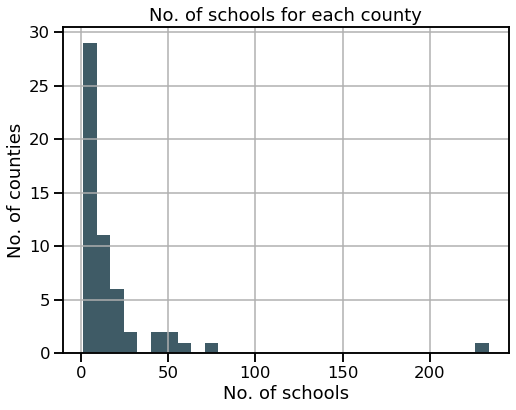

<IPython.core.display.Javascript object>

In [127]:
f, ax1 = plt.subplots(figsize=(8,6))
df_state_info_gs_census['County'].value_counts().hist(ax=ax1, bins=30, color=B_slate)
ax1.set_title('No. of schools for each county')
ax1.set_xlabel('No. of schools')
ax1.set_ylabel('No. of counties');
;

## Number of schools by district

In [128]:
print("No. of districts: ", len(df_state_info_gs_census["District"].unique()))

No. of districts:  378


<IPython.core.display.Javascript object>

In [129]:
df_state_info_gs_census["District"].value_counts()

Los Angeles Unified                       114
San Diego Unified                          23
East Side Union High                       15
San Francisco Unified                      13
Sweetwater Union High                      12
                                         ... 
Apple Valley Unified                        1
Santa Clara County Office of Education      1
Shasta County Office of Education           1
Corcoran Joint Unified                      1
Temple City Unified                         1
Name: District, Length: 378, dtype: int64

<IPython.core.display.Javascript object>

In [130]:
df_state_info_gs_census["District"].value_counts().head(15)

Los Angeles Unified            114
San Diego Unified               23
East Side Union High            15
San Francisco Unified           13
Sweetwater Union High           12
Elk Grove Unified               10
Oakland Unified                 10
Sacramento City Unified         10
Grossmont Union High             9
Chaffey Joint Union High         8
Anaheim Union High               8
Antelope Valley Union High       8
San Juan Unified                 8
Sequoia Union High               7
San Bernardino City Unified      7
Name: District, dtype: int64

<IPython.core.display.Javascript object>

In [254]:
df_state_info_gs_census["District"].value_counts().value_counts()

1      204
2       65
3       44
4       24
5       16
6        8
8        4
7        4
10       3
114      1
23       1
15       1
13       1
12       1
9        1
Name: District, dtype: int64

<IPython.core.display.Javascript object>

## Number of charters and magnets

In [132]:
df_state_info_gs_census["Charter_cat_encoded"].value_counts()

0    847
1    119
Name: Charter_cat_encoded, dtype: int64

<IPython.core.display.Javascript object>

In [133]:
df_state_info_gs_census["Charter_cat_encoded"].value_counts() / df_state_info_gs_census[
    "Charter_cat_encoded"
].count()

0    0.876812
1    0.123188
Name: Charter_cat_encoded, dtype: float64

<IPython.core.display.Javascript object>

In [134]:
df_state_info_gs_census["Charter_cat_encoded"].value_counts().sum()

966

<IPython.core.display.Javascript object>

In [135]:
df_state_info_gs_census["Magnet_cat_encoded"].value_counts()

0    867
1     99
Name: Magnet_cat_encoded, dtype: int64

<IPython.core.display.Javascript object>

In [136]:
df_state_info_gs_census["Magnet_cat_encoded"].value_counts() / df_state_info_gs_census[
    "Magnet_cat_encoded"
].count()

0    0.897516
1    0.102484
Name: Magnet_cat_encoded, dtype: float64

<IPython.core.display.Javascript object>

In [137]:
(
    (df_state_info_gs_census["Charter_cat_encoded"] == 1)
    & (df_state_info_gs_census["Magnet_cat_encoded"] == 1)
).sum()

5

<IPython.core.display.Javascript object>

## Student data

In [269]:
print(
    "Percent URM (mean +/- SD): {0:0.1f} +/- {1:0.1f}".format(
        df_state_info_gs_census["pct_URM"].mean(),
        df_state_info_gs_census["pct_URM"].std(),
    )
)

Percent URM (mean +/- SD): 60.0 +/- 27.5


<IPython.core.display.Javascript object>

In [272]:
print(
    "Percent low income (mean +/- SD): {0:0.1f} +/- {1:0.1f}".format(
        df_state_info_gs_census["pct_LI_students"].mean(),
        df_state_info_gs_census["pct_LI_students"].std(),
    )
)

Percent low income (mean +/- SD): 57.3 +/- 25.7


<IPython.core.display.Javascript object>

In [273]:
df_state_info_gs_census[["pct_URM", "pct_LI_students"]].corr()

,pct_URM,pct_LI_students
pct_URM,1.000000,0.860278
pct_LI_students,0.860278,1.000000


<IPython.core.display.Javascript object>

## Staff/teacher data

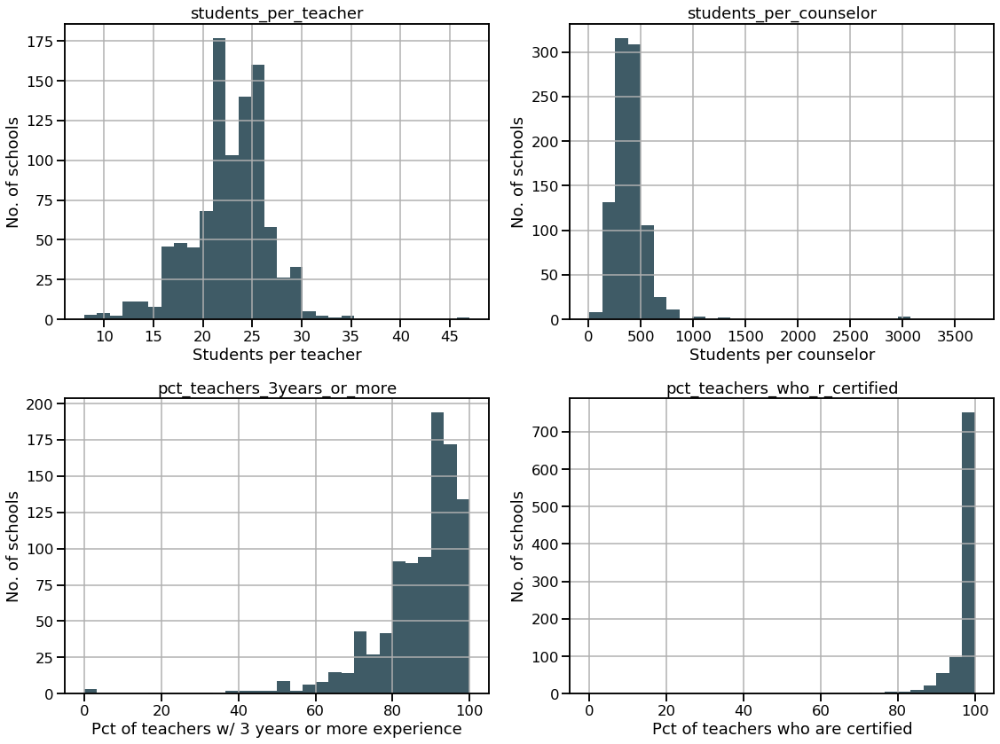

<IPython.core.display.Javascript object>

In [275]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16,12))

hist_plot(df_state_info_gs_census, "students_per_teacher", ax1)
# labels = [i.get_text() for i in ax1.get_xticklabels()]   # can't figure this out
# ax1.set_xticklabels(labels, fontsize=14)
ax1.set_xlabel('Students per teacher')
ax1.set_ylabel('No. of schools')

hist_plot(df_state_info_gs_census, "students_per_counselor", ax2)
ax2.set_xlabel('Students per counselor')
ax2.set_ylabel('No. of schools')

hist_plot(df_state_info_gs_census, "pct_teachers_3years_or_more", ax3)
ax3.set_xlabel('Pct of teachers w/ 3 years or more experience')
ax3.set_ylabel('No. of schools')

hist_plot(df_state_info_gs_census, "pct_teachers_who_r_certified", ax4)
ax4.set_xlabel('Pct of teachers who are certified')
ax4.set_ylabel('No. of schools')

plt.tight_layout();

plt.savefig(figure_loc + 'staff_info.png', dpi=300, bbox_inches='tight');
;

In [280]:
feat4metrics = [
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
]
for feat in feat4metrics:
    print(
        "Percent "
        + feat
        + "(mean +/- SD): {0:0.0f} +/- {1:0.1f}".format(
            df_state_info_gs_census[feat].mean(), df_state_info_gs_census[feat].std()
        )
    )

Percent students_per_teacher(mean +/- SD): 23 +/- 3.9
Percent students_per_counselor(mean +/- SD): 408 +/- 267.5
Percent pct_teachers_3years_or_more(mean +/- SD): 87 +/- 12.0
Percent pct_teachers_who_r_certified(mean +/- SD): 98 +/- 5.6
Percent avg_teacher_salary(mean +/- SD): 76210 +/- 22251.9


<IPython.core.display.Javascript object>

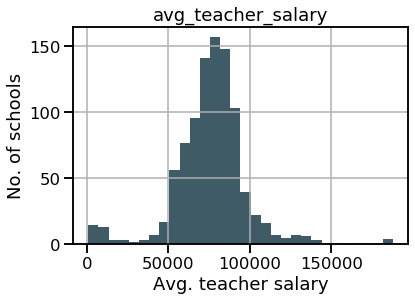

<IPython.core.display.Javascript object>

In [139]:
f, ax1 = plt.subplots(figsize=(6,4))
hist_plot(df_state_info_gs_census, "avg_teacher_salary", ax1)
ax1.set_xlabel('Avg. teacher salary')
ax1.set_ylabel('No. of schools');
;

## Test scores

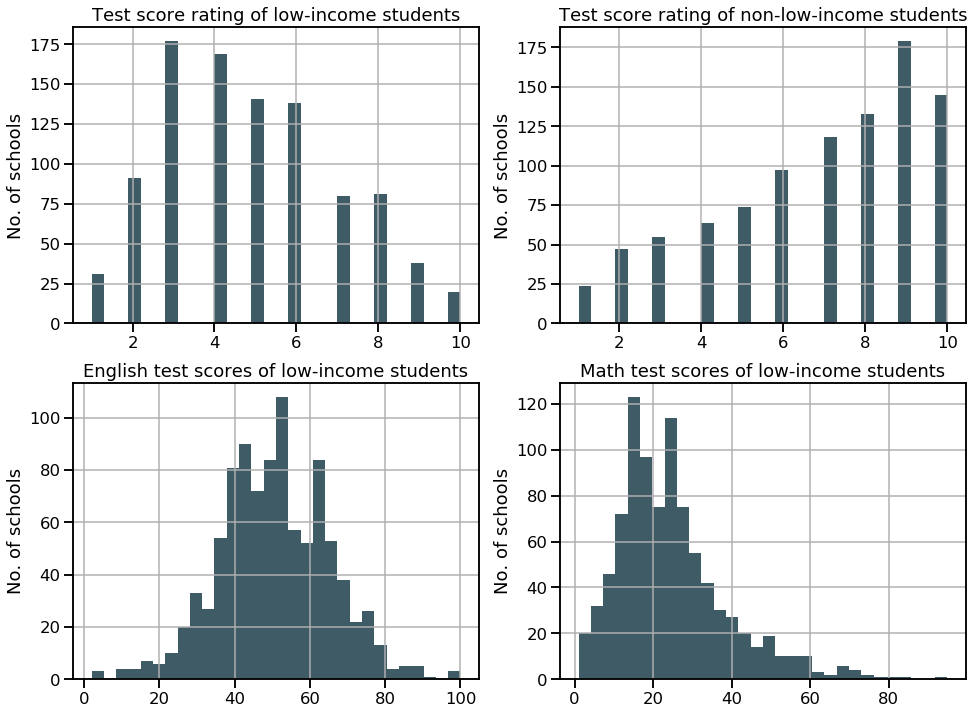

<IPython.core.display.Javascript object>

In [140]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

hist_plot(df_state_info_gs_census, "test_score_rating_LIstudents", ax1)
ax1.set_ylabel("No. of schools")
ax1.set_title("Test score rating of low-income students")
                                           
hist_plot(df_state_info_gs_census, "test_score_rating_notLIstudents", ax2)
ax2.set_ylabel("No. of schools")
ax2.set_title("Test score rating of non-low-income students")

hist_plot(df_state_info_gs_census, "test_scores_english_LIstudents", ax3)
ax3.set_ylabel("No. of schools")
ax3.set_title("English test scores of low-income students")
                                           
hist_plot(df_state_info_gs_census, "test_scores_math_LIstudents", ax4)
ax4.set_ylabel("No. of schools")
ax4.set_title("Math test scores of low-income students");
;

# Exploration of communities (zip-code level demographics)

In [144]:
def create_simple_names(str2split, names_list):
    """
    Create simple names by indicating substring common to all labels
    """
    simple_names = [i.split(str2split)[1] for i in names_list]
    simple_names_dict = dict(zip(names_list, simple_names))
    return simple_names, simple_names_dict

<IPython.core.display.Javascript object>

**Industries**

Note: This was the feature I removed during feature selection due to multicollinearity.

'%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services')

In [141]:
col_industry = [
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade",
]

<IPython.core.display.Javascript object>

In [142]:
df_state_info_gs_census[col_industry].median(axis=0).sort_values(ascending=False)

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance                                   20.6
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade                                                                                  11.4
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    10.6
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing                                                                                  9.0
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction                                                                                   6.1
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration                                                   5.3
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real est

<IPython.core.display.Javascript object>

In [145]:
col_industry_simplenames, col_industry_simplenames_dict = create_simple_names(
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - ", col_industry
)

<IPython.core.display.Javascript object>

## First 50 schools, ordered by county name (with legend)

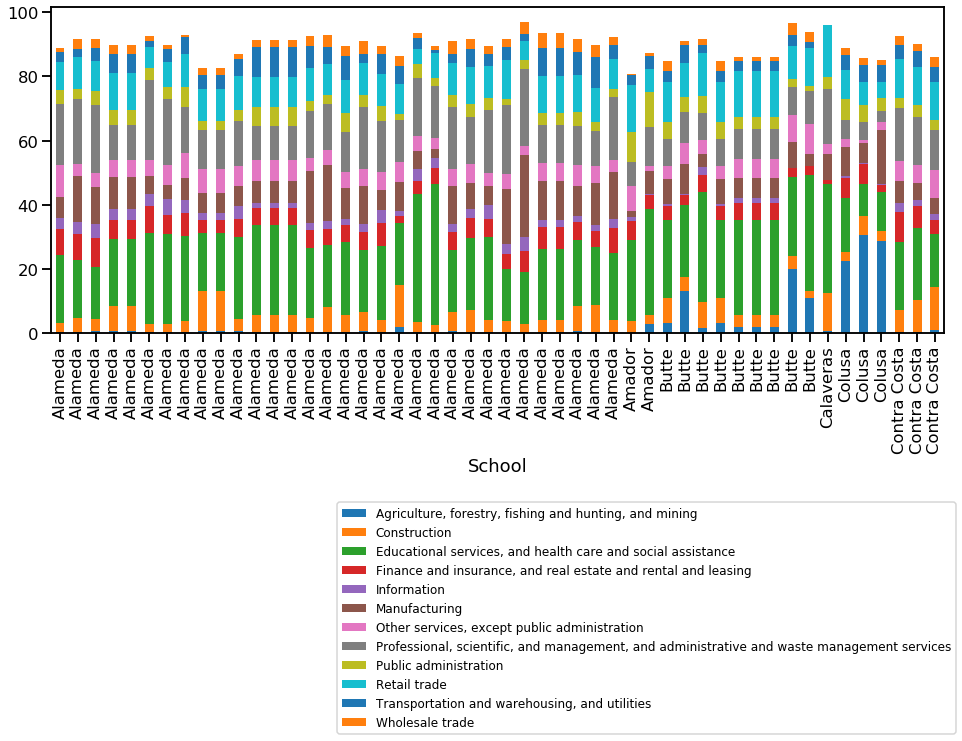

<IPython.core.display.Javascript object>

In [146]:
df_temp = df_state_info_gs_census.sort_values(by='County').iloc[0:50, :]
f, ax1 = plt.subplots(figsize=(16,6))
df_temp[['School'] +col_industry].set_index('School').plot(kind='bar', stacked=True, ax=ax1)
alt_labels = col_industry_simplenames
#ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp['County'])
ax1.legend(labels=alt_labels, bbox_to_anchor=(1.02, -0.5), loc='upper right', ncol=1, prop={'size':12});
;

## Next 100 schools, ordered by county name (no legend)

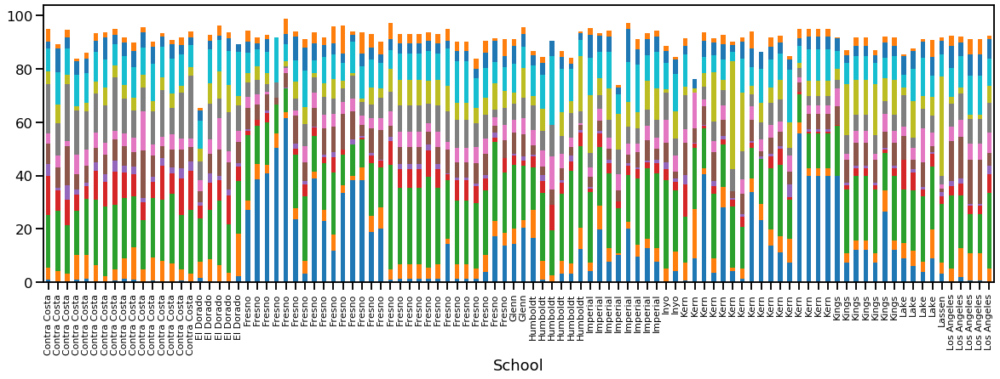

<IPython.core.display.Javascript object>

In [221]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[50:150, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

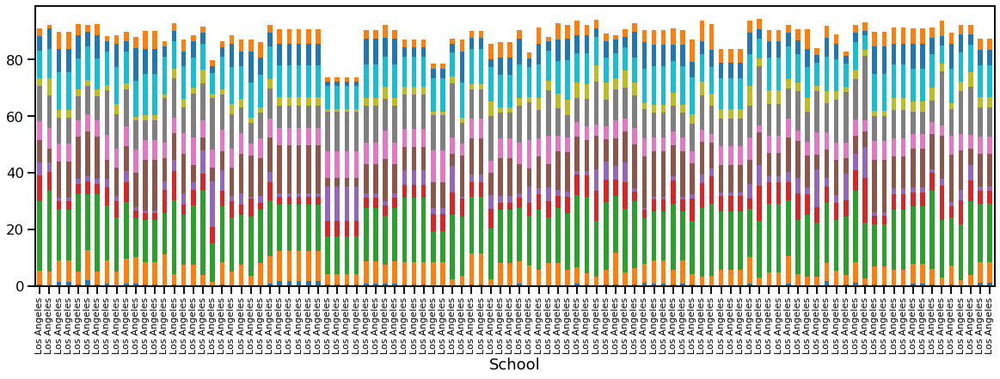

<IPython.core.display.Javascript object>

In [223]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[150:250, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

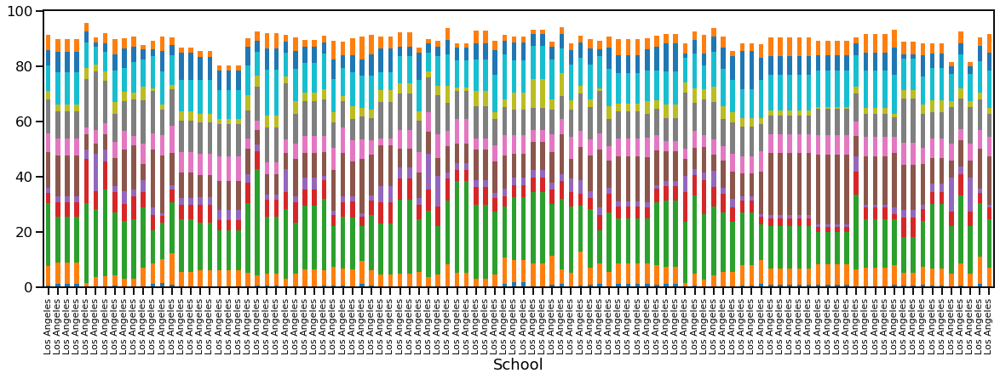

<IPython.core.display.Javascript object>

In [224]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[250:350, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

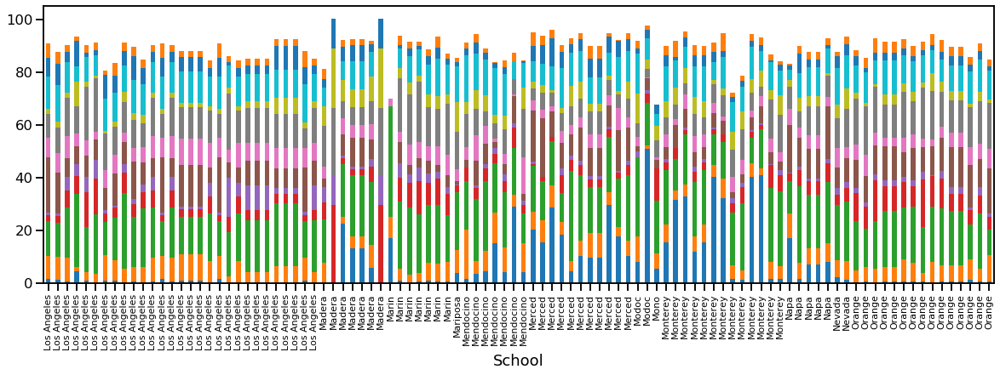

<IPython.core.display.Javascript object>

In [225]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[350:450, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

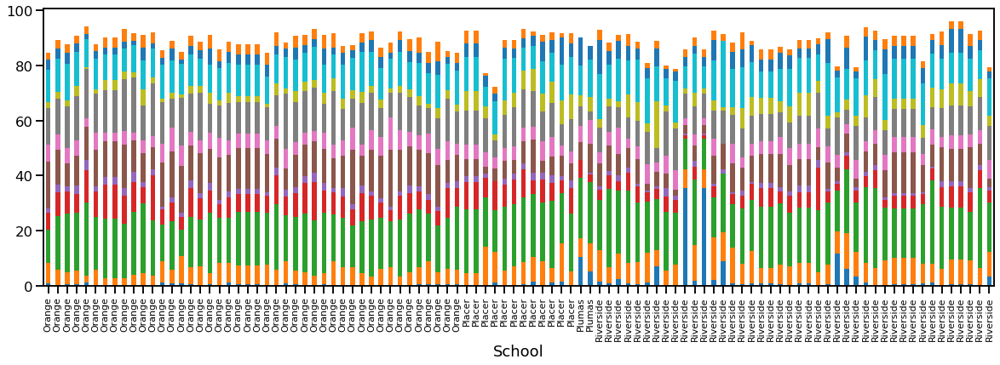

<IPython.core.display.Javascript object>

In [226]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[450:550, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

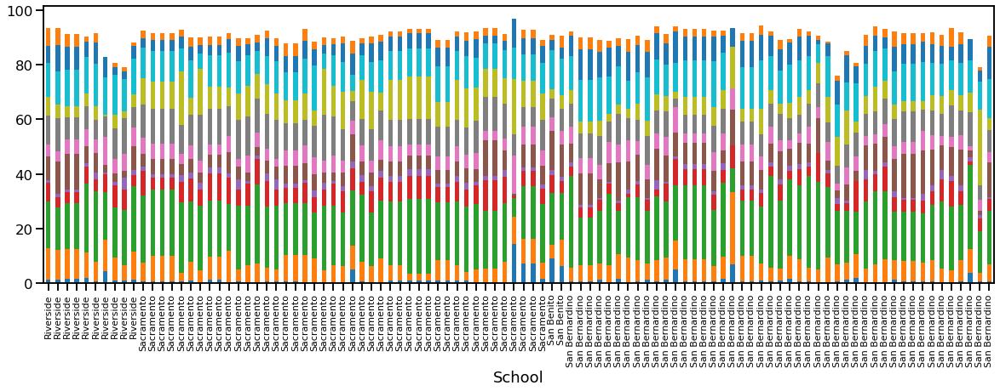

<IPython.core.display.Javascript object>

In [227]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[550:650, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

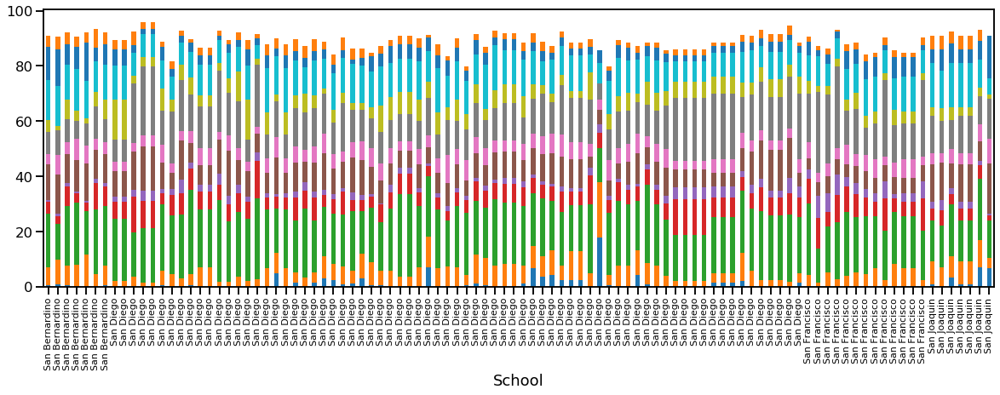

<IPython.core.display.Javascript object>

In [228]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[650:750, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

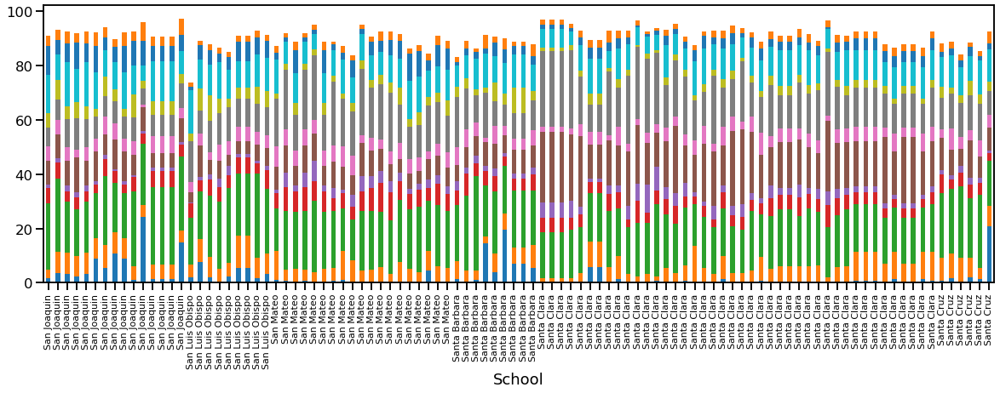

<IPython.core.display.Javascript object>

In [230]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[750:850, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

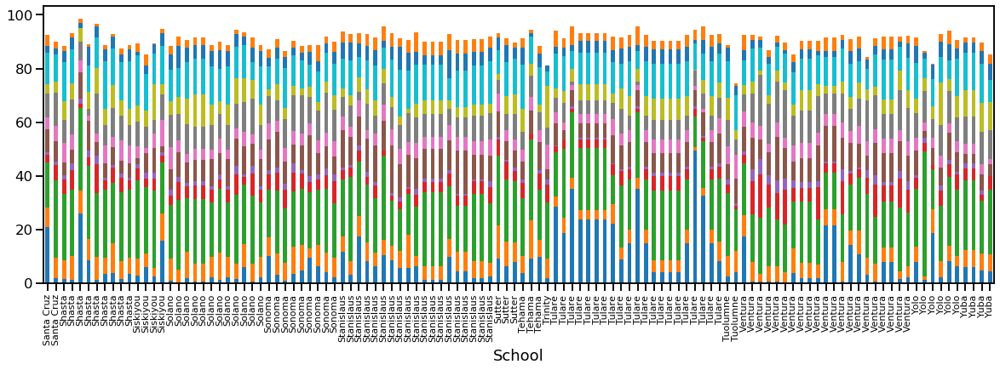

<IPython.core.display.Javascript object>

In [231]:
df_temp = df_state_info_gs_census.sort_values(by="County").iloc[850::, :]
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp[["School"] + col_industry].set_index("School").plot(
    kind="bar", stacked=True, ax=ax1
)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
ax1.set_xticklabels(df_temp["County"], fontsize=11)
ax1.get_legend().remove()

In [328]:
col_industry

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade',
 '%; INDUSTRY - Civilian employed pop. 16 y

<IPython.core.display.Javascript object>

### What is each zip code's predominant industry?

**Assign based on the zip code's highest z-score**

In [370]:
# col_industry

<IPython.core.display.Javascript object>

In [371]:
# col_industry_simplenames_dict

<IPython.core.display.Javascript object>

**Re-importing an earlier dataframe so I can use the "arts" category which was removed in feature confirmation**

In [381]:
# Re-importing to get all features back and getting to 966 schools
df_state_info_gs_census_industry = pd.read_csv(
    "data/b_intermediate/df_state_info_gs_nces_census_enrollment_200428.csv",
    index_col=0,
)

df_state_info_gs_census_industry = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["E12"] >= 25
].copy()

# Have a non low income college eligibility

# Given pct low income students
df_state_info_gs_census_industry["pct_nonLI_students"] = (
    100 - df_state_info_gs_census_industry["pct_LI_students"]
)
df_state_info_gs_census_industry["est_LI_grade12_students"] = (
    df_state_info_gs_census_industry["E12"]
    * 0.01
    * df_state_info_gs_census_industry["pct_LI_students"]
)
df_state_info_gs_census_industry["est_nonLI_grade12_students"] = (
    df_state_info_gs_census_industry["E12"]
    * 0.01
    * df_state_info_gs_census_industry["pct_nonLI_students"]
)

df_state_info_gs_census_industry["est_UCCSU_eligible_all"] = (
    df_state_info_gs_census_industry["E12"]
    * 0.01
    * df_state_info_gs_census_industry["graduation_rates_UCCSU_eligibility_allStudents"]
)
df_state_info_gs_census_industry["est_UCCSU_eligible_LI"] = (
    df_state_info_gs_census_industry["est_LI_grade12_students"]
    * 0.01
    * df_state_info_gs_census_industry["graduation_rates_UCCSU_eligibility_LIstudents"]
)
df_state_info_gs_census_industry["est_UCCSU_eligible_nonLI"] = (
    df_state_info_gs_census_industry["est_UCCSU_eligible_all"]
    - df_state_info_gs_census_industry["est_UCCSU_eligible_LI"]
)
df_state_info_gs_census_industry["graduation_rates_UCCSU_eligibility_nonLIstudents"] = (
    100
    * (
        df_state_info_gs_census_industry["est_UCCSU_eligible_nonLI"]
        / df_state_info_gs_census_industry["est_nonLI_grade12_students"]
    )
)

df_state_info_gs_census_industry["nonLI-LI_UCCSU_eligibility_gap"] = (
    df_state_info_gs_census_industry["graduation_rates_UCCSU_eligibility_nonLIstudents"]
    - df_state_info_gs_census_industry["graduation_rates_UCCSU_eligibility_LIstudents"]
)

df_state_info_gs_census_industry = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["est_LI_grade12_students"] >= 10
].copy()


# Add splice_high

thresh = (
    df_state_info_gs_census_industry[
        "graduation_rates_UCCSU_eligibility_LIstudents"
    ].mean()
    + df_state_info_gs_census_industry[
        "graduation_rates_UCCSU_eligibility_LIstudents"
    ].std()
)
df_state_info_gs_census_industry["splice_high"] = 0
bool_splice_high = (
    df_state_info_gs_census_industry["graduation_rates_UCCSU_eligibility_LIstudents"]
    > thresh
)
df_state_info_gs_census_industry.loc[bool_splice_high, "splice_high"] = 1

df_state_info_gs_census_industry.shape

(966, 273)

<IPython.core.display.Javascript object>

In [382]:
col_industry_warts = col_industry + [
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services"
]
col_industry_warts_simplenames_dict = col_industry_simplenames_dict.copy()
col_industry_warts_simplenames_dict[
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services"
] = "Arts, entertainment, and recreation, and accommodation and food services"
col_industry_warts_simplenames = list(col_industry_warts_simplenames_dict.values())

<IPython.core.display.Javascript object>

In [383]:
df_state_info_gs_census_industry[["zip_code", "City", "County"] + col_industry_warts]

,zip_code,City,County,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services"
0,94612,Oakland,Alameda,0.5,2.7,21.1,8.3,3.4,6.5,9.8,19.0,4.4,8.9,3.0,1.2,11.3
1,94501,Alameda,Alameda,0.3,3.8,23.0,7.2,4.2,6.1,5.5,16.0,4.6,10.1,6.2,2.6,10.6
3,94621,Oakland,Alameda,1.8,13.1,19.4,2.3,1.3,9.1,6.2,13.3,1.9,9.1,5.8,3.1,13.6
4,94706,Albany,Alameda,0.2,3.2,40.0,4.1,3.5,5.6,4.9,18.0,4.5,4.6,3.5,1.4,6.5
5,94704,Berkeley,Alameda,0.4,2.1,44.0,4.9,3.3,2.6,3.5,16.2,2.5,7.7,1.0,1.3,10.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1105,95695,Woodland,Yolo,8.0,5.5,21.8,3.9,1.0,9.3,4.8,9.1,5.5,13.1,6.4,3.2,8.4
1106,95961,Olivehurst,Yuba,4.7,6.4,19.8,2.1,1.7,6.0,3.7,12.1,10.7,14.6,4.8,3.1,10.3
1107,95901,Marysville,Yuba,5.9,6.5,25.8,4.5,1.9,3.7,3.8,10.0,9.7,14.0,4.0,1.9,8.4
1108,95901,Marysville,Yuba,5.9,6.5,25.8,4.5,1.9,3.7,3.8,10.0,9.7,14.0,4.0,1.9,8.4


<IPython.core.display.Javascript object>

In [384]:
col_zscore_industry = list()
for col in col_industry_warts:
    col_z_score = col_industry_warts_simplenames_dict[col] + "_z_score"
    col_zscore_industry.append(col_z_score)
    df_state_info_gs_census_industry[col_z_score] = (
        df_state_info_gs_census_industry[col]
        - df_state_info_gs_census_industry[col].mean()
    ) / df_state_info_gs_census_industry[col].std(ddof=0)

df_state_info_gs_census_industry["highest_z_industry"] = (
    df_state_info_gs_census_industry[col_zscore_industry]
    .idxmax(axis=1)
    .str.split("_z_score", expand=True)[0]
)

<IPython.core.display.Javascript object>

In [385]:
df_state_info_gs_census_industry[
    ["zip_code", "City", "County", "highest_z_industry"]
].sort_values(by="zip_code")

,zip_code,City,County,highest_z_industry
274,90001,Los Angeles,Los Angeles,Manufacturing
272,90001,Los Angeles,Los Angeles,Manufacturing
273,90001,Los Angeles,Los Angeles,Manufacturing
275,90001,Los Angeles,Los Angeles,Manufacturing
345,90002,Los Angeles,Los Angeles,Wholesale trade
...,...,...,...,...
175,96130,Susanville,Lassen,Public administration
479,96134,Tulelake,Modoc,"Agriculture, forestry, fishing and hunting, an..."
577,96145,Tahoe City,Placer,"Arts, entertainment, and recreation, and accom..."
79,96150,South Lake Tahoe,El Dorado,"Arts, entertainment, and recreation, and accom..."


<IPython.core.display.Javascript object>

In [386]:
df_state_info_gs_census_industry["highest_z_industry"].value_counts()

Transportation and warehousing, and utilities                                                 98
Educational services, and health care and social assistance                                   86
Finance and insurance, and real estate and rental and leasing                                 84
Construction                                                                                  82
Manufacturing                                                                                 80
Agriculture, forestry, fishing and hunting, and mining                                        77
Public administration                                                                         76
Wholesale trade                                                                               75
Arts, entertainment, and recreation, and accommodation and food services                      69
Professional, scientific, and management, and administrative and waste management services    68
Retail trade                  

<IPython.core.display.Javascript object>

In [389]:
df_state_info_gs_census_industry.groupby(
    ["splice_high", "highest_z_industry"]
).count().iloc[:, 0]

splice_high  highest_z_industry                                                                        
0            Agriculture, forestry, fishing and hunting, and mining                                        75
             Arts, entertainment, and recreation, and accommodation and food services                      57
             Construction                                                                                  67
             Educational services, and health care and social assistance                                   79
             Finance and insurance, and real estate and rental and leasing                                 73
             Information                                                                                   30
             Manufacturing                                                                                 64
             Other services, except public administration                                                  44
             Pro

<IPython.core.display.Javascript object>

### What is each zip code's predominant work commute option?

In [560]:
# Census columns that start with '%'
col_census_pct = list(
    set(
        df_state_info_gs_census_industry.columns[
            df_state_info_gs_census_industry.columns.str.startswith("%")
        ]
    )
)

col_census_pct.sort()

<IPython.core.display.Javascript object>

In [567]:
col_census_pct_wc = [col for col in col_census_pct if "WORK_COMMUTE" in col]
col_census_pct_wc_simplenames = [i.split('%; WORK_COMMUTE - Workers 16 yrs and up - ')[1] for i in col_census_pct_wc]
col_census_pct_wc_simplenames_dict = dict(zip(col_census_pct_wc, col_census_pct_wc_simplenames))

col_census_pct_wc_simplenames_dict

{'%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled': 'Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone': 'Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Other means': 'Other means',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)': 'Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked': 'Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home': 'Worked at home'}

<IPython.core.display.Javascript object>

In [568]:
df_state_info_gs_census_industry[["zip_code", "City", "County"] + col_census_pct_wc]

,zip_code,City,County,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled","%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",%; WORK_COMMUTE - Workers 16 yrs and up - Other means,%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),%; WORK_COMMUTE - Workers 16 yrs and up - Walked,%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home
0,94612,Oakland,Alameda,6.0,30.5,5.1,36.5,16.6,5.2
1,94501,Alameda,Alameda,8.6,59.2,4.5,16.8,3.6,7.2
3,94621,Oakland,Alameda,15.0,59.4,4.5,16.1,2.4,2.4
4,94706,Albany,Alameda,8.1,46.6,7.2,25.0,5.3,7.8
5,94704,Berkeley,Alameda,4.8,16.7,6.2,22.7,40.3,9.3
...,...,...,...,...,...,...,...,...,...
1105,95695,Woodland,Yolo,14.3,76.6,2.4,1.6,2.4,2.7
1106,95961,Olivehurst,Yuba,16.6,75.5,1.9,1.6,0.5,3.9
1107,95901,Marysville,Yuba,12.0,78.0,2.0,1.5,1.4,5.0
1108,95901,Marysville,Yuba,12.0,78.0,2.0,1.5,1.4,5.0


<IPython.core.display.Javascript object>

In [569]:
col_zscore_wc = list()
for col in col_census_pct_wc:
    col_z_score = col_census_pct_wc_simplenames_dict[col] + "_z_score"
    col_zscore_wc.append(col_z_score)
    df_state_info_gs_census_industry[col_z_score] = (
        df_state_info_gs_census_industry[col]
        - df_state_info_gs_census_industry[col].mean()
    ) / df_state_info_gs_census_industry[col].std(ddof=0)

df_state_info_gs_census_industry["highest_z_wc"] = (
    df_state_info_gs_census_industry[col_zscore_wc]
    .idxmax(axis=1)
    .str.split("_z_score", expand=True)[0]
)

<IPython.core.display.Javascript object>

In [570]:
df_state_info_gs_census_industry[
    ["zip_code", "City", "County", "highest_z_wc"]
].sort_values(by="zip_code")

,zip_code,City,County,highest_z_wc
274,90001,Los Angeles,Los Angeles,Public transportation (excluding taxicab)
272,90001,Los Angeles,Los Angeles,Public transportation (excluding taxicab)
273,90001,Los Angeles,Los Angeles,Public transportation (excluding taxicab)
275,90001,Los Angeles,Los Angeles,Public transportation (excluding taxicab)
345,90002,Los Angeles,Los Angeles,Public transportation (excluding taxicab)
...,...,...,...,...
175,96130,Susanville,Lassen,Walked
479,96134,Tulelake,Modoc,"Car, truck, or van -- carpooled"
577,96145,Tahoe City,Placer,Worked at home
79,96150,South Lake Tahoe,El Dorado,Walked


<IPython.core.display.Javascript object>

In [571]:
df_state_info_gs_census_industry["highest_z_wc"].value_counts()

Car, truck, or van -- drove alone            331
Car, truck, or van -- carpooled              221
Worked at home                               136
Public transportation (excluding taxicab)    134
Walked                                        75
Other means                                   69
Name: highest_z_wc, dtype: int64

<IPython.core.display.Javascript object>

In [572]:
df_state_info_gs_census_industry.groupby(
    ["splice_high", "highest_z_wc"]
).count().iloc[:, 0]

splice_high  highest_z_wc                             
0            Car, truck, or van -- carpooled              202
             Car, truck, or van -- drove alone            307
             Other means                                   59
             Public transportation (excluding taxicab)     79
             Walked                                        64
             Worked at home                               124
1            Car, truck, or van -- carpooled               19
             Car, truck, or van -- drove alone             24
             Other means                                   10
             Public transportation (excluding taxicab)     55
             Walked                                        11
             Worked at home                                12
Name: NCESDist, dtype: int64

<IPython.core.display.Javascript object>

## Aggregate at the county level

In [235]:
# Verification of code
# df_state_info_gs_census[['School', 'County'] + col_industry].groupby('County').count()

<IPython.core.display.Javascript object>

In [147]:
df_temp_county = (
    df_state_info_gs_census[["School", "County"] + col_industry]
    .groupby("County")
    .mean()
)
df_temp_county.head()

,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade
County,,,,,,,,,,,,
Alameda,0.475000,5.475000,23.096875,5.906250,2.940625,9.900000,5.515625,15.693750,3.884375,9.693750,5.346875,2.706250
Amador,1.350000,3.400000,29.050000,5.150000,0.950000,4.400000,4.750000,9.650000,10.250000,10.900000,3.650000,0.600000
Butte,6.388889,5.133333,28.333333,4.233333,0.988889,6.544444,6.122222,9.044444,4.000000,12.644444,3.311111,2.300000
Calaveras,0.800000,11.800000,33.800000,1.300000,0.000000,8.000000,3.100000,17.400000,3.700000,16.000000,0.000000,0.000000
Colusa,27.200000,4.000000,13.000000,4.833333,0.466667,10.800000,1.833333,4.900000,5.466667,6.966667,5.100000,1.966667


<IPython.core.display.Javascript object>

In [148]:
df_temp_county.median().sort_values(ascending=False)

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance                                   21.900000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade                                                                                  11.057143
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services     9.650000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing                                                                                  7.478947
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction                                                                                   6.225000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration                                                                          5.700000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agric

<IPython.core.display.Javascript object>

In [150]:
col_industry_order_prevalence = (
    df_temp_county.median().sort_values(ascending=False).index.tolist()
)
col_industry_order_prevalence

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities',
 '%; INDU

<IPython.core.display.Javascript object>

In [159]:
df_temp_county_ordered = df_temp_county[col_industry_order_prevalence].sort_values(
    by=col_industry_order_prevalence, ascending=False
)
df_temp_county_ordered

,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
County,,,,,,,,,,,,
Calaveras,33.800000,16.000000,17.400000,8.000000,11.800000,3.700000,0.800000,1.300000,3.100000,0.000000,0.000000,0.000000
Amador,29.050000,10.900000,9.650000,4.400000,3.400000,10.250000,1.350000,5.150000,4.750000,3.650000,0.600000,0.950000
Butte,28.333333,12.644444,9.044444,6.544444,5.133333,4.000000,6.388889,4.233333,6.122222,3.311111,2.300000,0.988889
Inyo,28.050000,11.900000,8.250000,4.950000,6.050000,5.700000,2.350000,3.600000,7.400000,4.900000,1.450000,1.800000
Yolo,25.700000,10.133333,10.000000,7.100000,5.250000,7.233333,7.416667,4.166667,3.950000,4.950000,2.566667,1.150000
Shasta,25.666667,12.433333,9.044444,6.422222,7.844444,6.655556,5.644444,5.100000,5.255556,4.222222,1.466667,1.744444
Marin,25.342857,9.157143,15.842857,3.957143,5.771429,3.314286,2.942857,8.171429,5.785714,2.214286,2.342857,3.142857
Siskiyou,25.250000,14.525000,7.900000,5.300000,6.225000,7.250000,6.825000,3.825000,5.325000,3.225000,2.325000,1.750000
Humboldt,24.766667,14.100000,8.050000,3.683333,6.100000,7.650000,6.150000,5.133333,5.600000,3.766667,1.466667,1.166667


<IPython.core.display.Javascript object>

In [152]:
df_temp_county[col_industry_order_prevalence].std()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance                                   3.331504
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade                                                                                  2.211686
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    3.762594
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing                                                                                 3.280219
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction                                                                                  1.688900
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration                                                                         5.018402
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture

<IPython.core.display.Javascript object>

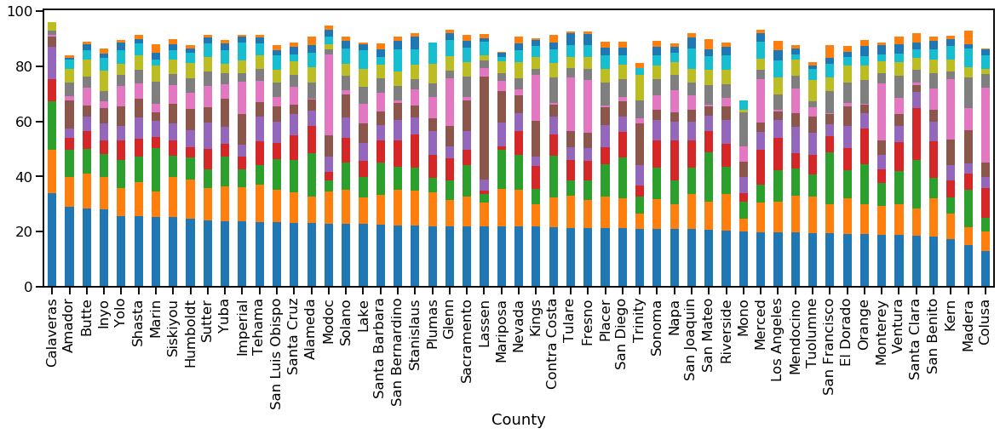

<IPython.core.display.Javascript object>

In [153]:
f, ax1 = plt.subplots(figsize=(20, 6))
df_temp_county_ordered.plot(kind="bar", stacked=True, ax=ax1)
alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels)
# ax1.set_xticklabels(df_temp['County'], fontsize=11);
ax1.get_legend().remove()

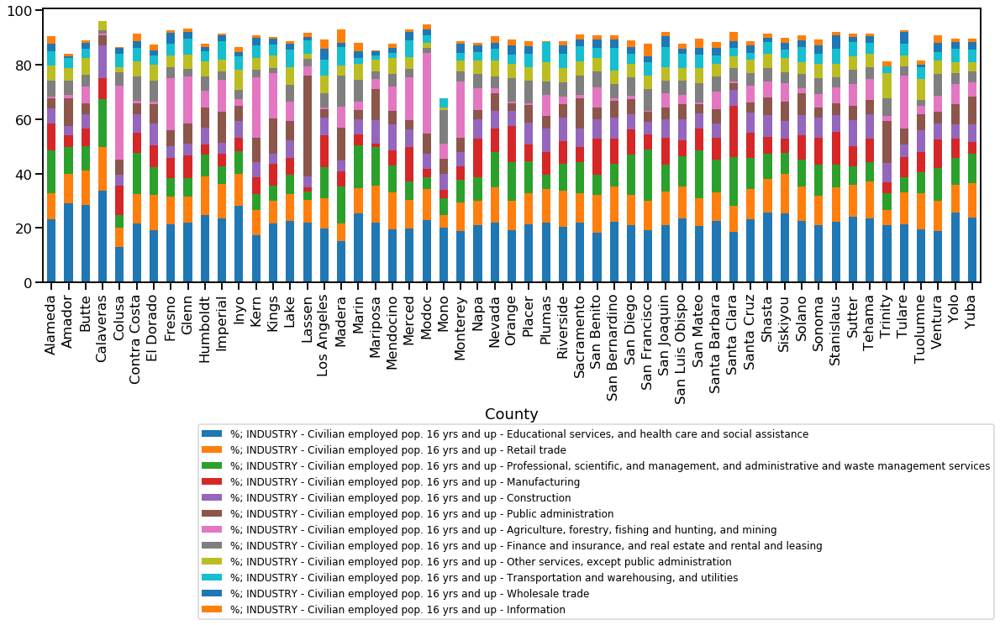

<IPython.core.display.Javascript object>

In [158]:
f, ax1 = plt.subplots(figsize=(20,6))
df_temp_county[col_industry_order_prevalence].plot(kind='bar', stacked=True, ax=ax1)
# alt_labels = col_industry_simplenames
# ax1.legend(labels=alt_labels,bbox_to_anchor=(1.02, -0.5), loc='upper right', ncol=1, prop={'size':12})
#ax1.set_xticklabels(df_temp['County'], fontsize=11);
#ax1.get_legend().remove()
ax1.legend(bbox_to_anchor=(1.02, -0.5), loc='upper right', ncol=1, prop={'size':12})

plt.savefig(figure_loc + 'Industry_by_county.png', dpi=300, bbox_inches='tight');
;

In [162]:
df_temp_county_ordered.idxmax()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance                                        Calaveras
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade                                                                                       Calaveras
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services     San Francisco
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing                                                                                    Santa Clara
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction                                                                                       Calaveras
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration                                                                                 Lassen
%; INDUSTRY - Civilian emplo

<IPython.core.display.Javascript object>

In [161]:
df_temp_county_ordered.max()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance                                   33.800000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade                                                                                  16.000000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    19.030769
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing                                                                                 19.002381
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction                                                                                  11.800000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration                                                                         37.100000
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agric

<IPython.core.display.Javascript object>

In [163]:
df_temp_county_ordered.idxmin()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance                                          Colusa
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade                                                                                           Mono
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services           Lassen
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing                                                                                      Mariposa
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction                                                                                         Amador
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration                                                                           Santa Clara
%; INDUSTRY - Civilian employed po

<IPython.core.display.Javascript object>

## Distribution of local median income

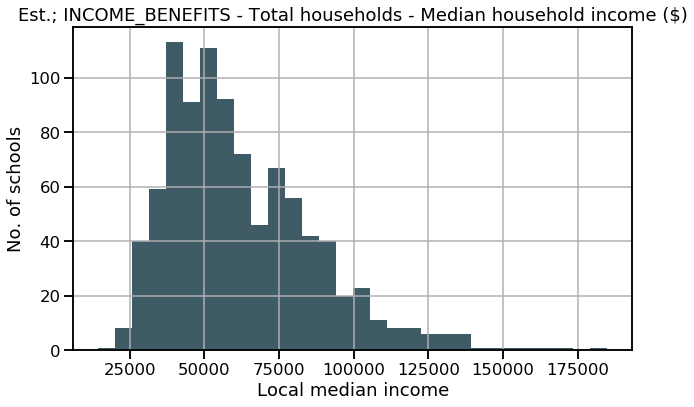

<IPython.core.display.Javascript object>

In [609]:
f, (ax1) = plt.subplots(1, 1, figsize=(10, 6))

hist_plot(df_state_info_gs_census, "Est.; INCOME_BENEFITS - Total households - Median household income ($)", ax1)
ax1.set_xlabel('Local median income')
ax1.set_ylabel('No. of schools');


plt.tight_layout()
plt.savefig(figure_loc + 'Local_median_income_dist.png', dpi=300)

In [612]:
feat = 'Est.; INCOME_BENEFITS - Total households - Median household income ($)'

print(
    "Total enrolled (mean +/- SD): {0:0.1f} +/- {1:0.1f}".format(
        df_state_info_gs_census[feat].mean(),
        df_state_info_gs_census[feat].std(),
    )
)

Total enrolled (mean +/- SD): 62517.7 +/- 24806.6


<IPython.core.display.Javascript object>

In [613]:
print(
    "Total enrollment (min - max): {0:0.0f} - {1:0.0f}".format(
        df_state_info_gs_census[feat].min(),
        df_state_info_gs_census[feat].max(),
    )
)

Total enrollment (min - max): 14579 - 184871


<IPython.core.display.Javascript object>

In [617]:
df_state_info_gs_census[['zip_code', 'City', feat]].sort_values(by=feat, ascending=False).head(30)

,zip_code,City,Est.; INCOME_BENEFITS - Total households - Median household income ($)
946,94022,Los Altos,184871.0
915,95070,Saratoga,169206.0
375,90272,Pacific Palisades,166021.0
384,90274,Rolling Hills Estates,157465.0
952,95120,San Jose,156350.0
10,94539,Fremont,145782.0
431,90266,Manhattan Beach,143527.0
53,94549,Lafayette,137989.0
546,92861,Villa Park,137451.0
937,95014,Cupertino,136940.0


<IPython.core.display.Javascript object>

# Bivariate feature exploration

## Local income vs. average teacher salary

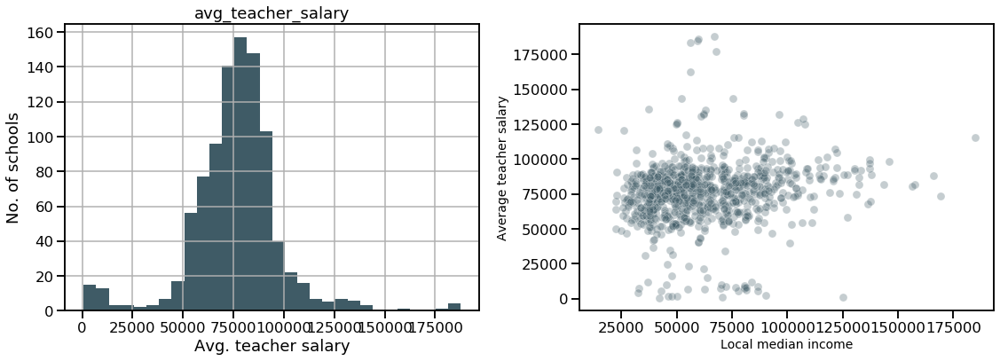

<IPython.core.display.Javascript object>

In [282]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

hist_plot(df_state_info_gs_census, "avg_teacher_salary", ax1)
ax1.set_xlabel('Avg. teacher salary')
ax1.set_ylabel('No. of schools');

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="avg_teacher_salary",
    ax=ax2,
    alpha=0.3,
    color=B_slate,
    legend=False,
)
ax2.set_xlabel(
    "Local median income", fontsize=14
)
ax2.set_ylabel("Average teacher salary", fontsize=14)

plt.tight_layout()

plt.savefig(figure_loc + 'teacher_salary.png', dpi=300, bbox_inches='tight');
;

In [284]:
df_state_info_gs_census[
    df_state_info_gs_census["avg_teacher_salary"]
    == df_state_info_gs_census["avg_teacher_salary"].max()
]

,NCESDist,NCESSchool,NCESDistSchool,StatusType,County,District,School,Street,StreetAbr,City,...,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_LIstudents,splice_high
526,614760,1815,61476001815,Active,Orange,Fullerton Joint Union High,Sunny Hills High,1801 Lancer Way,1801 Lancer Way,Fullerton,...,10.0,57.0,42.0,207.0,99.0,98.0,69.0,71.958904,61.0,0


<IPython.core.display.Javascript object>

In [285]:
df_state_info_gs_census[
    [
        "avg_teacher_salary",
        "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    ]
].corr()

,avg_teacher_salary,Est.; INCOME_BENEFITS - Total households - Median household income ($)
avg_teacher_salary,1.000000,0.145841
Est.; INCOME_BENEFITS - Total households - Median household income ($),0.145841,1.000000


<IPython.core.display.Javascript object>

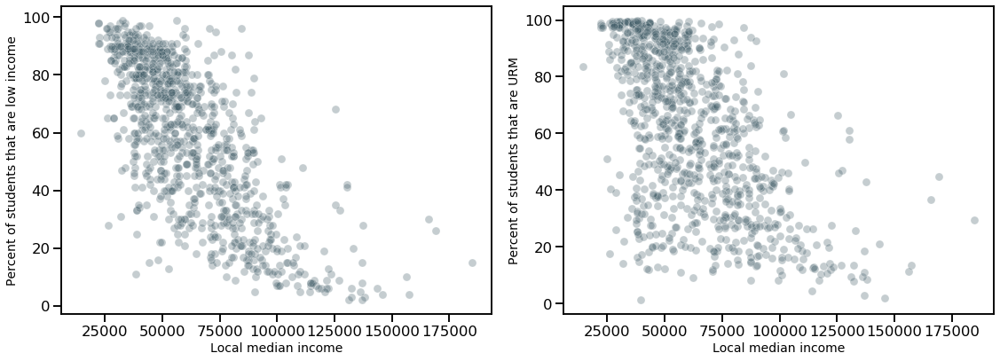

<IPython.core.display.Javascript object>

In [621]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="pct_LI_students",
    ax=ax1,
    alpha=0.3,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel(
    "Local median income", fontsize=14
)
ax1.set_ylabel("Percent of students that are low income", fontsize=14);

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="pct_URM",
    ax=ax2,
    alpha=0.3,
    color=B_slate,
    legend=False,
)
ax2.set_xlabel(
    "Local median income", fontsize=14
)
ax2.set_ylabel("Percent of students that are URM", fontsize=14);

plt.tight_layout()
plt.savefig(figure_loc + 'local_median_income_vs_pctLI_pctURM.png', dpi=300)

In [890]:
df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.contains("teacher")]

Index(['students_per_teacher', 'pct_teachers_3years_or_more',
       'pct_teachers_who_r_certified', 'avg_teacher_salary'],
      dtype='object')

<IPython.core.display.Javascript object>

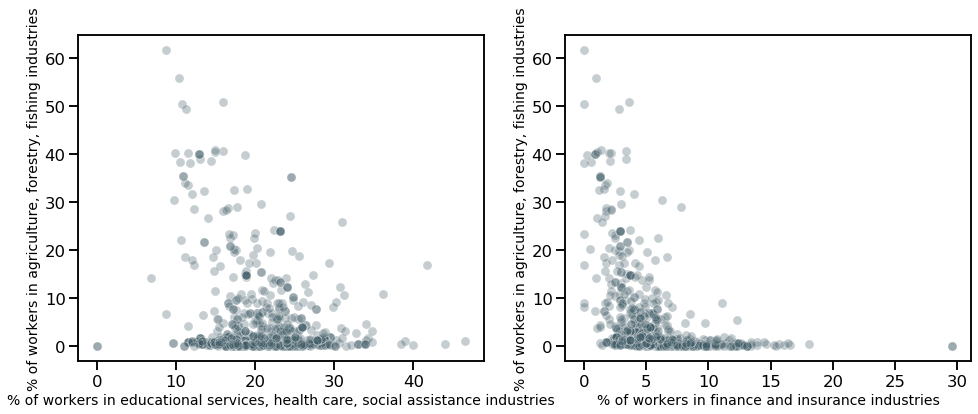

<IPython.core.display.Javascript object>

In [168]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance",
    y="%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",
    ax=ax1,
    alpha=0.3,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel(
    "% of workers in educational services, health care, social assistance industries", fontsize=14
)
ax1.set_ylabel("% of workers in agriculture, forestry, fishing industries", fontsize=14);

sns.scatterplot(
    data=df_state_info_gs_census,
    x="%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing",
    y="%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",
    ax=ax2,
    alpha=0.3,
    color=B_slate,
    legend=False,
)
ax2.set_xlabel(
    "% of workers in finance and insurance industries", fontsize=14
)
ax2.set_ylabel("% of workers in agriculture, forestry, fishing industries", fontsize=14);
;

# Evaluation of target

In [33]:
n_schools_notarget = (
    df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
    .isna()
    .sum()
)
print("No. of schools without a value for SPLICE: {0:d}".format(n_schools_notarget))

No. of schools without a value for SPLICE: 13


<IPython.core.display.Javascript object>

In [29]:
# f, ax1 = plt.subplots(figsize=(8,6))
# sns.distplot(a=df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].dropna())
# ax1.set_ylabel("No. of schools", fontsize=16)
# ax1.set_title("SPLICE", fontsize=14);
;

<IPython.core.display.Javascript object>

In [63]:
target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

<IPython.core.display.Javascript object>

mean: 47.0
mean +/- 1SD: 27.2 +/- 66.8
mean +/- 2SD: 7.4 +/- 86.6


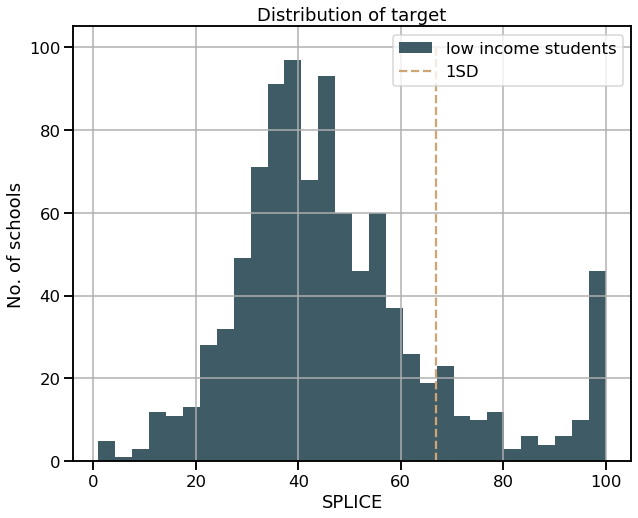

<IPython.core.display.Javascript object>

In [850]:
f, ax1 = plt.subplots(figsize=(10, 8))
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].hist(
    bins=30, ax=ax1, color=B_slate, label="low income students"
)

# ax1.vlines([target_mean - target_sd, target_mean + target_sd], ymin=0, ymax=df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].max(), colors=B_beige, linestyle="dashed", label='1SD')
ax1.vlines(
    [target_mean + target_sd],
    ymin=0,
    ymax=df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].max(),
    colors=B_beige,
    linestyle="dashed",
    label="1SD",
)
# ax1.vlines([target_mean - 2*target_sd, target_mean + 2*target_sd], ymin=0, ymax=df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].max(), colors=B_green, linestyle="dashed", label='2SD')
ax1.set_title("Distribution of target")
ax1.set_xlabel("SPLICE")
ax1.set_ylabel("No. of schools")
ax1.legend()

print("mean: {0:0.1f}".format(target_mean))
print(
    "mean +/- 1SD: {0:0.1f} +/- {1:0.1f}".format(
        target_mean - target_sd, target_mean + target_sd
    )
)
print(
    "mean +/- 2SD: {0:0.1f} +/- {1:0.1f}".format(
        target_mean - 2 * target_sd, target_mean + 2 * target_sd
    )
)

plt.savefig(figure_loc + "SPLICE_target_distribution.png")

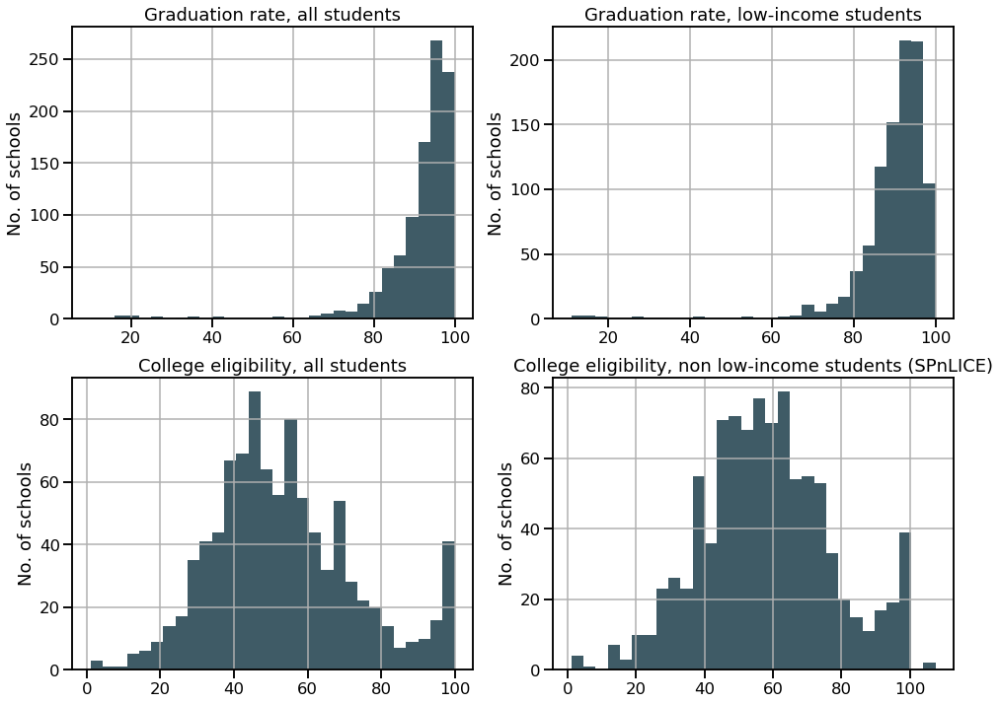

<IPython.core.display.Javascript object>

In [173]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))

hist_plot(df_state_info_gs_census, "graduation_rates_gradRates_eligibility_allStudents", ax1)
ax1.set_ylabel("No. of schools")
ax1.set_title("Graduation rate, all students")
                                           
hist_plot(df_state_info_gs_census, "graduation_rates_gradRates_eligibility_LIstudents", ax2)
ax2.set_ylabel("No. of schools")
ax2.set_title("Graduation rate, low-income students")

hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_allStudents", ax3)
ax3.set_ylabel("No. of schools")
ax3.set_title("College eligibility, all students")
                                           
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_nonLIstudents", ax4)
ax4.set_ylabel("No. of schools")
ax4.set_title("College eligibility, non low-income students (SPnLICE)");
;

## Assessment of features against target


### Percent low income and enrollment 

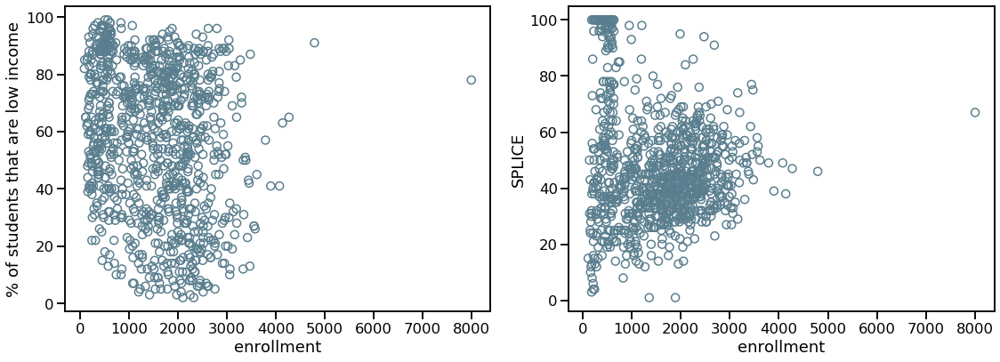

<IPython.core.display.Javascript object>

In [102]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, "enrollment", "pct_LI_students", ax1)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "enrollment",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

ax1.set_xlabel("enrollment")  # , fontsize=18)
ax1.set_ylabel("% of students that are low income")  # , fontsize=18)
ax2.set_xlabel("enrollment")  # , fontsize=18)
ax2.set_ylabel("SPLICE")  # , fontsize=18)
plt.tight_layout()

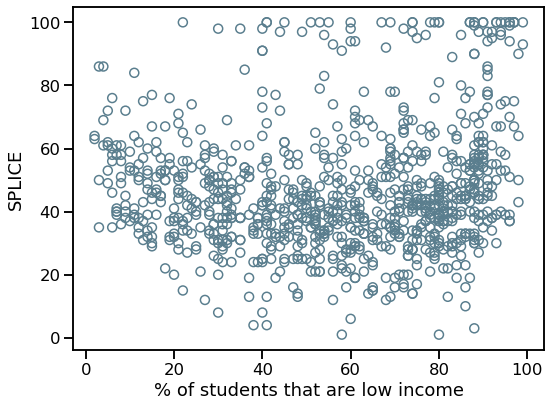

<IPython.core.display.Javascript object>

In [557]:
f, ax1 = plt.subplots(1, 1, figsize=(8, 6))

scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax1,
)

ax1.set_xlabel("% of students that are low income")  # , fontsize=18)
ax1.set_ylabel("SPLICE")  # , fontsize=18)
plt.tight_layout()

plt.savefig(figure_loc + "pct_LI_vs_SPLICE.png", dpi=300)


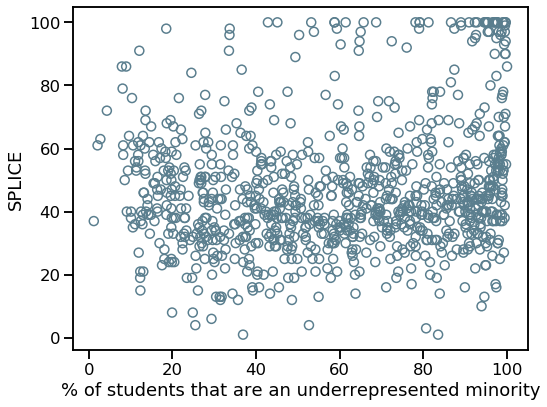

<IPython.core.display.Javascript object>

In [558]:
f, ax1 = plt.subplots(1, 1, figsize=(8, 6))

scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_URM",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax1,
)

ax1.set_xlabel("% of students that are an underrepresented minority")  # , fontsize=18)
ax1.set_ylabel("SPLICE")  # , fontsize=18)
plt.tight_layout()

# plt.savefig(figure_loc + "pct_LI_vs_SPLICE.png")


## Counties with high SPLICE

**Assign the 0/1 value for exceptional schools for SPLICE as the target.**

In [172]:
thresh = (
    df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].mean()
    + df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].std()
)
df_state_info_gs_census["splice_high"] = 0
bool_splice_high = (
    df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] > thresh
)
df_state_info_gs_census.loc[bool_splice_high, "splice_high"] = 1

<IPython.core.display.Javascript object>

In [181]:
# crosstab is more straightforward
# df_state_info_gs_census.groupby(['County', 'splice_high']).count().unstack()

<IPython.core.display.Javascript object>

In [192]:
df_county_splicehigh = pd.crosstab(
    df_state_info_gs_census["County"], df_state_info_gs_census["splice_high"]
)
df_county_splicehigh["total_schools"] = (
    df_county_splicehigh[0] + df_county_splicehigh[1]
)
df_county_splicehigh["pct_splice_high"] = np.round(
    100 * df_county_splicehigh.loc[:, 1] / df_county_splicehigh["total_schools"], 2
)
df_county_splicehigh.sort_values(by=["pct_splice_high"], ascending=False)

splice_high,0,1,total_schools,pct_splice_high
County,,,,
San Francisco,7,6,13,46.15
Alameda,23,9,32,28.12
Los Angeles,169,65,234,27.78
San Diego,54,19,73,26.03
Yuba,3,1,4,25.00
Yolo,5,1,6,16.67
Kings,6,1,7,14.29
Santa Clara,36,6,42,14.29
Contra Costa,17,2,19,10.53


<IPython.core.display.Javascript object>

### Allocation of schools/enrollment across costal counties

In [304]:
ba_socal_counties = [
    "Alameda",
    "Contra Costa",
    "Marin",
    "Napa",
    "San Francisco",
    "San Mateo",
    "Santa Clara",
    "Solano",
    "Sonoma",
    "Los Angeles",
    "Orange",
    "San Diego",
]

<IPython.core.display.Javascript object>

In [327]:
bool_ba_socal = df_state_info_gs_census["County"].isin(ba_socal_counties)

pct_enrollment_ba_socal = (
    df_state_info_gs_census.loc[bool_ba_socal, "enrollment"].sum()
    / df_state_info_gs_census.loc[:, "enrollment"].sum()
)
pct_schools_ba_socal = (
    df_state_info_gs_census.loc[bool_ba_socal, "enrollment"].count()
    / df_state_info_gs_census.loc[:, "enrollment"].count()
)

print(
    "Pct. of total enrolled in Bay Area/So Cal: {0:0.2f}".format(
        100 * pct_enrollment_ba_socal
    )
)
print(
    "Pct. of total schools in Bay Area/So Cal: {0:0.2f}".format(
        100 * pct_schools_ba_socal
    )
)


bool_splicehigh = df_state_info_gs_census["splice_high"] == 1

pct_enrolled_splicehigh_ba_socal = (
    df_state_info_gs_census.loc[bool_splicehigh & bool_ba_socal, "enrollment"].sum()
    / df_state_info_gs_census.loc[bool_splicehigh, "enrollment"].sum()
)
pct_schools_splicehigh_ba_socal = (
    df_state_info_gs_census.loc[bool_ba_socal, "splice_high"].sum()
    / df_state_info_gs_census.loc[:, "splice_high"].sum()
)

print(
    "Pct. of total enrolled splice high in Bay Area/So Cal: {0:0.2f}".format(
        100 * pct_enrolled_splicehigh_ba_socal
    )
)
print(
    "Pct. of SPLICE high schools in Bay Area/So Cal: {0:0.2f}".format(
        100 * pct_schools_splicehigh_ba_socal
    )
)

Pct. of total enrolled in Bay Area/So Cal: 57.13
Pct. of total schools in Bay Area/So Cal: 54.20
Pct. of total enrolled splice high in Bay Area/So Cal: 81.91
Pct. of SPLICE high schools in Bay Area/So Cal: 87.02


<IPython.core.display.Javascript object>

In [321]:
df_state_info_gs_census.loc[bool_ba_socal, "splice_high"].sum()

114

<IPython.core.display.Javascript object>

In [322]:
df_state_info_gs_census.loc[:, "splice_high"].sum()

131

<IPython.core.display.Javascript object>

In [ ]:
df_county_splicehigh

## Exploration of SPLICE and most correlated features with SPLICE

See feature confirmation notebook also.

In [77]:
df_state_info_gs_census[
    "graduation_rates_UCCSU_eligibility_allStudents"
] * df_state_info_gs_census["pct_LI_students"] / 100

0       67.00
1       11.88
3       80.00
4       10.71
5       18.48
        ...  
1105    26.46
1106    26.04
1107    29.48
1108    20.46
1109    19.24
Length: 966, dtype: float64

<IPython.core.display.Javascript object>

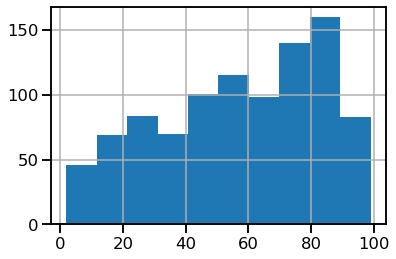

<IPython.core.display.Javascript object>

In [78]:
df_state_info_gs_census["pct_LI_students"].hist()

''

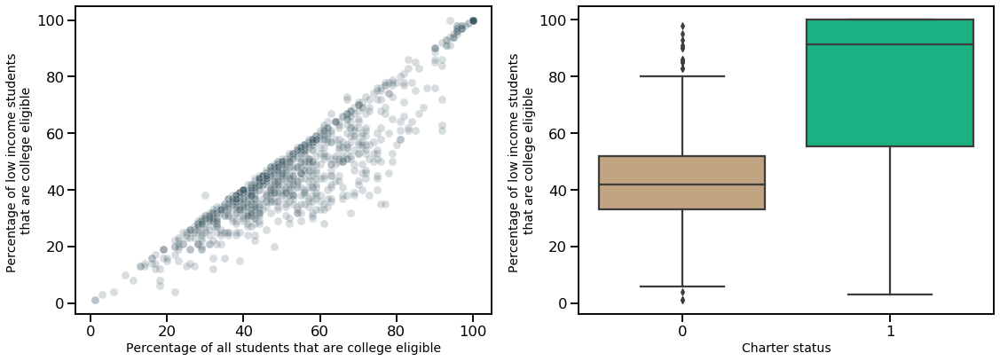

<IPython.core.display.Javascript object>

In [169]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_allStudents",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Percentage of all students that are college eligible", fontsize=14)
ax1.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)


sns.boxplot(
    data=df_state_info_gs_census,
    x="Charter_cat_encoded",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    palette=[B_beige, B_green],
)
ax2.set_xlabel("Charter status", fontsize=14)
ax2.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)
plt.tight_layout()
;
;

In [80]:
df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.contains("income")]

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)'],
      dtype='object')

<IPython.core.display.Javascript object>

''

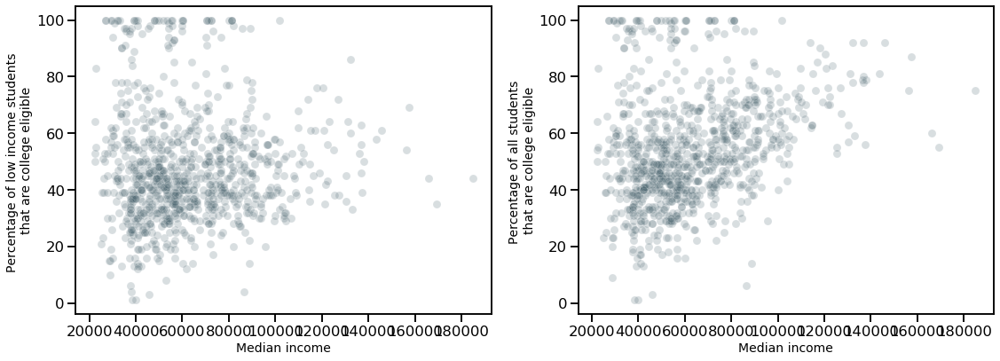

<IPython.core.display.Javascript object>

In [81]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# scatter_plot_open_circles(
#     df_state_info_gs_census,
#     "graduation_rates_UCCSU_eligibility_allStudents",
#     "graduation_rates_UCCSU_eligibility_LIstudents",
#     ax1,
# )

sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Median income", fontsize=14)
ax1.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)


sns.scatterplot(
    data=df_state_info_gs_census,
    x="Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    y="graduation_rates_UCCSU_eligibility_allStudents",
    ax=ax2,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax2.set_xlabel("Median income", fontsize=14)
ax2.set_ylabel("Percentage of all students \nthat are college eligible", fontsize=14)

plt.tight_layout()
;
;

In [82]:
df_state_info_gs_census["Charter_cat_encoded"].sum()

119

<IPython.core.display.Javascript object>

## Exploration of gap and features correlated with gap

KeyError: 'nonLI-LI_UCCSU_eligibility_gap'

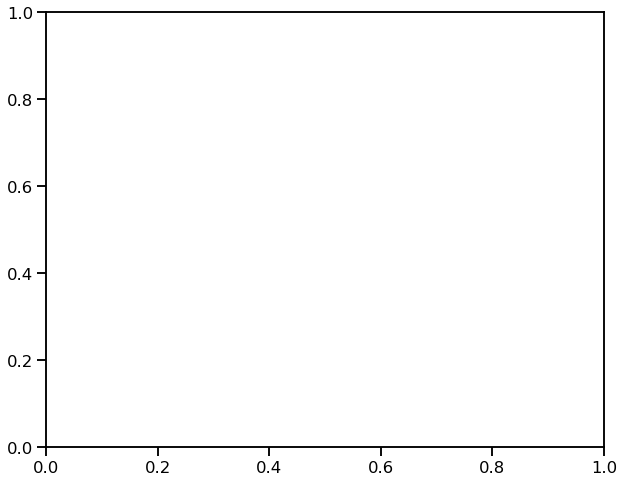

<IPython.core.display.Javascript object>

In [846]:
f, ax1 = plt.subplots(figsize=(10, 8))
df_state_info_gs_census["nonLI-LI_UCCSU_eligibility_gap"].hist(
    bins=30, ax=ax1, color=B_beige, alpha=0.5
)
# df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"].hist(
#     bins=30, ax=ax1, color=B_green, alpha=0.5, label="all students"
# )

# ax1.axvline(67.4, c="gray", linestyle="dashed")
ax1.set_title("Distribution of achievement gap")
ax1.set_xlabel("Difference in percentage points", fontsize=16)
ax1.set_ylabel("No. of schools", fontsize=16)
# ax1.legend()

target = df_state_info_gs_census["nonLI-LI_UCCSU_eligibility_gap"]
target_mean = target.mean()
target_sd = target.std()

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd)
print("mean + 2SD: ", target_mean - 2 * target_sd, target_mean + 2 * target_sd)

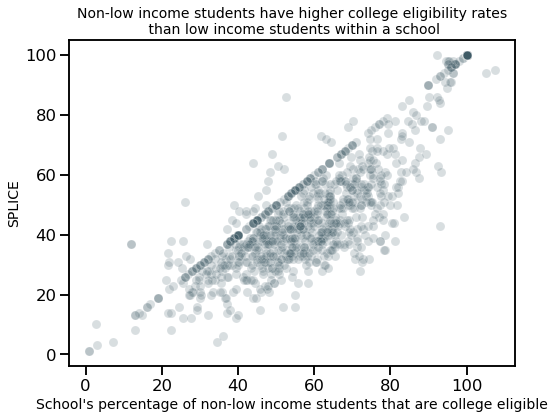

<IPython.core.display.Javascript object>

In [555]:
f, (ax1) = plt.subplots(1, 1, figsize=(8, 6))

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_nonLIstudents",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)

# ax1.axabline(
    
# )


ax1.set_xlabel(
    "School's percentage of non-low income students that are college eligible", fontsize=14
)
ax1.set_ylabel(
    "SPLICE", fontsize=14
)
ax1.set_title(
    "Non-low income students have higher college eligibility rates\n than low income students within a school", fontsize=14
);

plt.savefig(figure_loc + 'nonLI_vs_LI_gap.png', dpi=300)

# Geographic data

In [390]:
import fiona
import geopandas
from mpl_toolkits.axes_grid1 import make_axes_locatable

<IPython.core.display.Javascript object>

**Use `df_state_info_gs_census_industry` dataframe which has some features that were removed for modeling**

## School point dataset based on longitude and latitude

https://towardsdatascience.com/easy-steps-to-plot-geographic-data-on-a-map-python-11217859a2db

In [391]:
df_state_info_gs_census_industry[["School", "County", "Latitude", "Longitude"]].head()

,School,County,Latitude,Longitude
0,Envision Academy for Arts & Technology,Alameda,37.804520,-122.26815
1,Alameda High,Alameda,37.764958,-122.24593
3,Lighthouse Community Charter High,Alameda,37.737050,-122.19663
4,Albany High,Alameda,37.896661,-122.29257
5,Berkeley High,Alameda,37.868913,-122.27120


<IPython.core.display.Javascript object>

In [392]:
# Update data formatting of latitude and longitude
df_state_info_gs_census_industry["Latitude"].replace("No Data", None, inplace=True)
df_state_info_gs_census_industry["Latitude"] = pd.to_numeric(
    df_state_info_gs_census_industry["Latitude"]
)

df_state_info_gs_census_industry["Longitude"].replace("No Data", None, inplace=True)
df_state_info_gs_census_industry["Longitude"] = pd.to_numeric(
    df_state_info_gs_census_industry["Longitude"]
)

<IPython.core.display.Javascript object>

In [393]:
df_wgeo = df_state_info_gs_census_industry[
    (df_state_info_gs_census_industry["Latitude"] != "No Data")
    | (df_state_info_gs_census_industry["Longitude"] != "No Data")
].copy()

df_wgeo["Latitude"] = pd.to_numeric(df_wgeo["Latitude"])
df_wgeo["Longitude"] = pd.to_numeric(df_wgeo["Longitude"])

df_wgeo["graduation_rates_UCCSU_eligibility_LIstudents"] = pd.to_numeric(
    df_wgeo["graduation_rates_UCCSU_eligibility_LIstudents"]
)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/pandas/core/ops/__init__.py:1115: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


<IPython.core.display.Javascript object>

In [394]:
df_wgeo.head()

,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,City,Zip,...,Information_z_score,Manufacturing_z_score,"Other services, except public administration_z_score","Professional, scientific, and management, and administrative and waste management services_z_score",Public administration_z_score,Retail trade_z_score,"Transportation and warehousing, and utilities_z_score",Wholesale trade_z_score,"Arts, entertainment, and recreation, and accommodation and food services_z_score",highest_z_industry
0,691051,10947,Active,Alameda,Alameda County Office of Education,Envision Academy for Arts & Technology,1515 Webster Street,1515 Webster St.,Oakland,94612-3355,...,0.535612,-0.682363,2.397790,1.615594,-0.166207,-0.870740,-0.831076,-1.271912,0.309275,"Other services, except public administration"
1,601770,41,Active,Alameda,Alameda Unified,Alameda High,2200 Central Avenue,2200 Central Ave.,Alameda,94501-4406,...,0.934842,-0.767085,0.090058,0.971259,-0.112193,-0.420072,0.515795,-0.331691,0.132165,"Professional, scientific, and management, and ..."
3,628050,10726,Active,Alameda,Oakland Unified,Lighthouse Community Charter High,444 Hegenberger Road,444 Hegenberger Rd.,Oakland,94621-1418,...,-0.512365,-0.131666,0.465735,0.391359,-0.841379,-0.795628,0.347436,0.004102,0.891209,Construction
4,601860,59,Active,Alameda,Albany City Unified,Albany High,603 Key Route Boulevard,603 Key Route Blvd.,Albany,94706-1422,...,0.585516,-0.872988,-0.231951,1.400816,-0.139200,-2.485634,-0.620627,-1.137595,-0.905196,"Educational services, and health care and soci..."
5,604740,432,Active,Alameda,Berkeley Unified,Berkeley High,1980 Allston Way,1980 Allston Way,Berkeley,94704-1463,...,0.485708,-1.508407,-0.983305,1.014215,-0.679338,-1.321408,-1.672870,-1.204753,0.081562,"Educational services, and health care and soci..."


<IPython.core.display.Javascript object>

## With geopandas
- basemap looks old
- helpful [link](https://medium.com/@minaienick/why-you-should-be-using-geopandas-to-visualize-data-on-maps-aka-geo-visualization-fd1e3b6211b4)
- conda install --name insight geopandas shapely fiona pyproj rtree six descartes mapclassify

also consider: https://github.com/jupyter-widgets/ipyleaflet


In [395]:
# world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))
# world.head()
# world.plot()

<IPython.core.display.Javascript object>

In [396]:
# File from http://geojson.xyz/

url = "https://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_admin_1_states_provinces_shp.geojson"
df_states = geopandas.read_file(url)

df_CA = df_states[df_states["name"] == "California"]
df_CA.head()

,scalerank,adm1_code,diss_me,adm1_cod_1,iso_3166_2,wikipedia,sr_sov_a3,sr_adm0_a3,iso_a2,adm0_sr,...,area_sqkm,sameascity,labelrank,featurec_1,admin,name_len,mapcolor9,mapcolor13,featureclass,geometry
7,2,USA-3521,3521,USA-3521,US-CA,http://en.wikipedia.org/wiki/California,US1,USA,US,8,...,0,-99,0,Admin-1 scale rank,United States of America,10,1,1,Admin-1 scale rank,"POLYGON ((-114.35490 34.46467, -114.16597 34.2..."


<IPython.core.display.Javascript object>

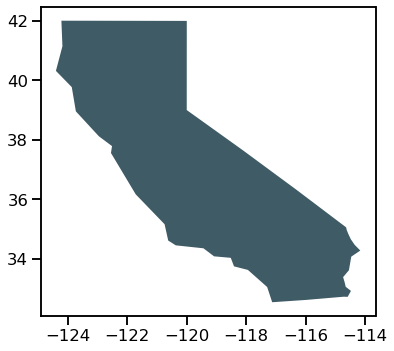

<IPython.core.display.Javascript object>

In [397]:
f, ax1 = plt.subplots(figsize=(6, 6))
df_CA.plot(ax=ax1, color=B_slate);
;

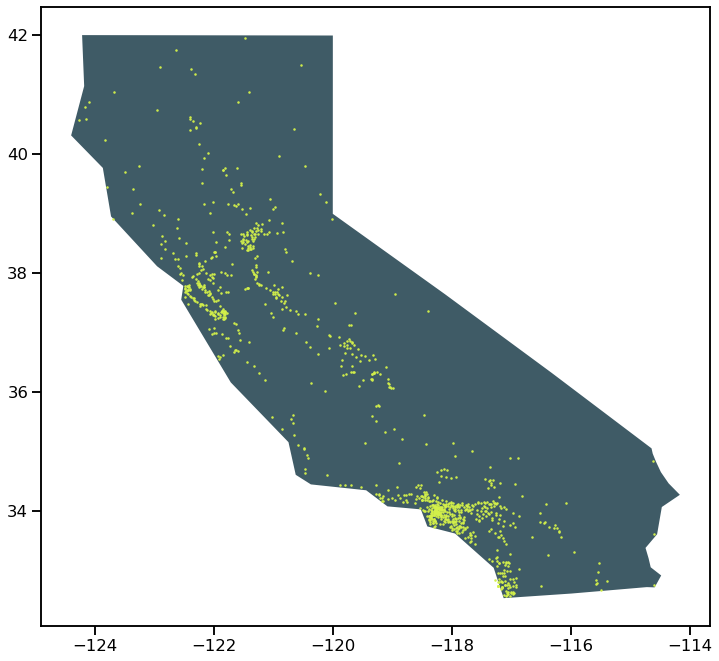

<IPython.core.display.Javascript object>

In [398]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_CA.plot(ax=ax1, color=B_slate)
ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=B_lime, s=2**0);
;

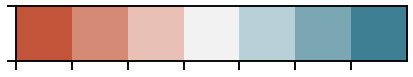

<IPython.core.display.Javascript object>

In [399]:
sns.palplot(sns.diverging_palette(20, 220, n=7))

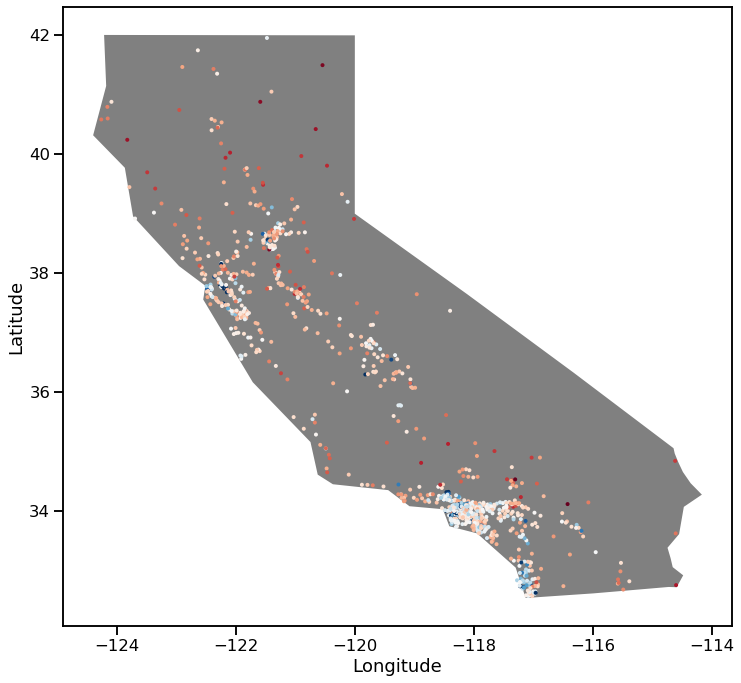

<IPython.core.display.Javascript object>

In [400]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_CA.plot(ax=ax1, color='gray')
# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    #palette="coolwarm",
    palette="RdBu",
    #palette=sns.choose_diverging_palette,
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0
)

#g._legend.set_title('SPLICE');
;

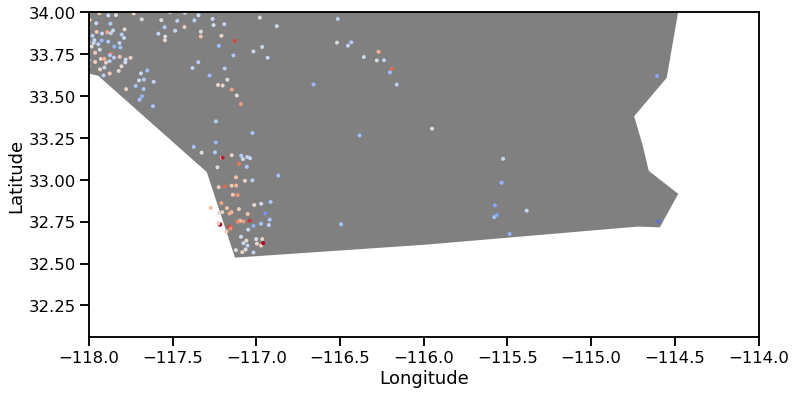

<IPython.core.display.Javascript object>

In [401]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_CA.plot(ax=ax1, color='gray')
# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    #legend='brief',
    linewidth=0
)

#g._legend.set_title('SPLICE')

ax1.set_xlim([-118, -114])
ax1.set_ylim([None, 34]);
;

### Adding zip code boundaries

geojson file?
https://catalog.data.gov/dataset/zip-codetabilation-area-boundaries/resource/ea476dcb-4846-4242-9fb3-d41afb13bf52


shape file
https://earthworks.stanford.edu/catalog/stanford-dc841dq9031

In [402]:
from shapely.geometry import Point, Polygon

<IPython.core.display.Javascript object>

In [403]:
zip_shapefile_loc = "data/references/geojson_zc_data/ZCTA2010.shp"
zip_shapefile = geopandas.read_file(zip_shapefile_loc)
zip_shapefile.head()

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_VAC,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,1536,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-195843.682 -22645.035, -195822.040 ..."
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,2062,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-201604.187 -25728.139, -202894.954 ..."
2,3,None,None,None,None,None,94560,0694560,37.520360,-122.031000,...,442,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-181289.671 -49924.408, -181237.554 ..."
3,4,None,None,None,None,None,94587,0694587,37.603151,-122.018626,...,825,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-182052.317 -43764.050, -182037.584 ..."
4,5,None,None,None,None,None,94580,0694580,37.676958,-122.133606,...,334,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-187567.889 -34790.577, -187565.018 ..."


<IPython.core.display.Javascript object>

In [404]:
# Create zipshape file that has some labels, to be used in some cases

zip_shapefile4label = zip_shapefile.copy()
zip_shapefile4label["ZCTA"] = pd.to_numeric(zip_shapefile4label["ZCTA"])
zip_shapefile_wlabels = pd.merge(
    zip_shapefile4label,
    df_wgeo[["zip_code", "County", "City", "District"]].drop_duplicates(),
    left_on="ZCTA",
    right_on="zip_code",
    how="right",
)
zip_shapefile_wlabels.head()

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,zip_code,County,City,District
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-195843.682 -22645.035, -195822.040 ...",94601,Alameda,Oakland,Oakland Unified
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-201604.187 -25728.139, -202894.954 ...",94501,Alameda,Alameda,Alameda Unified
2,3,None,None,None,None,None,94560,0694560,37.520360,-122.031000,...,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-181289.671 -49924.408, -181237.554 ...",94560,Alameda,Newark,Newark Unified
3,4,None,None,None,None,None,94587,0694587,37.603151,-122.018626,...,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-182052.317 -43764.050, -182037.584 ...",94587,Alameda,Union City,New Haven Unified
4,5,None,None,None,None,None,94580,0694580,37.676958,-122.133606,...,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-187567.889 -34790.577, -187565.018 ...",94580,Alameda,San Lorenzo,San Lorenzo Unified


<IPython.core.display.Javascript object>

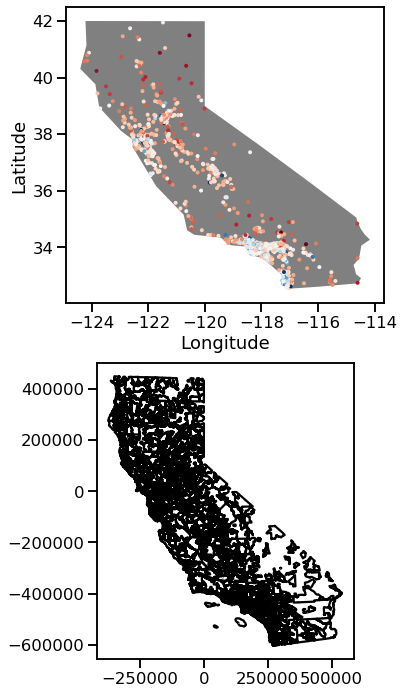

<IPython.core.display.Javascript object>

In [405]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 12))
df_CA.plot(ax=ax1, color="gray")


# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    # legend='brief',
    linewidth=0,
)

zip_shapefile.boundary.plot(ax=ax2, edgecolor="k", facecolor="none")

# g._legend.set_title('SPLICE')

It was not overlaying (see x and y axis values). I looked around and found [this page](https://stackoverflow.com/questions/56859435/geopandas-geodata-not-overlapping-shapefile-map).

I checked crs for both and they're different.

In [406]:
df_CA.crs, zip_shapefile.crs

({'init': 'epsg:4326'}, {'init': 'epsg:3310'})

<IPython.core.display.Javascript object>

In [407]:
# Make the second plot crs the same as the first
# zip_shapefile.to_crs(epsg="4326", inplace=True)

# New syntax
zip_shapefile.to_crs("epsg:4326", inplace=True)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<IPython.core.display.Javascript object>

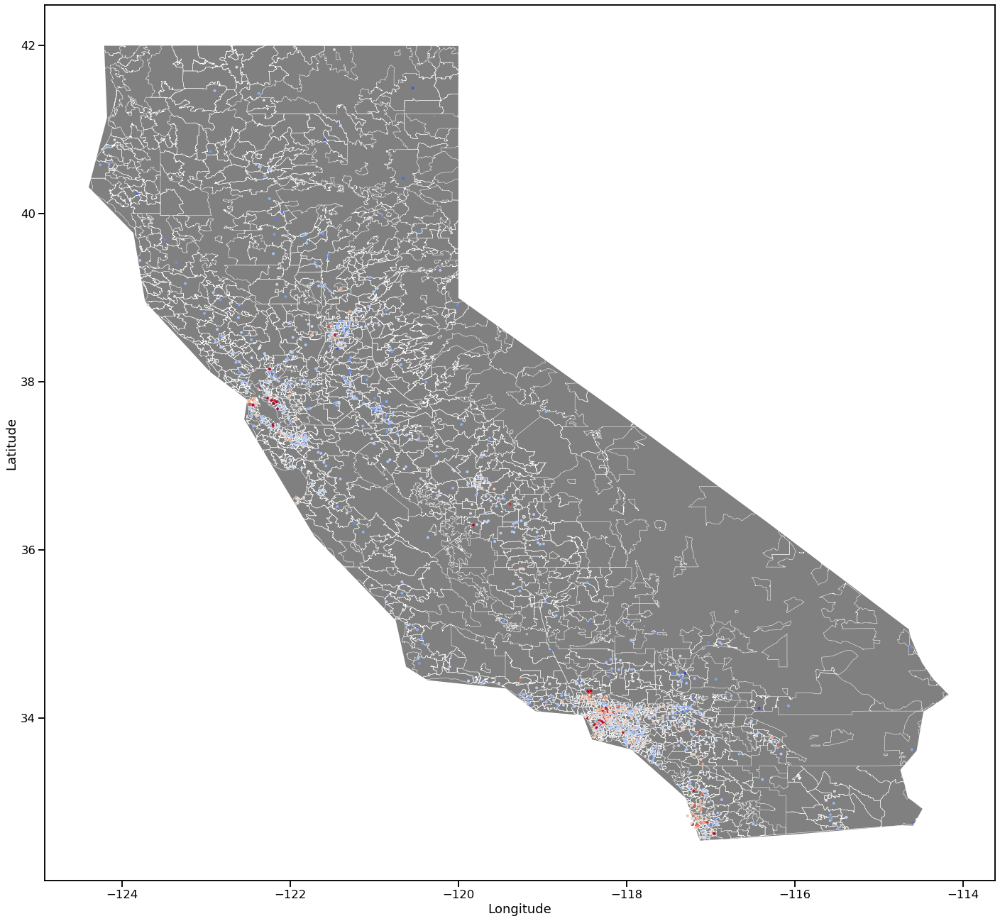

<IPython.core.display.Javascript object>

In [408]:
# Try again

f, (ax1) = plt.subplots(1, 1, figsize=(24, 24))
df_CA.plot(ax=ax1, color="gray", zorder=1)

zip_shapefile.boundary.plot(
    ax=ax1, edgecolor="white", linewidth=0.5, facecolor="none", zorder=2
)

# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="coolwarm",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    # legend='brief',
    linewidth=0,
    zorder=3,
)

# g._legend.set_title('SPLICE')

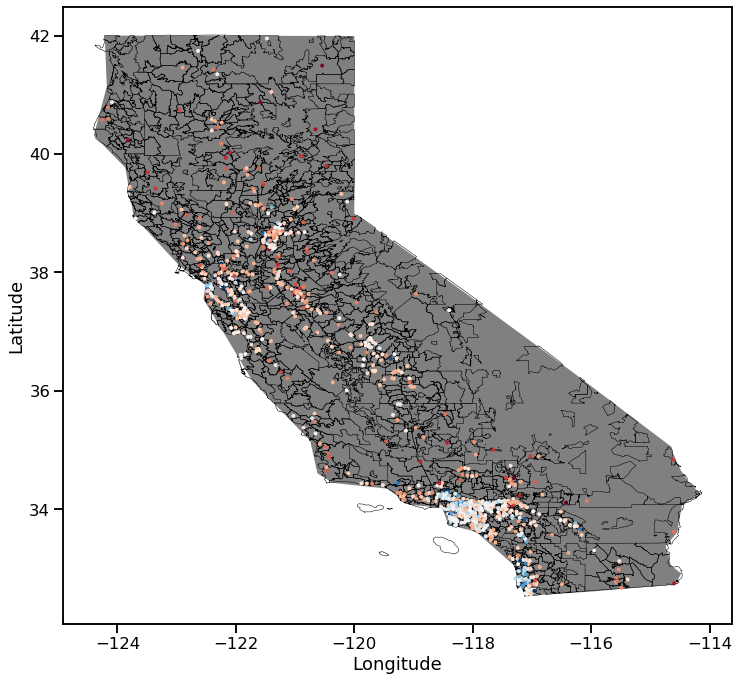

<IPython.core.display.Javascript object>

In [409]:
f, (ax1) = plt.subplots(1, 1, figsize=(12, 12))
df_CA.plot(ax=ax1, color="gray", zorder=1)

zip_shapefile.boundary.plot(
    ax=ax1, edgecolor="k", linewidth=0.5, facecolor="none", zorder=2
)

# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    # legend='brief',
    linewidth=0,
    zorder=3,
)

# g._legend.set_title('SPLICE')

### Plot for economic characteristics

In [575]:
zip_code_features = [
    "zip_code",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Walked",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force",
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces",
    "%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force",
    "highest_z_industry",
    "highest_z_wc"
]

<IPython.core.display.Javascript object>

In [576]:
df_state_info_gs_census_industry_ziponly = df_state_info_gs_census_industry[
    zip_code_features
].drop_duplicates()

<IPython.core.display.Javascript object>

In [577]:
zip_shapefile.shape

(1769, 86)

<IPython.core.display.Javascript object>

In [413]:
zip_shapefile.head(2)

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_VAC,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,1536,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7..."
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,2062,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7..."


<IPython.core.display.Javascript object>

In [414]:
[print(col) for col in zip_shapefile.columns.tolist()]

OBJECTID
CNTY_FIPS
COUNTY
TRACT
TRACT_ID
CENSUS_KEY
ZCTA
ZCTA_KEY
LATITUDE
LONGITUDE
TOT_POP
AGE_UNDER5
AGE_5TO9
AGE_10TO14
AGE_15TO19
AGE_20TO24
AGE_25TO29
AGE_30TO34
AGE_35TO39
AGE_40TO44
AGE_45TO49
AGE_50TO54
AGE_55TO59
AGE_60TO64
AGE_65TO69
AGE_70TO74
AGE_75TO79
AGE_80TO84
AGE_85_OVE
AGE16_OVER
AGE18_OVER
AGE21_OVER
AGE62_OVER
AGE65_OVER
MALE
FEMALE
AGE_MEDIAN
AGE_MEDI_1
AGE_MEDI_2
ONE_RACE
WHITE
BLACK_AFAM
AMIND_ALAN
ASIAN
NATHAW_ISL
OTHER_RACE
MULTI_RACE
HISPANIC_L
NON_HISP_L
WHITE_NHL
BLACK_AF_1
AMIND_AL_1
ASIAN_NHL
NATHAW_I_1
OTHER_NHL
MULTI_RA_1
TOT_IN_HOU
TOT_IN_GC
GC_INST
GC_NONINST
GC_CORRECT
GC_JUV
GC_NURS
GC_OTHER
HH_TOTAL
HH_FAMILY
HH_NONFAML
HH_NONFAMI
HH_NONFA_1
HH_NONFA_2
HH_NONFA_3
HH_NONFA_4
HH_WITH_UN
HH_WITH_65
HU_TOTAL
HU_OCC
HU_VAC
HU_VAC_REN
HU_VAC_SEA
HU_OCC_OWN
HU_OCC_O_1
HU_OCC_REN
HU_OCC_R_1
Shape_area
Shape_len
geometry


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

In [415]:
type(zip_shapefile)

geopandas.geodataframe.GeoDataFrame

<IPython.core.display.Javascript object>

In [416]:
zip_shapefile["ZCTA"] = pd.to_numeric(zip_shapefile["ZCTA"])
feat2plot = "Est.; INCOME_BENEFITS - Total households - Median household income ($)"
df_state_census_wgeo = pd.merge(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot]],
    zip_shapefile,
    left_on="zip_code",
    right_on="ZCTA",
)
df_state_census_wgeo.head()

,zip_code,Est.; INCOME_BENEFITS - Total households - Median household income ($),OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,...,HU_VAC,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry
0,94612,32993,736,None,None,None,None,None,94612,0694612,...,953,572,38,642,1172,7326,11997,2.205249e+06,11539.060839,"POLYGON ((-122.27449 37.80389, -122.27473 37.8..."
1,94501,72884,2,None,None,None,None,None,94501,0694501,...,2062,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7..."
2,94621,31903,1322,None,None,None,None,None,94621,0694621,...,1216,683,10,3111,11368,5362,18192,2.473526e+07,35852.648016,"POLYGON ((-122.20084 37.76913, -122.20018 37.7..."
3,94706,80970,737,None,None,None,None,None,94706,0694706,...,514,260,44,3918,9839,3997,9726,3.823563e+06,9233.319582,"POLYGON ((-122.29886 37.89847, -122.29869 37.8..."
4,94704,26478,730,None,None,None,None,None,94704,0694704,...,630,359,77,798,1790,8255,16870,2.769875e+06,13670.844000,"POLYGON ((-122.27297 37.87058, -122.27299 37.8..."


<IPython.core.display.Javascript object>

In [417]:
zip_shapefile["ZCTA"] = pd.to_numeric(zip_shapefile["ZCTA"])
feat2plot = "Est.; INCOME_BENEFITS - Total households - Median household income ($)"

zip_shapefile_wfeat = zip_shapefile.set_index("ZCTA").join(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot]].set_index(
        "zip_code"
    ),
    how="left",
)
type(zip_shapefile_wfeat)
zip_shapefile_wfeat.head()

# Can't do a merge - do a join
# df_state_census_wgeo = pd.merge(
#     df_state_info_gs_census_industry_ziponly[['zip_code', feat2plot]], zip_shapefile, how='right', left_on="zip_code", right_on="ZCTA"
# )
# df_state_census_wgeo.head()

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA_KEY,LATITUDE,LONGITUDE,TOT_POP,...,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,Est.; INCOME_BENEFITS - Total households - Median household income ($)
ZCTA,,,,,,,,,,,,,,,,,,,,,
94601,1,None,None,None,None,None,0694601,37.776711,-122.218378,50294,...,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7...",39184
94501,2,None,None,None,None,None,0694501,37.774084,-122.278049,60212,...,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7...",72884
94560,3,None,None,None,None,None,0694560,37.520360,-122.031000,42573,...,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-122.05499 37.54960, -122.05441 37.5...",86757
94587,4,None,None,None,None,None,0694587,37.603151,-122.018626,69516,...,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-122.06515 37.60485, -122.06499 37.6...",85521
94580,5,None,None,None,None,None,0694580,37.676958,-122.133606,27152,...,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-122.12999 37.68445, -122.12995 37.6...",71120


<IPython.core.display.Javascript object>

### Local median income

TypeError: '<' not supported between instances of 'str' and 'float'

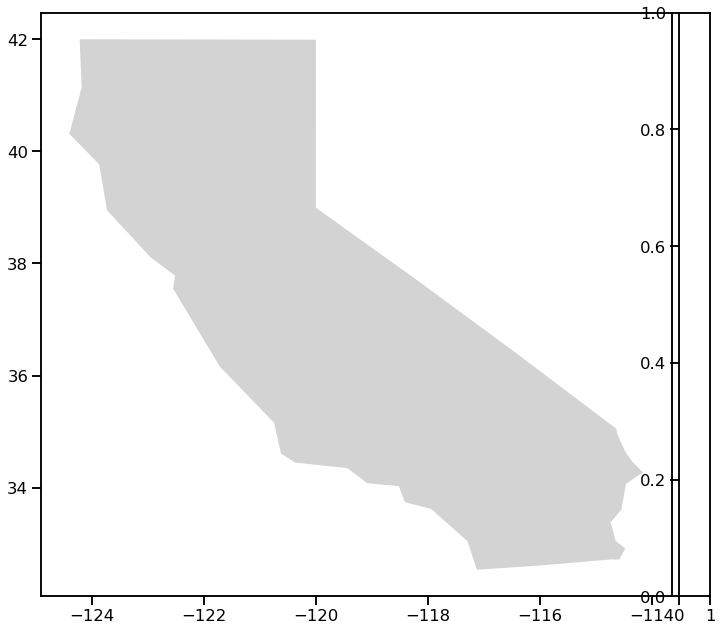

<IPython.core.display.Javascript object>

In [418]:
zip_shapefile["ZCTA"] = pd.to_numeric(zip_shapefile["ZCTA"])
feat2plot1 = "Est.; INCOME_BENEFITS - Total households - Median household income ($)"
zip_shapefile_wfeat1 = zip_shapefile.set_index("ZCTA").join(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot1]].set_index(
        "zip_code"
    ),
    how="left",
)

f, (ax1) = plt.subplots(1, 1, figsize=(12, 12))
df_CA.plot(ax=ax1, color="lightgray", zorder=0)

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)

zip_shapefile_wfeat1.plot(
    column=feat2plot1,
    ax=ax1,
    legend=True,
    edgecolor="black",
    cmap="RdBu",
    linewidth=0.2,
    cax=cax,
    legend_kwds={"label": "median household income", "orientation": "vertical"},
    zorder=1,
)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


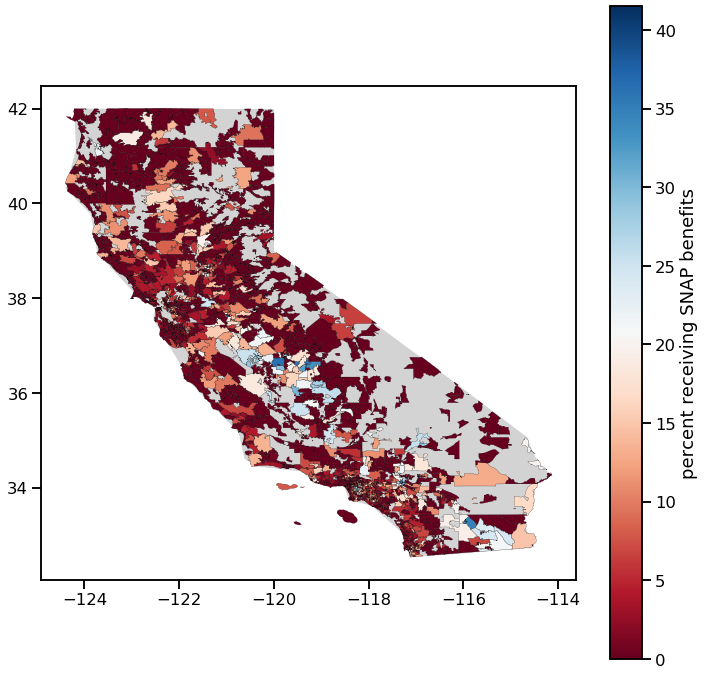

<IPython.core.display.Javascript object>

In [419]:
feat2plot = "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months"

zip_shapefile_wfeat = zip_shapefile.set_index("ZCTA").join(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot]].set_index(
        "zip_code"
    ),
    how="left",
)

f, (ax1) = plt.subplots(1, 1, figsize=(12, 12))
df_CA.plot(ax=ax1, color="lightgray", zorder=1)


zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax1,
    legend=True,
    edgecolor="black",
    cmap="RdBu",
    linewidth=0.2,
    legend_kwds={"label": "percent receiving SNAP benefits", "orientation": "vertical"},
)

### CA counties

In [420]:
bay_area_counties = [
    "San Francisco",
    "San Mateo",
    "Santa Clara",
    "Alameda",
    "Fremont",
    "Marin",
]

county_df = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["County"].isin(bay_area_counties)
].copy()


ba_lat_min, ba_lat_max, ba_long_min, ba_long_max = (
    county_df["Latitude"].min(),
    county_df["Latitude"].max(),
    county_df["Longitude"].min(),
    county_df["Longitude"].max(),
)
ba_lat_min, ba_lat_max, ba_long_min, ba_long_max

(36.997203000000006, 38.247656, -122.89528, -121.57598999999999)

<IPython.core.display.Javascript object>

In [421]:
county_df = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["County"] == "Los Angeles"
].copy()

la_lat_min, la_lat_max, la_long_min, la_long_max = (
    county_df["Latitude"].min(),
    county_df["Latitude"].max(),
    county_df["Longitude"].min(),
    county_df["Longitude"].max(),
)
la_lat_min, la_lat_max, la_long_min, la_long_max

(33.73059, 34.69911, -118.74948, -117.72041000000002)

<IPython.core.display.Javascript object>

In [422]:
county_df = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["County"] == "San Diego"
].copy()

sd_lat_min, sd_lat_max, sd_long_min, sd_long_max = (
    float(county_df["Latitude"].min()),
    float(county_df["Latitude"].max()),
    float(county_df["Longitude"].min()),
    float(county_df["Longitude"].max()),
)
sd_lat_min, sd_lat_max, sd_long_min, sd_long_max

(32.566438, 33.349505, -117.37414, -116.38373)

<IPython.core.display.Javascript object>

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


(32.566438, 33.349505)

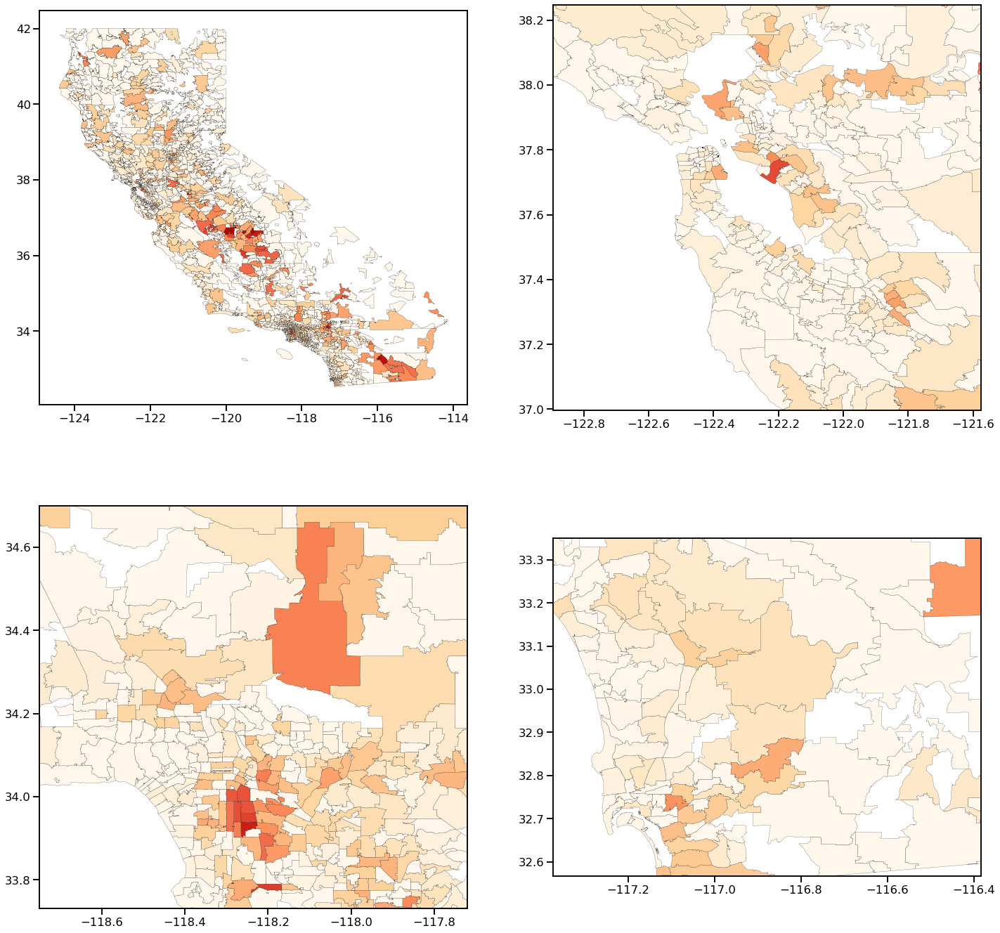

<IPython.core.display.Javascript object>

In [423]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 24))

# CA
# df_CA.plot(ax=ax1, color="gray", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax1,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)

# Bay Area
df_CA.plot(ax=ax2, color="white", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax2,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)
ax2.set_xlim([ba_long_min, ba_long_max])
ax2.set_ylim([ba_lat_min, ba_lat_max])


# LA
df_CA.plot(ax=ax3, color="white", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax3,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)
ax3.set_xlim([la_long_min, la_long_max])
ax3.set_ylim([la_lat_min, la_lat_max])


# SD
df_CA.plot(ax=ax4, color="white", zorder=1)
zip_shapefile_wfeat.plot(
    column=feat2plot,
    ax=ax4,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)

ax4.set_xlim([sd_long_min, sd_long_max])
ax4.set_ylim([sd_lat_min, sd_lat_max])

### Different CA

The one I got originally does not have good definition for the Bay Area.

In [683]:
# File from http://geojson.xyz/

url = "https://d2ad6b4ur7yvpq.cloudfront.net/naturalearth-3.3.0/ne_110m_admin_1_states_provinces_scale_rank.geojson"
df_states = geopandas.read_file(url)
df_states.head()
# df_CA2 = df_states[df_states["name"] == "California"]
# df_CA2.head()

,scalerank,adm1_code,featureclass,geometry
0,2,USA-3514,Admin-1 scale rank,"POLYGON ((-89.59941 48.01027, -89.48888 48.013..."
1,2,USA-3515,Admin-1 scale rank,"POLYGON ((-111.19419 44.56116, -111.29155 44.7..."
2,2,USA-3516,Admin-1 scale rank,"POLYGON ((-96.60136 46.35136, -96.53891 46.199..."
3,2,USA-3517,Admin-1 scale rank,"MULTIPOLYGON (((-155.93665 19.05939, -155.9080..."
4,2,USA-3518,Admin-1 scale rank,"POLYGON ((-111.04973 44.48816, -111.05024 42.0..."


<IPython.core.display.Javascript object>

In [681]:
df_states

,scalerank,name,adm0_a3,adm0_name,mapcolor9,mapcolor13,featureclass,geometry
0,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-74.67903 41.35549, -74.84044 41.4..."
1,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-87.59780 45.10629, -87.61292 45.1..."
2,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-91.22820 43.50125, -91.25466 43.6..."
3,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-80.51893 40.64111, -80.51627 41.9..."
4,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-84.80676 41.67774, -84.29506 41.6..."
...,...,...,...,...,...,...,...,...
105,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-114.03422 41.99312, -117.02825 42..."
106,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-70.64573 43.09008, -70.81505 42.8..."
107,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-70.64573 43.09008, -70.75102 43.0..."
108,2,None,USA,United States of America,1,1,Admin-1 boundary,"LINESTRING (-72.45707 42.72708, -71.24898 42.7..."


<IPython.core.display.Javascript object>

(-125, -115)

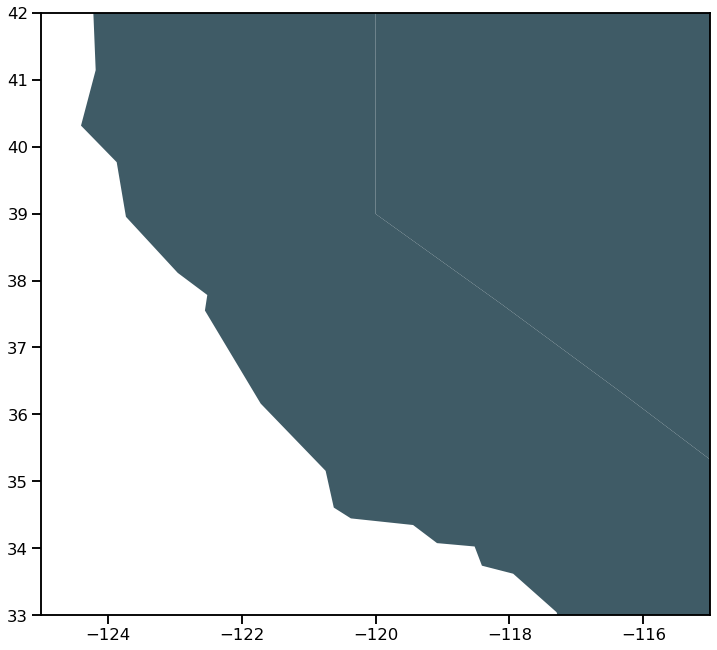

<IPython.core.display.Javascript object>

In [686]:
f, ax1 = plt.subplots(figsize=(12, 12))
df_states.plot(ax=ax1, color=B_slate)
ax1.set_ylim(33, 42)
ax1.set_xlim(-125, -115)

## Stanford Earthworks county file

In [424]:
sew_shapefile_loc = "data/references/stanford_ew_data/cnty24k09_1_multipart.shp"
sew_sf = geopandas.read_file(sew_shapefile_loc)
sew_sf.head()

,NAME_PCASE,NAME_UCASE,FMNAME_PC,FMNAME_UC,ABBREV,NUM,ABCODE,ANSI,Shape_Leng,Shape_Area,geometry
0,Siskiyou,SISKIYOU,Siskiyou County,SISKIYOU COUNTY,SIS,47,c047,093,672205.907573,1.643940e+10,"POLYGON ((-121409.383 352836.156, -122787.000 ..."
1,Del Norte,DEL NORTE,Del Norte County,DEL NORTE COUNTY,DNT,8,c008,015,314234.542738,2.626276e+09,"MULTIPOLYGON (((-349081.500 420895.000, -34927..."
2,Modoc,MODOC,Modoc County,MODOC COUNTY,MOD,25,c025,049,423574.415010,1.088488e+10,"POLYGON ((-120188.047 443056.938, -118144.953 ..."
3,Trinity,TRINITY,Trinity County,TRINITY COUNTY,TRI,53,c053,105,611269.176825,8.307254e+09,"POLYGON ((-225262.531 309846.500, -225280.500 ..."
4,Shasta,SHASTA,Shasta County,SHASTA COUNTY,SHA,45,c045,089,537564.913338,9.976444e+09,"POLYGON ((-184515.750 264676.375, -184542.047 ..."


<IPython.core.display.Javascript object>

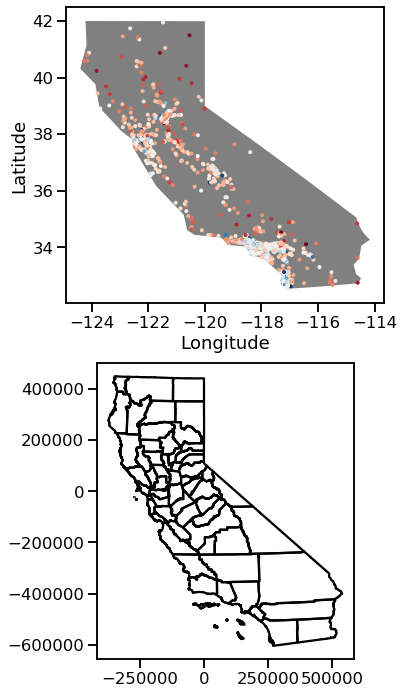

<IPython.core.display.Javascript object>

In [425]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 12))
df_CA.plot(ax=ax1, color="gray")

# ax1.scatter(pd.to_numeric(df_wgeo["Longitude"]), pd.to_numeric(df_wgeo["Latitude"]), c=pd.to_numeric(df_wgeo["Latitude"], s=2**0)
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    legend=None,
    # legend='brief',
    linewidth=0,
)

sew_sf.boundary.plot(ax=ax2, edgecolor="k", facecolor="none")

# g._legend.set_title('SPLICE')

**Update CRS**

In [426]:
sew_sf.crs

{'init': 'epsg:3310'}

<IPython.core.display.Javascript object>

In [427]:
df_CA.crs, zip_shapefile.crs

({'init': 'epsg:4326'}, 'epsg:4326')

<IPython.core.display.Javascript object>

In [428]:
# Make the second plot crs the same as the shapefile tried earlier
sew_sf.to_crs("epsg:4326", inplace=True)

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


<IPython.core.display.Javascript object>

### School locations in state

Create points for labeling

Taken from here: https://stackoverflow.com/questions/38899190/geopandas-label-polygons

In [429]:
sew_sf_text = sew_sf.copy()

sew_sf_text["coords"] = sew_sf_text["geometry"].apply(
    lambda x: x.representative_point().coords[:]
)
sew_sf_text["coords"] = [coords[0] for coords in sew_sf_text["coords"]]

<IPython.core.display.Javascript object>

In [430]:
sew_sf_text.head(3)

,NAME_PCASE,NAME_UCASE,FMNAME_PC,FMNAME_UC,ABBREV,NUM,ABCODE,ANSI,Shape_Leng,Shape_Area,geometry,coords
0,Siskiyou,SISKIYOU,Siskiyou County,SISKIYOU COUNTY,SIS,47,c047,093,672205.907573,1.643940e+10,"POLYGON ((-121.44597 41.18390, -121.46238 41.1...","(-122.54435416528992, 41.50072231870031)"
1,Del Norte,DEL NORTE,Del Norte County,DEL NORTE COUNTY,DNT,8,c008,015,314234.542738,2.626276e+09,"MULTIPOLYGON (((-124.19097 41.73619, -124.1933...","(-123.90578607724461, 41.69084678856494)"
2,Modoc,MODOC,Modoc County,MODOC COUNTY,MOD,25,c025,049,423574.415010,1.088488e+10,"POLYGON ((-121.44784 41.99739, -121.42322 41.9...","(-120.72427521391177, 41.59353861196223)"


<IPython.core.display.Javascript object>

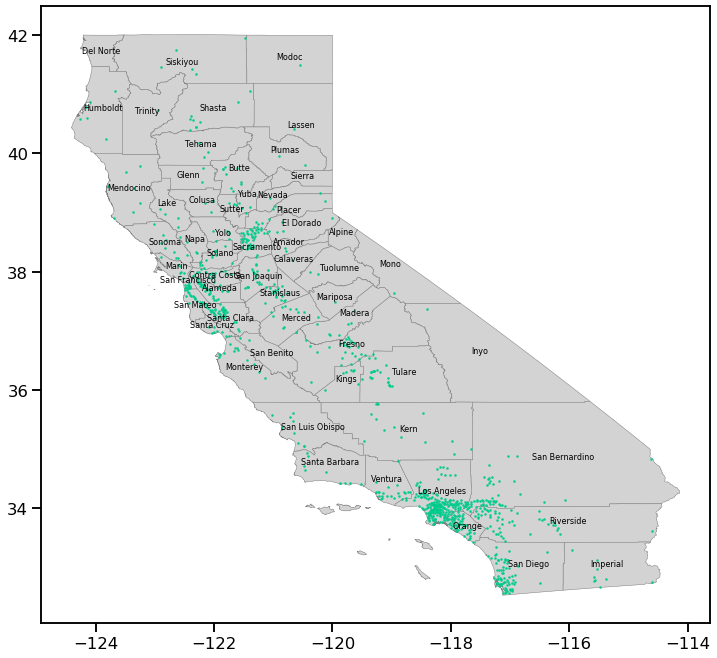

<IPython.core.display.Javascript object>

In [431]:
f, ax1 = plt.subplots(figsize=(12, 12))
sew_sf.boundary.plot(
    ax=ax1, linewidth=0.5, edgecolor="gray", facecolor="lightgray", zorder=0
)
ax1.scatter(
    pd.to_numeric(df_wgeo["Longitude"]),
    pd.to_numeric(df_wgeo["Latitude"]),
    c=B_green,
    s=2 ** 0,
    zorder=1,
)

# Label counties
for idx, row in sew_sf_text.iterrows():
    plt.annotate(
        s=row["NAME_PCASE"],
        xy=row["coords"],
        horizontalalignment="center",
        fontsize=8,
        color="black",
    )


plt.savefig(figure_loc + "CA_map_school_loc_counties.png")

Changed legend to be a colorbar [here](https://stackoverflow.com/questions/49761221/make-seaborn-show-a-colorbar-instead-of-a-legend-when-using-hue-in-a-bar-plot)
<br>
Matched color bar size to graph [here](https://stackoverflow.com/questions/18195758/set-matplotlib-colorbar-size-to-match-graph)

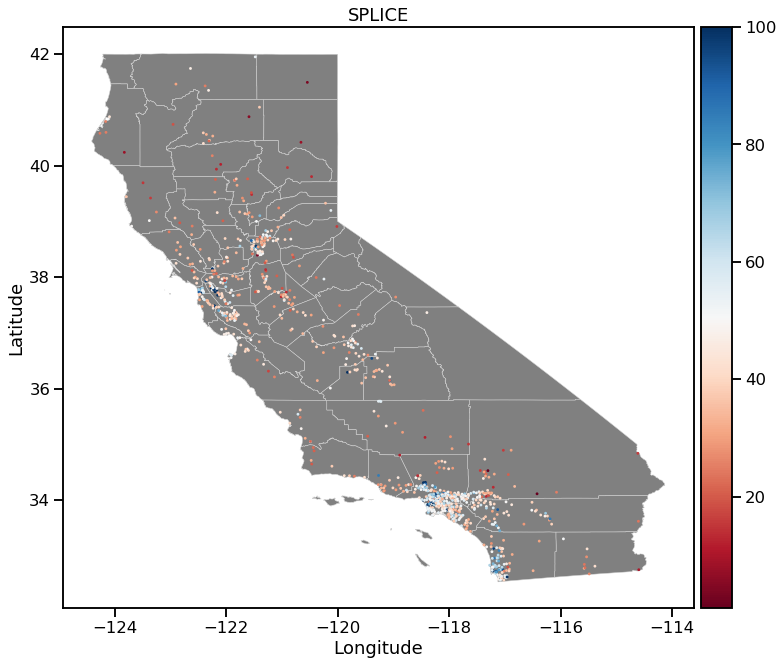

<IPython.core.display.Javascript object>

In [432]:
f, ax1 = plt.subplots(figsize=(12, 12))
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 3,
    ax=ax1,
    linewidth=0,
    zorder=1
)

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE')

plt.savefig(figure_loc + 'CA_map_school_SPLICE.png');
;

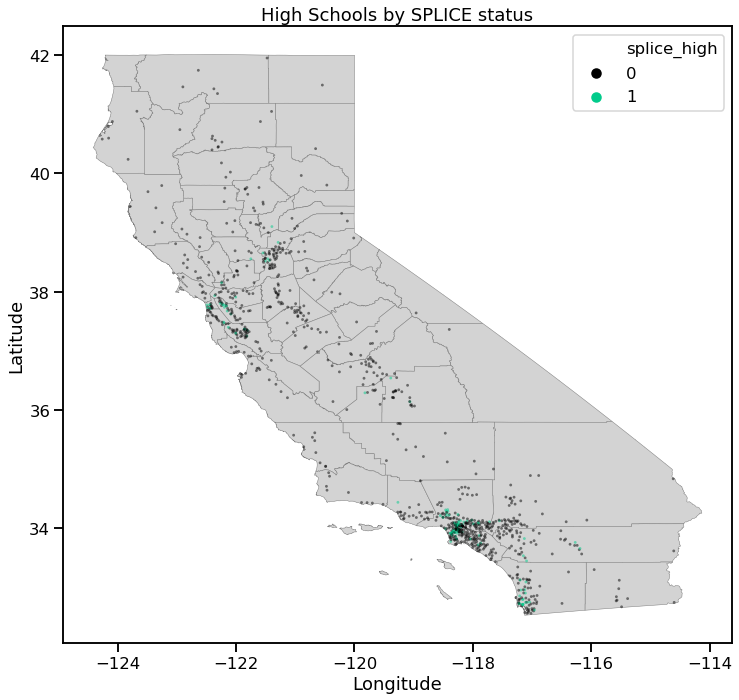

<IPython.core.display.Javascript object>

In [481]:
# For classification model
f, ax1 = plt.subplots(figsize=(12, 12))
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='gray', facecolor='lightgray', zorder=0)
# zip_shapefile.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='gray', zorder=2);

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette=['black', B_green],
    alpha=0.5,
    hue="splice_high",
    s=2 ** 3,
    ax=ax1,
    linewidth=0,
    zorder=1
)

ax1.legend()
ax1.set_title('High Schools by SPLICE status')

plt.savefig(figure_loc + 'Map_school_exceptionalSPLICE_CA.png', dpi=300);
;

In [443]:
# Norcal_area
nc_lat_min, nc_lat_max, nc_long_min, nc_long_max = (37, 39, -123, -118)

# Socal_area
sc_lat_min, sc_lat_max, sc_long_min, sc_long_max = (32, 35, -119, -114)

<IPython.core.display.Javascript object>

In [476]:
sew_sf.head()

,NAME_PCASE,NAME_UCASE,FMNAME_PC,FMNAME_UC,ABBREV,NUM,ABCODE,ANSI,Shape_Leng,Shape_Area,geometry
0,Siskiyou,SISKIYOU,Siskiyou County,SISKIYOU COUNTY,SIS,47,c047,093,672205.907573,1.643940e+10,"POLYGON ((-121.44597 41.18390, -121.46238 41.1..."
1,Del Norte,DEL NORTE,Del Norte County,DEL NORTE COUNTY,DNT,8,c008,015,314234.542738,2.626276e+09,"MULTIPOLYGON (((-124.19097 41.73619, -124.1933..."
2,Modoc,MODOC,Modoc County,MODOC COUNTY,MOD,25,c025,049,423574.415010,1.088488e+10,"POLYGON ((-121.44784 41.99739, -121.42322 41.9..."
3,Trinity,TRINITY,Trinity County,TRINITY COUNTY,TRI,53,c053,105,611269.176825,8.307254e+09,"POLYGON ((-122.66795 40.77637, -122.66814 40.7..."
4,Shasta,SHASTA,Shasta County,SHASTA COUNTY,SHA,45,c045,089,537564.913338,9.976444e+09,"POLYGON ((-122.17328 40.37906, -122.17359 40.3..."


<IPython.core.display.Javascript object>

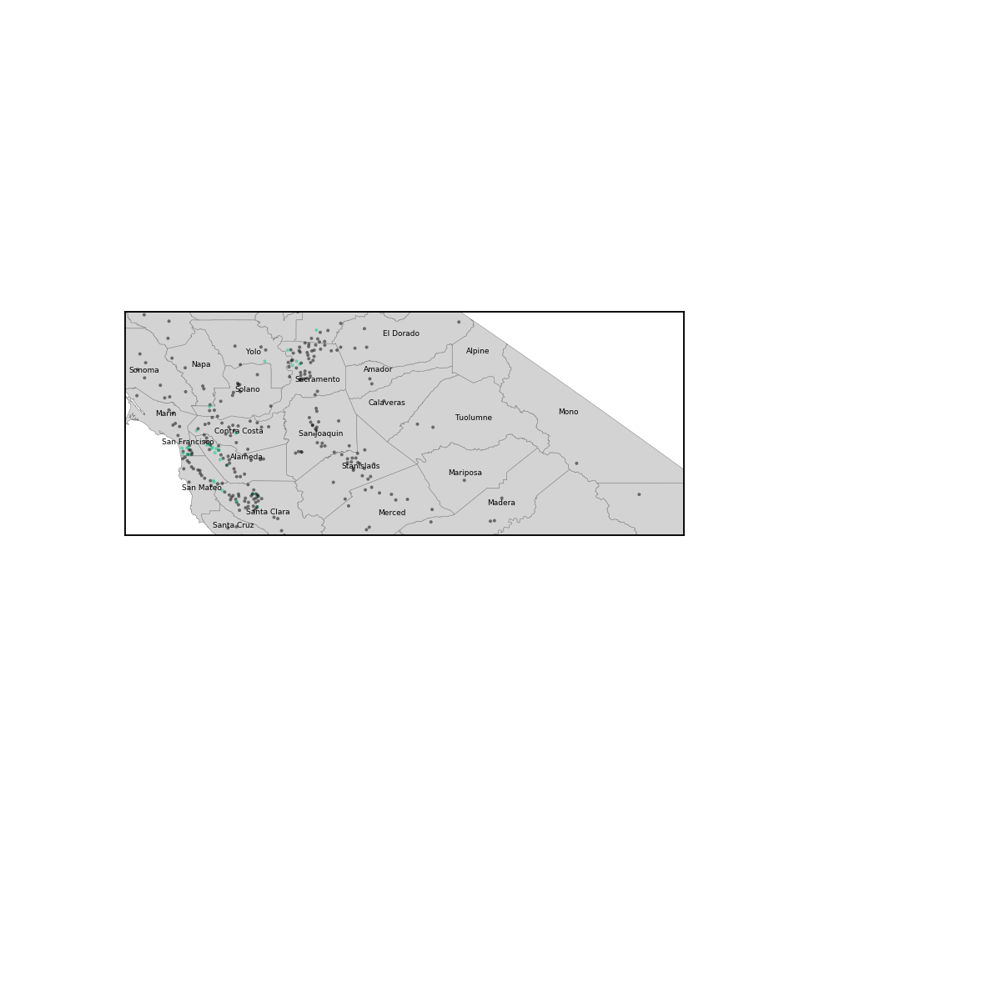

<IPython.core.display.Javascript object>

In [482]:
# For classification model
f, ax1 = plt.subplots(figsize=(12, 12))
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='gray', facecolor='lightgray', zorder=0)
# zip_shapefile.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='gray', zorder=2);

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette=['black', B_green],
    alpha=0.5,
    hue="splice_high",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=1
)

# Label counties
for idx, row in sew_sf_text.iterrows():
    ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                 horizontalalignment='center', fontsize=9, color='black')

# Label counties
# for idx, row in sew_sf.iterrows():
#     ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
#                  horizontalalignment='center', fontsize=9, color='black')

# ax1.legend('none')
ax1.get_legend().remove()
# ax1.set_title('High Schools by SPLICE status, Northern CA')

ax1.set_xlim([nc_long_min, nc_long_max])
ax1.set_ylim([nc_lat_min, nc_lat_max])

# Remove tick labels
ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)

plt.savefig(figure_loc + 'Map_school_exceptionalSPLICE_Norcal.png', dpi=300);
;

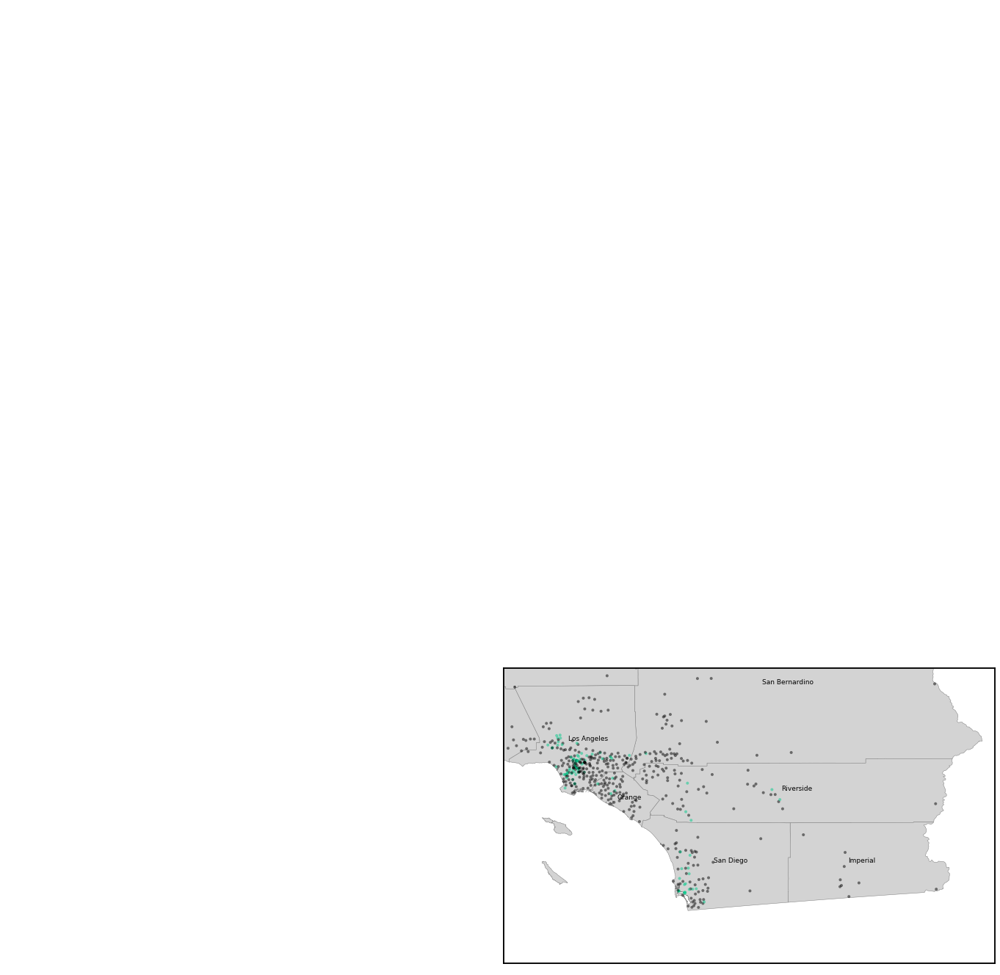

<IPython.core.display.Javascript object>

In [483]:
# For classification model
f, ax1 = plt.subplots(figsize=(12, 12))
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='gray', facecolor='lightgray', zorder=0)
# zip_shapefile.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='gray', zorder=2);

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette=['black', B_green],
    alpha=0.5,
    hue="splice_high",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=1
)

# Label counties
for idx, row in sew_sf_text.iterrows():
    ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                 horizontalalignment='center', fontsize=9, color='black')

# ax1.legend('none')
ax1.get_legend().remove()
# ax1.set_title('High Schools by SPLICE status, Northern CA')

ax1.set_xlim([sc_long_min, sc_long_max])
ax1.set_ylim([sc_lat_min, sc_lat_max])
# ax1.set_xticklabels(None)

ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)

plt.savefig(figure_loc + 'Map_school_exceptionalSPLICE_Socal.png', dpi=300);
;

## Check SD County and include zip code

Use zip code shapefile with labels

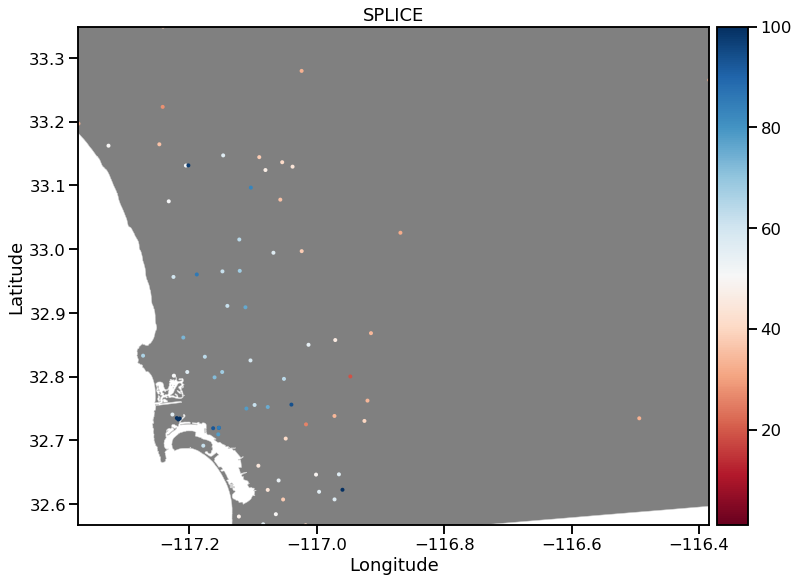

<IPython.core.display.Javascript object>

In [42]:
county_df = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["County"] == "San Diego"
].copy()

sd_lat_min, sd_lat_max, sd_long_min, sd_long_max = (
    float(county_df["Latitude"].min()),
    float(county_df["Latitude"].max()),
    float(county_df["Longitude"].min()),
    float(county_df["Longitude"].max()),
)
sd_lat_min, sd_lat_max, sd_long_min, sd_long_max

f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Zip code
zip_shapefile_wlabels.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='none', zorder=1)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=2
)
ax1.set_xlim([sd_long_min, sd_long_max])
ax1.set_ylim([sd_lat_min, sd_lat_max])

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE');
;

**Do some labeling of zip code with city or school district**

In [548]:
zip_shapefile_wlabels.head(2)

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,zip_code,City,District,coords
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7...",94601,Oakland,Oakland Unified,"(-122.21639276889405, 37.77529349962347)"
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7...",94501,Alameda,Alameda Unified,"(-122.28279858566748, 37.77500700030755)"


<IPython.core.display.Javascript object>

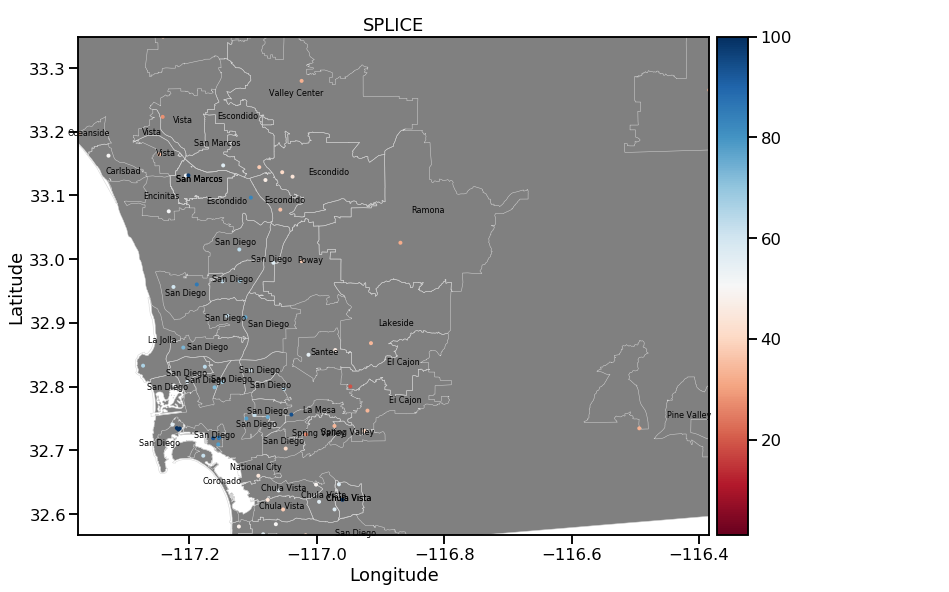

<IPython.core.display.Javascript object>

In [853]:
county_df = df_state_info_gs_census_industry[
    df_state_info_gs_census_industry["County"] == "San Diego"
].copy()

sd_lat_min, sd_lat_max, sd_long_min, sd_long_max = (
    float(county_df["Latitude"].min()),
    float(county_df["Latitude"].max()),
    float(county_df["Longitude"].min()),
    float(county_df["Longitude"].max()),
)
sd_lat_min, sd_lat_max, sd_long_min, sd_long_max

f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Zip code
zip_shapefile_wlabels.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='none', zorder=1)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=2
)
ax1.set_xlim([sd_long_min, sd_long_max])
ax1.set_ylim([sd_lat_min, sd_lat_max])

# Label cities - limit to SD
zip_shapefile_wlabels_SD = zip_shapefile_wlabels[zip_shapefile_wlabels['County']=='San Diego'].copy()
zip_shapefile_wlabels_SD['coords'] = zip_shapefile_wlabels_SD['geometry'].apply(lambda x: x.representative_point().coords[:])
zip_shapefile_wlabels_SD['coords'] = [coords[0] for coords in zip_shapefile_wlabels_SD['coords']]

for idx, row in zip_shapefile_wlabels_SD.iterrows():
    ax1.annotate(s=row['City'], xy=row['coords'],
                 horizontalalignment='center', fontsize=8, color='black')

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE')

plt.savefig(figure_loc + 'SD_map_school_loc_neighborhoods.png');
;

**Pick one location to label for each city**

In [557]:
# Label cities - limit to SD
zip_shapefile_wlabels_SD = zip_shapefile_wlabels[
    zip_shapefile_wlabels["County"] == "San Diego"
].copy()
zip_shapefile_wlabels_SD["coords"] = zip_shapefile_wlabels_SD["geometry"].apply(
    lambda x: x.representative_point().coords[:]
)
zip_shapefile_wlabels_SD["coords"] = [
    coords[0] for coords in zip_shapefile_wlabels_SD["coords"]
]
for idx, row in zip_shapefile_wlabels_SD.iterrows():
    ax1.annotate(
        s=row["City"],
        xy=row["coords"],
        horizontalalignment="center",
        fontsize=8,
        color="black",
    )

<IPython.core.display.Javascript object>

In [559]:
zip_shapefile_wlabels_SD.head(2)

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,zip_code,County,City,District,coords
60,162,None,None,None,None,None,92111,0692111,32.806482,-117.168861,...,8067,23711,2.191061e+07,30104.584638,"POLYGON ((-117.16476 32.82585, -117.16513 32.8...",92111,San Diego,San Diego,San Diego Unified,"(-117.17390980688711, 32.807203499931894)"
61,164,None,None,None,None,None,92037,0692037,32.856552,-117.252008,...,7198,14751,3.909865e+07,42239.295039,"POLYGON ((-117.28240 32.82618, -117.28255 32.8...",92037,San Diego,La Jolla,San Diego Unified,"(-117.24288232789729, 32.8699584997926)"


<IPython.core.display.Javascript object>

**Use the average location by Euclidean distance for each city**

In [563]:
zip_shapefile_wlabels_SD[zip_shapefile_wlabels_SD["City"] == "Chula Vista"].loc[
    :, ["City", "coords"]
]

,City,coords
187,Chula Vista,"(-117.05138249807852, 32.63637399970967)"
277,Chula Vista,"(-117.05491244963693, 32.60806999998113)"
614,Chula Vista,"(-116.94924761077982, 32.62153199993554)"
615,Chula Vista,"(-116.94924761077982, 32.62153199993554)"
740,Chula Vista,"(-116.9885546680404, 32.62658149992055)"


<IPython.core.display.Javascript object>

In [769]:
def return_avg_loc(shapefile, category, min_fontsize):
    """
    Returns the average location based on city, district, etc.
    Also returns fontsize, based on the number of values each category member has
    """
    members = shapefile[category].unique()

    # No. of entries
    df_category_value = pd.DataFrame(shapefile[category].value_counts())

    for member in members:
        member_coords = (
            shapefile[shapefile[category] == member].loc[:, "coords"].tolist()
        )  # Pandas series, limit to one member
        long_vals = list()
        lat_vals = list()
        for i in member_coords:
            long_vals.append(i[0])
            lat_vals.append(i[1])

        df_category_value.loc[member, "avg_long"] = np.mean(long_vals)
        df_category_value.loc[member, "avg_lat"] = np.mean(lat_vals)

    df_category_value["avg_coord"] = list(
        zip(df_category_value["avg_long"], df_category_value["avg_lat"])
    )
    df_category_value.columns = ["n_entries", "avg_long", "avg_lat", "avg_coord"]

    # Fontsize formatting
    min_fontsize = min_fontsize
    max_fontsize = min_fontsize + 8
    fontsize_diff = max_fontsize - min_fontsize

    n_categories_max = df_category_value["n_entries"].max()
    n_categories_min = df_category_value["n_entries"].min()
    n_categories_diff = n_categories_max - n_categories_min

    x_fs = df_category_value["n_entries"] * (fontsize_diff / n_categories_diff)
    fontsize = round(x_fs + my_min_fontsize)
    df_category_value["fontsize"] = fontsize

    # Order by the latitude to make reading maps easier
    df_category_value.sort_values(by="avg_lat", inplace=True)

    df_category_value.reset_index(inplace=True)

    return df_category_value

<IPython.core.display.Javascript object>

In [770]:
df_sd_avgtext_loc = return_avg_loc(zip_shapefile_wlabels_SD, "City", min_fontsize=10)
df_sd_avgtext_loc.head()

,index,n_entries,avg_long,avg_lat,avg_coord,fontsize
0,Imperial Beach,1,-117.128765,32.562040,"(-117.12876519652977, 32.56203999989643)",10.0
1,Chula Vista,5,-116.998669,32.622818,"(-116.99866896746309, 32.62281789989649)",12.0
2,Coronado,1,-117.148645,32.648645,"(-117.14864456992288, 32.648645000054955)",10.0
3,National City,1,-117.096372,32.670118,"(-117.09637241535455, 32.670117999906026)",10.0
4,Spring Valley,2,-116.974190,32.724272,"(-116.9741896192858, 32.724271999781905)",11.0


<IPython.core.display.Javascript object>

In [88]:
def get_map_boundaries(category, search_list, buffer):

    category_df = df_state_info_gs_census_industry[
        df_state_info_gs_census_industry[category].isin(search_list)
    ].copy()

    lat_diff = float(category_df["Latitude"].max()) - float(
        category_df["Latitude"].min()
    )
    long_diff = float(category_df["Longitude"].max()) - float(
        category_df["Longitude"].min()
    )

    lat_min, lat_max, long_min, long_max = (
        float(category_df["Latitude"].min()) - buffer * lat_diff,
        float(category_df["Latitude"].max()) + buffer * lat_diff,
        float(category_df["Longitude"].min()) - buffer * long_diff,
        float(category_df["Longitude"].max()) + buffer * lat_diff,
    )

    return lat_min, lat_max, long_min, long_max

<IPython.core.display.Javascript object>

In [89]:
sd_boundaries = get_map_boundaries("County", search_list=["San Diego"], buffer=0.1)
sd_boundaries

(32.4881313, 33.4278117, -117.473181, -116.3054233)

<IPython.core.display.Javascript object>

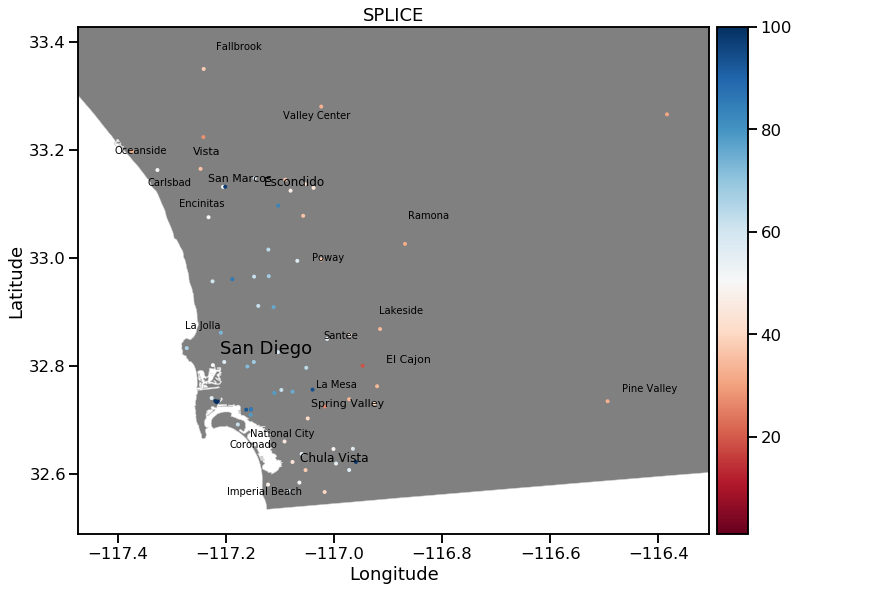

<IPython.core.display.Javascript object>

In [755]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Zip code
# zip_shapefile_wlabels.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='none', zorder=1)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=2
)
ax1.set_xlim([sd_boundaries[2], sd_boundaries[3]])
ax1.set_ylim([sd_boundaries[0], sd_boundaries[1]])

# Label cities - limit to SD
# Extract local coordinates
zip_shapefile_wlabels_SD = zip_shapefile_wlabels[zip_shapefile_wlabels['County']=='San Diego'].copy()
zip_shapefile_wlabels_SD['coords'] = zip_shapefile_wlabels_SD['geometry'].apply(lambda x: x.representative_point().coords[:])
zip_shapefile_wlabels_SD['coords'] = [coords[0] for coords in zip_shapefile_wlabels_SD['coords']]

# Generate average locations for text and label
df_sd_avgtext_loc = return_avg_loc(zip_shapefile_wlabels_SD, 'City',  min_fontsize=10)
for idx, row in df_sd_avgtext_loc.iterrows():
    ax1.annotate(s=row['index'], xy=row['avg_coord'],
                 horizontalalignment='center', fontsize=row['fontsize'], color='black')

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE');
;

### Other CA counties

#### Bay Area

In [90]:
ba_boundaries = get_map_boundaries(
    "County",
    search_list=[
        "San Francisco",
        "San Mateo",
        "Santa Clara",
        "Alameda",
        "Fremont",
        "Marin",
    ],
    buffer=0.1,
)
ba_boundaries

(36.87215770000001, 38.372701299999996, -123.027209, -121.45094470000001)

<IPython.core.display.Javascript object>

In [91]:
zip_shapefile_wlabels_BA

NameError: name 'zip_shapefile_wlabels_BA' is not defined

<IPython.core.display.Javascript object>

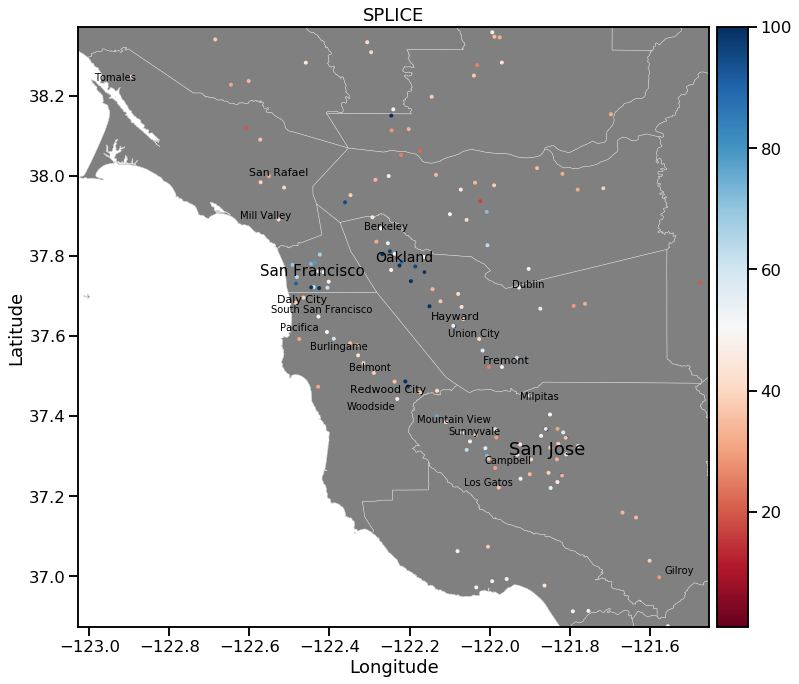

<IPython.core.display.Javascript object>

In [857]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Zip code
# zip_shapefile_wlabels.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='none', zorder=1)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=2
)
ax1.set_xlim([ba_boundaries[2], ba_boundaries[3]])
ax1.set_ylim([ba_boundaries[0], ba_boundaries[1]])

# Label cities - limit to Bay Area
# Extract local coordinates
zip_shapefile_wlabels_BA = zip_shapefile_wlabels[zip_shapefile_wlabels['County'].isin(["San Francisco",
    "San Mateo",
    "Santa Clara",
    "Alameda",
    "Fremont",
    "Marin"])].copy()
zip_shapefile_wlabels_BA['coords'] = zip_shapefile_wlabels_BA['geometry'].apply(lambda x: x.representative_point().coords[:])
zip_shapefile_wlabels_BA['coords'] = [coords[0] for coords in zip_shapefile_wlabels_BA['coords']]

# Generate average locations for text and label
df_ba_avgtext_loc = return_avg_loc(zip_shapefile_wlabels_BA, 'City',  min_fontsize=10)
for idx, row in df_ba_avgtext_loc.iterrows():
    if idx % 2 == 0:
        # Plot half of them to make it more readable
        ax1.annotate(s=row['index'], xy=row['avg_coord'],
                     horizontalalignment='center', fontsize=row['fontsize'], color='black')

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE');

plt.savefig(figure_loc + 'BA_map_school_loc_cities.png');
;

Blog post idea?:
- show how I made this map
- color bar
- text more readable, size proportional to number
- get Bay

#### Los Angeles

In [92]:
la_boundaries = get_map_boundaries("County", search_list=["Los Angeles"], buffer=0.1)
la_boundaries

(33.633738, 34.795961999999996, -118.85238700000001, -117.62355800000002)

<IPython.core.display.Javascript object>

''

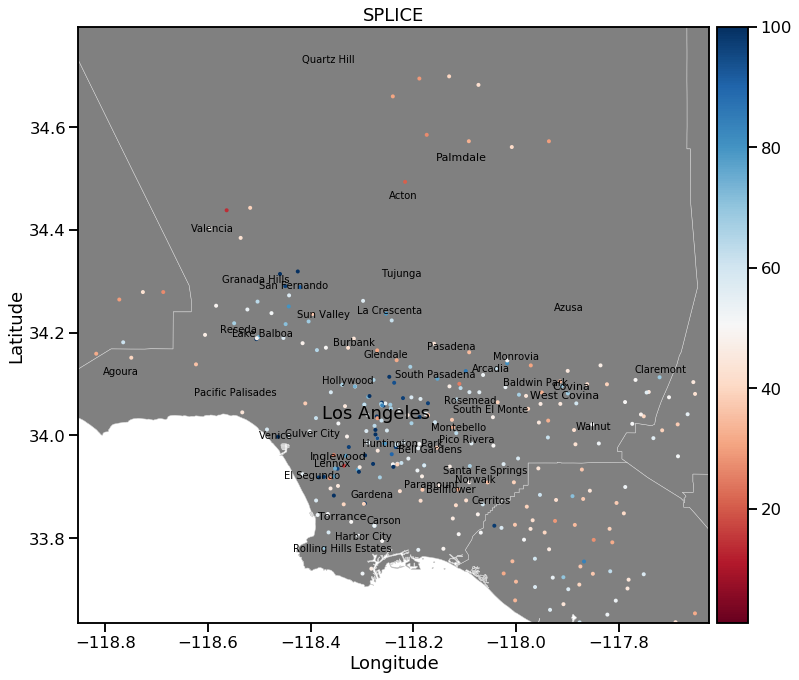

<IPython.core.display.Javascript object>

In [858]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Zip code
# zip_shapefile_wlabels.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='none', zorder=1)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=2
)
ax1.set_xlim([la_boundaries[2], la_boundaries[3]])
ax1.set_ylim([la_boundaries[0], la_boundaries[1]])

# Label cities - limit to LA
# Extract local coordinates
zip_shapefile_wlabels_LA = zip_shapefile_wlabels[zip_shapefile_wlabels['County'].isin(["Los Angeles"])].copy()
zip_shapefile_wlabels_LA['coords'] = zip_shapefile_wlabels_LA['geometry'].apply(lambda x: x.representative_point().coords[:])
zip_shapefile_wlabels_LA['coords'] = [coords[0] for coords in zip_shapefile_wlabels_LA['coords']]

# Generate average locations for text and label
df_ba_avgtext_loc = return_avg_loc(zip_shapefile_wlabels_LA, 'City',  min_fontsize=10)
for idx, row in df_ba_avgtext_loc.iterrows():
    if idx % 2 != 0:
        # Plot half of them to make it more readable
        ax1.annotate(s=row['index'], xy=row['avg_coord'],
                     horizontalalignment='center', fontsize=row['fontsize'], color='black')

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE')
plt.savefig(figure_loc + 'LA_map_school_loc_cities.png');
;
;

#### Fresno

In [93]:
fresno_boundaries = get_map_boundaries("County", search_list=["Fresno"], buffer=0.1)
fresno_boundaries

(36.069696199999996, 36.9653258, -120.559327, -119.2481042)

<IPython.core.display.Javascript object>

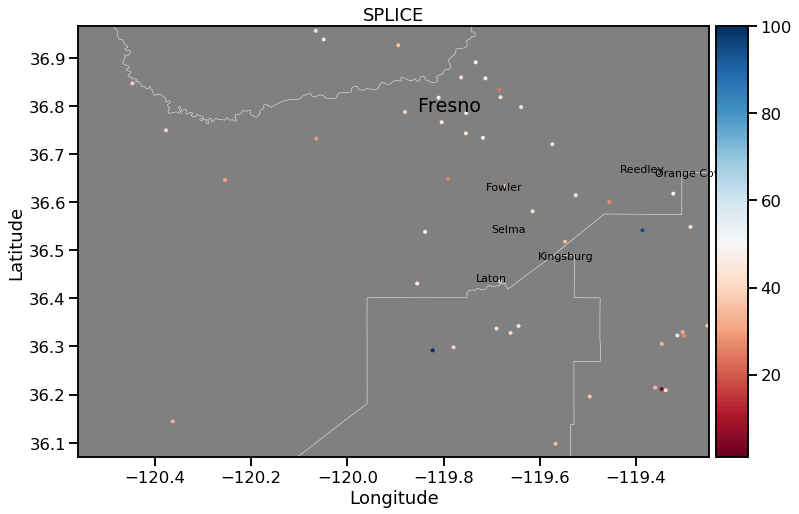

<IPython.core.display.Javascript object>

In [860]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Zip code
# zip_shapefile_wlabels.boundary.plot(ax=ax1, edgecolor='lightgray', linewidth=0.5, facecolor='none', zorder=1)

# Label with SPLICE
g = sns.scatterplot(
    data=df_wgeo,
    x="Longitude",
    y="Latitude",
    palette="RdBu",
    hue="graduation_rates_UCCSU_eligibility_LIstudents",
    s=2 ** 4,
    ax=ax1,
    linewidth=0,
    zorder=2
)
ax1.set_xlim([fresno_boundaries[2], fresno_boundaries[3]])
ax1.set_ylim([fresno_boundaries[0], fresno_boundaries[1]])

# Label cities - limit to Fresno
# Extract local coordinates
zip_shapefile_wlabels_Fresno = zip_shapefile_wlabels[zip_shapefile_wlabels['County'].isin(["Fresno"])].copy()
zip_shapefile_wlabels_Fresno['coords'] = zip_shapefile_wlabels_Fresno['geometry'].apply(lambda x: x.representative_point().coords[:])
zip_shapefile_wlabels_Fresno['coords'] = [coords[0] for coords in zip_shapefile_wlabels_Fresno['coords']]

# Generate average locations for text and label
df_ba_avgtext_loc = return_avg_loc(zip_shapefile_wlabels_Fresno, 'City',  min_fontsize=10)
for idx, row in df_ba_avgtext_loc.iterrows():
    if idx % 2 != 0:
        # Plot half of them to make it more readable
        ax1.annotate(s=row['index'], xy=row['avg_coord'],
                     horizontalalignment='center', fontsize=row['fontsize'], color='black')

norm = plt.Normalize(df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].min(), df_wgeo['graduation_rates_UCCSU_eligibility_LIstudents'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
ax1.get_legend().remove()
ax1.figure.colorbar(sm, cax)
ax1.set_title('SPLICE')

plt.savefig(figure_loc + 'Fresno_map_school_loc_cities.png');
;

#### Check high schools in Tulare county

In [812]:
df_wgeo.loc[
    df_wgeo["County"] == "Tulare",
    [
        "School",
        "enrollment",
        "Charter_cat_encoded",
        "pct_LI_students",
        "pct_URM",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ],
].sort_values(by="graduation_rates_UCCSU_eligibility_LIstudents", ascending=False)

,School,enrollment,Charter_cat_encoded,pct_LI_students,pct_URM,graduation_rates_UCCSU_eligibility_LIstudents
1066,Dinuba High,1989.0,0,75.0,92.357969,95.0
1064,Harmony Magnet Academy,516.0,1,58.0,64.534884,91.0
1045,University Preparatory High,245.0,1,40.0,48.163265,54.0
1051,Orosi High,1045.0,0,90.0,92.727273,44.0
1052,Lindsay Senior High,1090.0,0,86.0,93.119266,44.0
1059,Farmersville High,749.0,0,85.0,95.460614,44.0
1055,Tulare Union High,1740.0,0,71.0,74.942529,41.0
1067,Woodlake High,663.0,0,83.0,86.274510,37.0
1050,Golden West High,1651.0,0,58.0,71.471835,37.0
1053,Mission Oak High,1464.0,0,67.0,76.844262,36.0


<IPython.core.display.Javascript object>

KeyError: '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months'

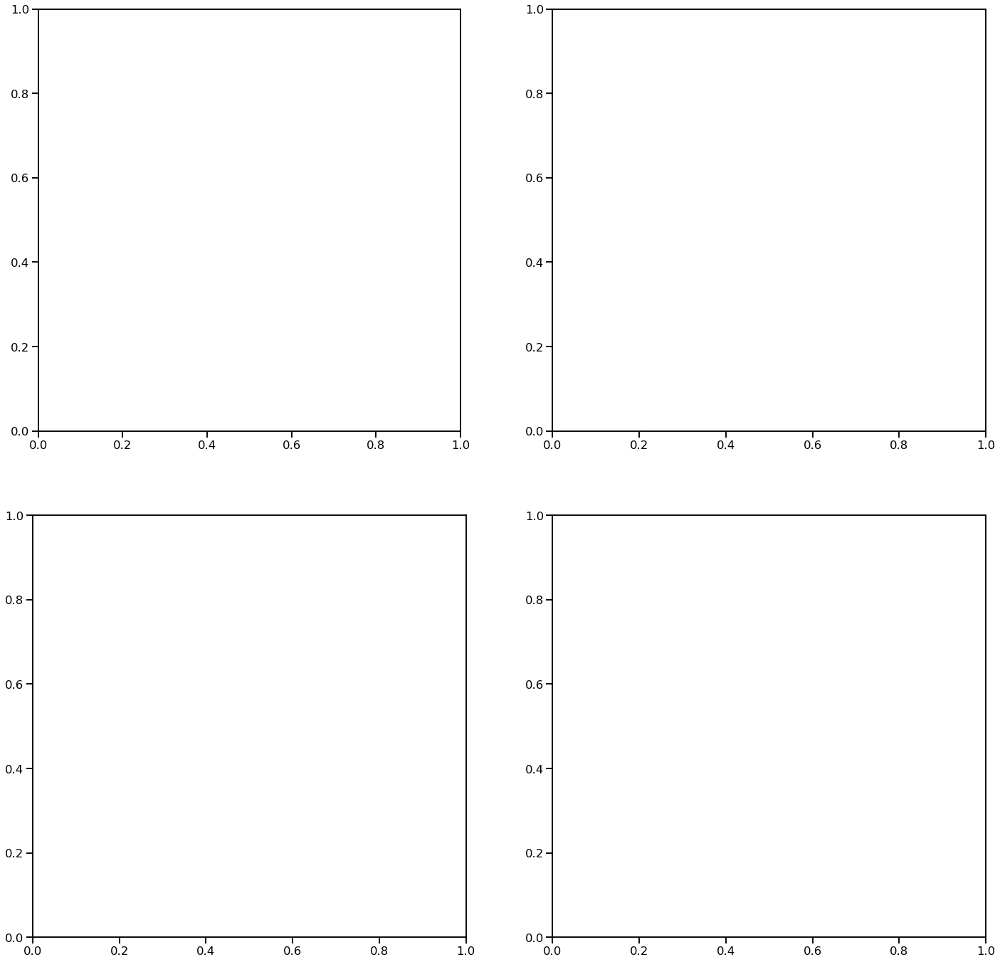

<IPython.core.display.Javascript object>

In [450]:
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(24, 24))

# CA
# df_CA.plot(ax=ax1, color="gray", zorder=1)
sew_sf.plot(
    column=feat2plot,
    ax=ax1,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)

# Bay Area
df_CA.plot(ax=ax2, color="white", zorder=1)
sew_sf.plot(
    column=feat2plot,
    ax=ax2,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)
ax2.set_xlim([ba_long_min, ba_long_max])
ax2.set_ylim([ba_lat_min, ba_lat_max])


# LA
df_CA.plot(ax=ax3, color="white", zorder=1)
sew_sf.plot(
    column=feat2plot,
    ax=ax3,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)
ax3.set_xlim([la_long_min, la_long_max])
ax3.set_ylim([la_lat_min, la_lat_max])


# SD
df_CA.plot(ax=ax4, color="white", zorder=1)
sew_sf.plot(
    column=feat2plot,
    ax=ax4,
    # legend=True,
    edgecolor="black",
    cmap="OrRd",
    linewidth=0.2,
    # legend_kwds={"label": "median household income", "orientation": "vertical"},
)

ax4.set_xlim([ba_long_min, sd_long_max])
ax4.set_ylim([sd_lat_min, sd_lat_max])

## Census characteristics on the zip code level

In [63]:
df_state_info_gs_census_industry_ziponly.head(2)

,zip_code,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,...,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
0,94612,9.2,24.0,16.0,32993.0,29027.0,5055.0,82.2,41.3,4.7,...,8.9,3.0,1.2,80.5,8.8,37.3,11.0,0.3,49.8,50.5
1,94501,6.1,21.9,5.0,72884.0,32115.0,4632.0,89.9,25.8,6.0,...,10.1,6.2,2.6,75.8,8.6,30.7,8.3,1.5,59.4,76.2


<IPython.core.display.Javascript object>

In [903]:
zip_shapefile_wlabels.head(2)

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,LATITUDE,LONGITUDE,...,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,zip_code,County,City,District
0,1,None,None,None,None,None,94601,0694601,37.776711,-122.218378,...,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7...",94601,Alameda,Oakland,Oakland Unified
1,2,None,None,None,None,None,94501,0694501,37.774084,-122.278049,...,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7...",94501,Alameda,Alameda,Alameda Unified


<IPython.core.display.Javascript object>

### Median household income

In [597]:
feat2plot = "Est.; INCOME_BENEFITS - Total households - Median household income ($)"

zip_shapefile_wfeat = zip_shapefile.set_index("ZCTA").join(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot]].set_index(
        "zip_code"
    ),
    how="left",
)

zip_shapefile_wfeat[feat2plot] = pd.to_numeric(zip_shapefile_wfeat[feat2plot], errors='coerce')


<IPython.core.display.Javascript object>

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


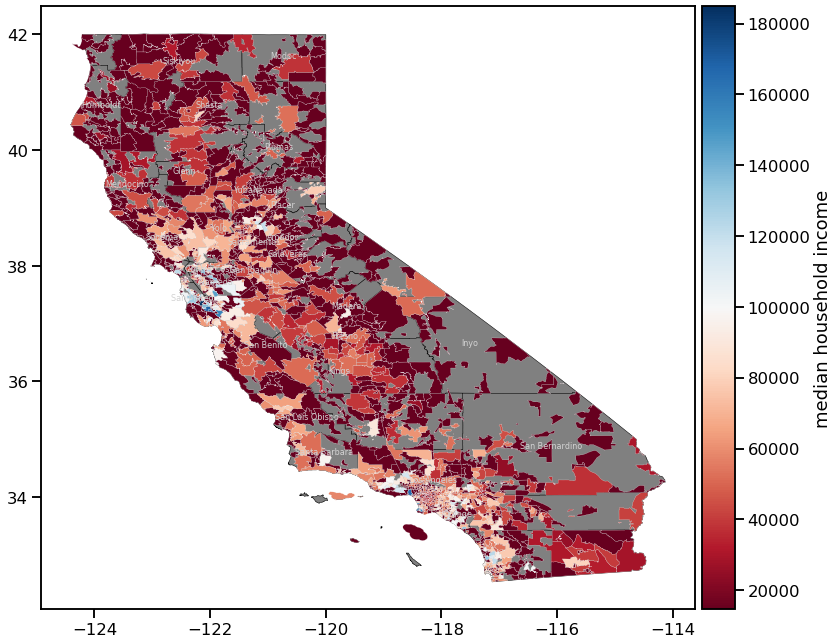

<IPython.core.display.Javascript object>

In [607]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='black', facecolor='gray', zorder=0)

# Label with local median income on the zip code level
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
    
# Zip code with feature to plot
zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='white',
                     cmap='RdBu',
                     cax=cax,
                     linewidth = 0.2,
                     legend_kwds={'label':"median household income", 'orientation': "vertical"});

# Label counties
for idx, row in sew_sf_text.iterrows():
    if idx % 2==0:
        ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                     horizontalalignment='center', fontsize=8, color='lightgray')

plt.tight_layout()
plt.savefig(figure_loc + 'CA_map_income.png', dpi=300);

### SD county

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


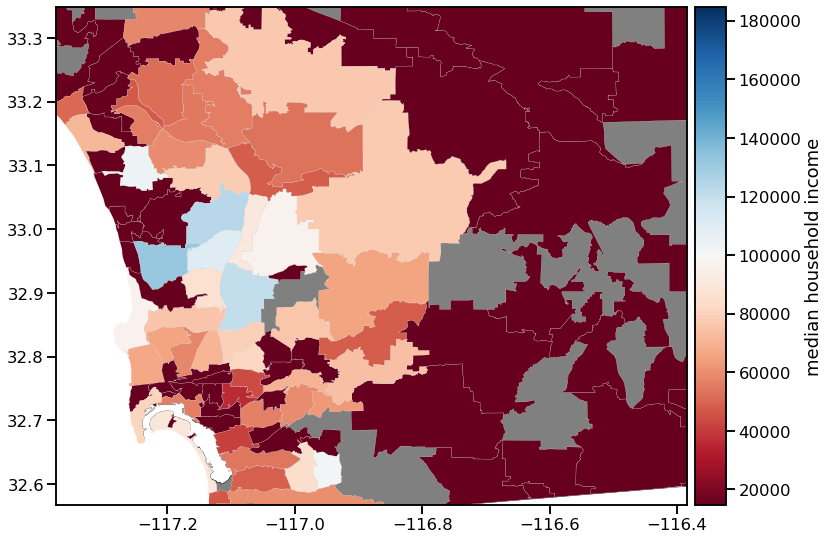

<IPython.core.display.Javascript object>

In [72]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='black', facecolor='gray', zorder=0)

# Label with local median income on the zip code level
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
    
# Zip code with feature to plot
zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='white',
                     cmap='RdBu',
                     cax=cax,
                     linewidth = 0.2,
                     legend_kwds={'label':"median household income", 'orientation': "vertical"})

ax1.set_xlim([sd_long_min, sd_long_max])
ax1.set_ylim([sd_lat_min, sd_lat_max]);
;

### Work commute, public transportation

In [76]:
feat2plot = "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)"
df_state_census_wgeo = pd.merge(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot]],
    zip_shapefile_wlabels,
    left_on="zip_code",
    right_on="ZCTA",
)
df_state_census_wgeo.head(2)

,zip_code_x,%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA,ZCTA_KEY,...,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,zip_code_y,County,City,District
0,94612,36.5,736,None,None,None,None,None,94612,0694612,...,1172,7326,11997,2.205249e+06,11539.060839,"POLYGON ((-199972.483 -21221.402, -199992.804 ...",94612,Alameda,Oakland,Alameda County Office of Education
1,94501,16.8,2,None,None,None,None,None,94501,0694501,...,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-201604.187 -25728.139, -202894.954 ...",94501,Alameda,Alameda,Alameda Unified


<IPython.core.display.Javascript object>

In [78]:
feat2plot = "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)"
zip_shapefile_wfeat = zip_shapefile.set_index("ZCTA").join(
    df_state_info_gs_census_industry_ziponly[["zip_code", feat2plot]].set_index(
        "zip_code"
    ),
    how="left",
)
zip_shapefile_wfeat.head()

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA_KEY,LATITUDE,LONGITUDE,TOT_POP,...,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
ZCTA,,,,,,,,,,,,,,,,,,,,,
94601,1,None,None,None,None,None,0694601,37.776711,-122.218378,50294,...,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7...",20.8
94501,2,None,None,None,None,None,0694501,37.774084,-122.278049,60212,...,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7...",16.8
94560,3,None,None,None,None,None,0694560,37.520360,-122.031000,42573,...,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-122.05499 37.54960, -122.05441 37.5...",4.7
94587,4,None,None,None,None,None,0694587,37.603151,-122.018626,69516,...,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-122.06515 37.60485, -122.06499 37.6...",8.7
94580,5,None,None,None,None,None,0694580,37.676958,-122.133606,27152,...,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-122.12999 37.68445, -122.12995 37.6...",9.9


<IPython.core.display.Javascript object>

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


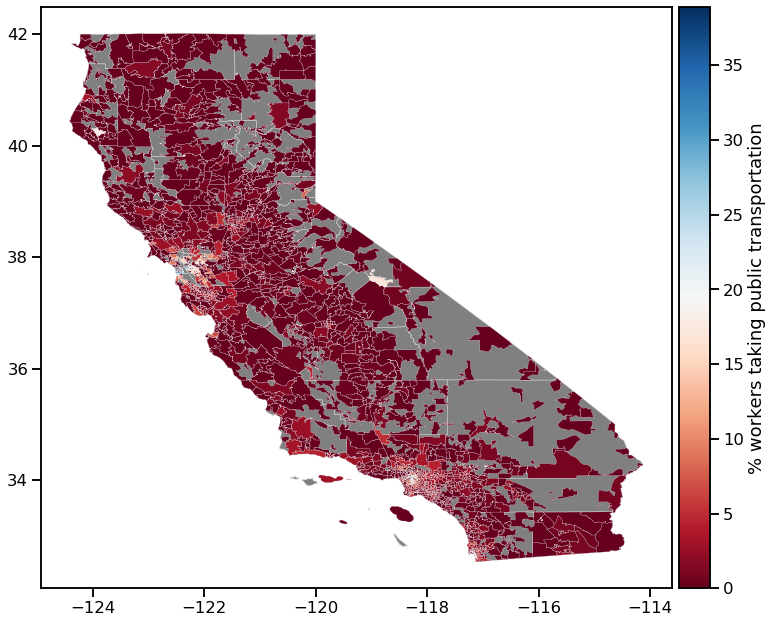

<IPython.core.display.Javascript object>

In [81]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

# Label with local median income on the zip code level
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
    
# Zip code with feature to plot
zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='white',
                     cmap='RdBu',
                     cax=cax,
                     linewidth = 0.2,
                     legend_kwds={'label':"% workers taking public transportation", 'orientation': "vertical"});


#plt.savefig(figure_loc + 'CA_map_income.png');
;

### SD county

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


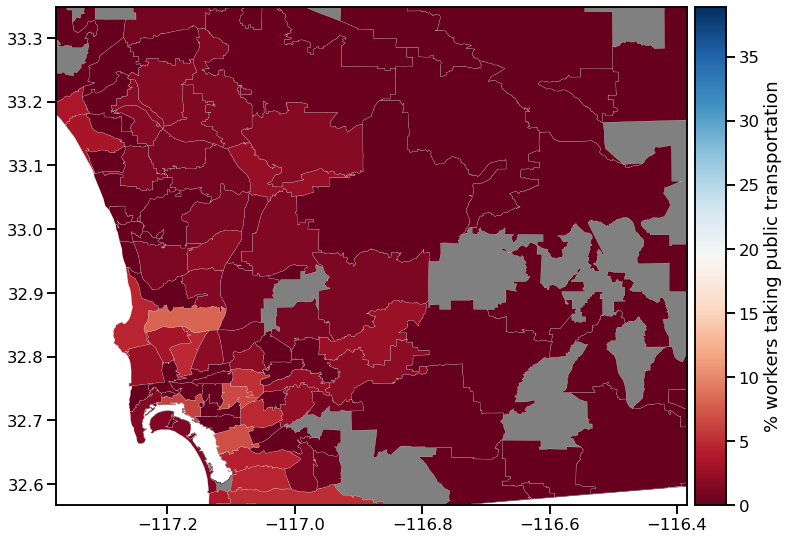

<IPython.core.display.Javascript object>

In [82]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='black', facecolor='gray', zorder=0)

# Label with local median income on the zip code level
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
    
# Zip code with feature to plot
zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='white',
                     cmap='RdBu',
                     cax=cax,
                     linewidth = 0.2,
                     legend_kwds={'label':"% workers taking public transportation", 'orientation': "vertical"})

ax1.set_xlim([sd_long_min, sd_long_max])
ax1.set_ylim([sd_lat_min, sd_lat_max]);
;

### LA County

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


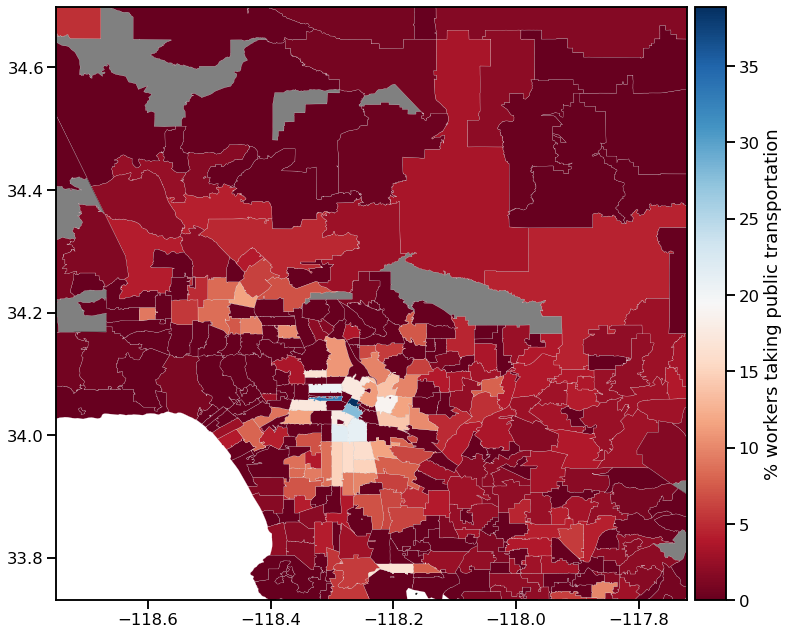

<IPython.core.display.Javascript object>

In [94]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='black', facecolor='gray', zorder=0)

# Label with local median income on the zip code level
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
    
# Zip code with feature to plot
zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='white',
                     cmap='RdBu',
                     cax=cax,
                     linewidth = 0.2,
                     legend_kwds={'label':"% workers taking public transportation", 'orientation': "vertical"})

ax1.set_xlim([la_long_min, la_long_max])
ax1.set_ylim([la_lat_min, la_lat_max]);
;

### Bay Area

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


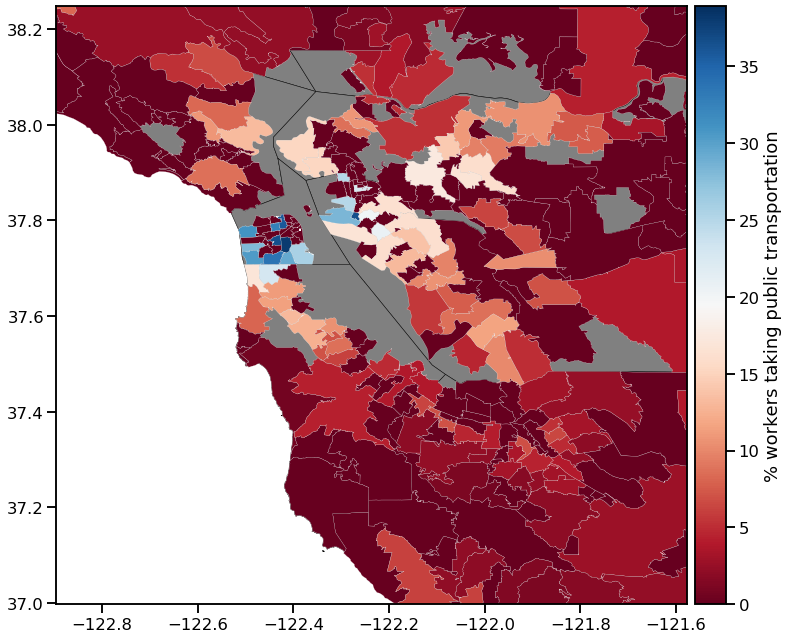

<IPython.core.display.Javascript object>

In [95]:
f, ax1 = plt.subplots(figsize=(12, 12))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='black', facecolor='gray', zorder=0)

# Label with local median income on the zip code level
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
    
# Zip code with feature to plot
zip_shapefile_wfeat.plot(column=feat2plot,
                     ax=ax1,
                     legend=True,
                     edgecolor='white',
                     cmap='RdBu',
                     cax=cax,
                     linewidth = 0.2,
                     legend_kwds={'label':"% workers taking public transportation", 'orientation': "vertical"})

ax1.set_xlim([ba_long_min, ba_long_max])
ax1.set_ylim([ba_lat_min, ba_lat_max]);
;

In [101]:
df_state_info_gs_census_industry.loc[
    :,
    [
        "School",
        "City",
        "Charter_cat_encoded",
        "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ],
].sort_values(
    by="%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ascending=False,
).head(
    30
)

,School,City,Charter_cat_encoded,%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),graduation_rates_UCCSU_eligibility_LIstudents
308,Contreras Learning Center-School of Social Jus...,Los Angeles,0,38.9,83.0
307,Contreras Learning Center-Los Angeles School o...,Los Angeles,0,38.9,55.0
838,O'Connell (John) High,San Francisco,0,38.0,53.0
0,Envision Academy for Arts & Technology,Oakland,1,36.5,100.0
837,Mission High,San Francisco,0,36.5,54.0
834,Galileo High,San Francisco,0,35.9,66.0
824,City Arts and Tech High,San Francisco,1,33.8,100.0
825,Balboa High,San Francisco,0,33.8,59.0
826,Leadership High,San Francisco,1,33.8,100.0
329,School for the Visual Arts and Humanities,Los Angeles,0,33.1,62.0


<IPython.core.display.Javascript object>

### Industry geographic plot

In [501]:
zip_shapefile_wfeat.head()

,OBJECTID,CNTY_FIPS,COUNTY,TRACT,TRACT_ID,CENSUS_KEY,ZCTA_KEY,LATITUDE,LONGITUDE,TOT_POP,...,HU_VAC_REN,HU_VAC_SEA,HU_OCC_OWN,HU_OCC_O_1,HU_OCC_REN,HU_OCC_R_1,Shape_area,Shape_len,geometry,highest_z_industry
ZCTA,,,,,,,,,,,,,,,,,,,,,
94601,1,None,None,None,None,None,0694601,37.776711,-122.218378,50294,...,839,28,4764,16528,10062,32927,8.721649e+06,15265.093880,"POLYGON ((-122.22717 37.79197, -122.22693 37.7...",Construction
94501,2,None,None,None,None,None,0694501,37.774084,-122.278049,60212,...,885,189,10286,26023,14739,32705,2.954478e+07,27119.154912,"POLYGON ((-122.29181 37.76301, -122.30661 37.7...","Professional, scientific, and management, and ..."
94560,3,None,None,None,None,None,0694560,37.520360,-122.031000,42573,...,170,17,8942,28489,4030,13939,3.581839e+07,30752.336176,"POLYGON ((-122.05499 37.54960, -122.05441 37.5...",Manufacturing
94587,4,None,None,None,None,None,0694587,37.603151,-122.018626,69516,...,384,39,13580,46272,6853,22726,5.107510e+07,53110.314427,"POLYGON ((-122.06515 37.60485, -122.06499 37.6...",Manufacturing
94580,5,None,None,None,None,None,0694580,37.676958,-122.133606,27152,...,116,15,6105,18760,2519,8252,8.946896e+06,20260.685185,"POLYGON ((-122.12999 37.68445, -122.12995 37.6...",Information


<IPython.core.display.Javascript object>

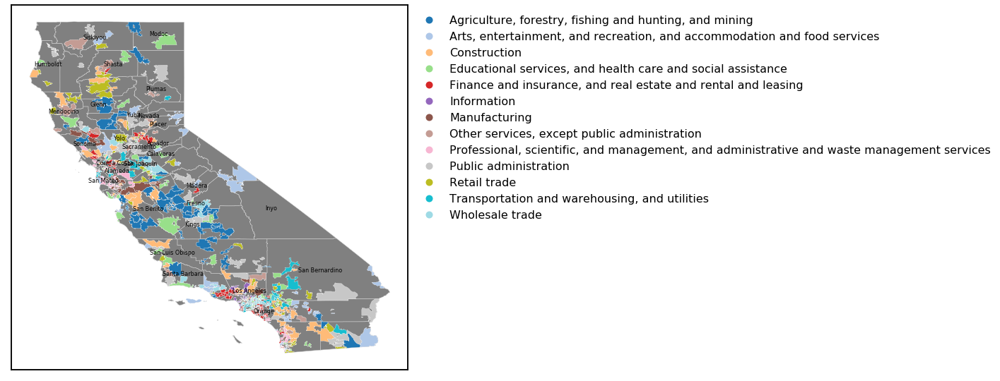

<IPython.core.display.Javascript object>

In [528]:
feat2plot = "highest_z_industry"
zip_shapefile_wfeat = zip_shapefile.set_index('ZCTA').join(df_state_info_gs_census_industry_ziponly[['zip_code', feat2plot]].set_index('zip_code'),
                                         how='inner')

f, ax1 = plt.subplots(figsize=(20, 20))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

zip_shapefile_wfeat.plot(column=feat2plot, 
                         categorical=True, 
                         cmap='tab20', 
                         linewidth=.3, 
                         edgecolor='white',
                         legend=True, 
                         legend_kwds={'bbox_to_anchor':(1, 1.0),
                                      'loc':'upper left',
                                      'fontsize':16,
                                      'frameon':False}, 
                         ax=ax1)

# Label counties
for idx, row in sew_sf_text.iterrows():
    if idx % 2==0:
        ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                     horizontalalignment='center', fontsize=8, color='black')


ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)
plt.tight_layout()
plt.savefig(figure_loc + 'Map_main_industry_CA.png', dpi=300);
;

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


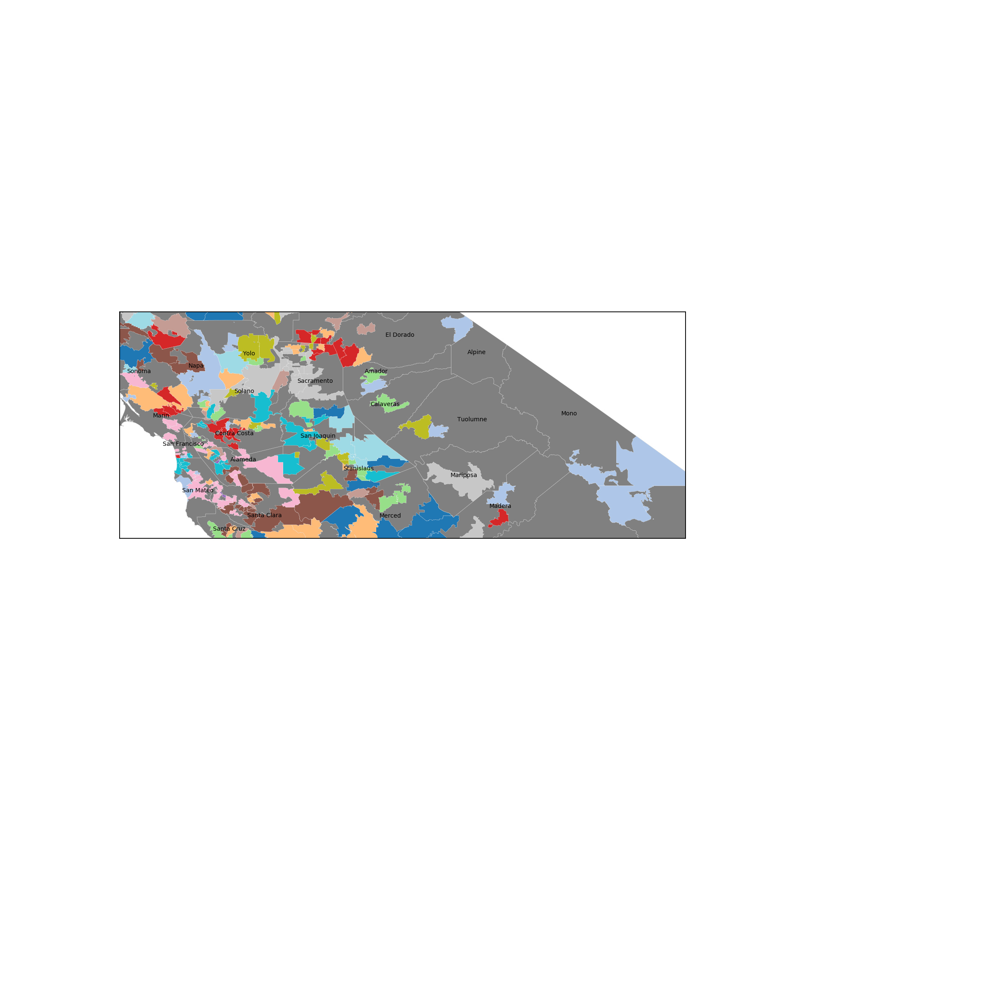

<IPython.core.display.Javascript object>

In [552]:
feat2plot = "highest_z_industry"
zip_shapefile_wfeat = zip_shapefile.set_index('ZCTA').join(df_state_info_gs_census_industry_ziponly[['zip_code', feat2plot]].set_index('zip_code'),
                                         how='inner')

f, ax1 = plt.subplots(figsize=(24, 18))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

zip_shapefile_wfeat.plot(column=feat2plot, 
                         categorical=True, 
                         cmap='tab20', 
                         linewidth=.3, 
                         edgecolor='white',
                         legend=False, 
#                          legend_kwds={'bbox_to_anchor':(1, 1.0),
#                                       'loc':'upper left',
#                                       'fontsize':16,
#                                       'frameon':False}, 
                         ax=ax1)

# Label counties
for idx, row in sew_sf_text.iterrows():
    #if idx % 2!=0:
    ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                 horizontalalignment='center', fontsize=14, color='black')


ax1.set_xlim([nc_long_min, nc_long_max])
ax1.set_ylim([nc_lat_min, nc_lat_max])   
        
ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)
plt.tight_layout()
plt.savefig(figure_loc + 'Map_main_industry_Norcal.png', dpi=300);
;

/Users/lacar/anaconda/envs/insight/lib/python3.6/site-packages/ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


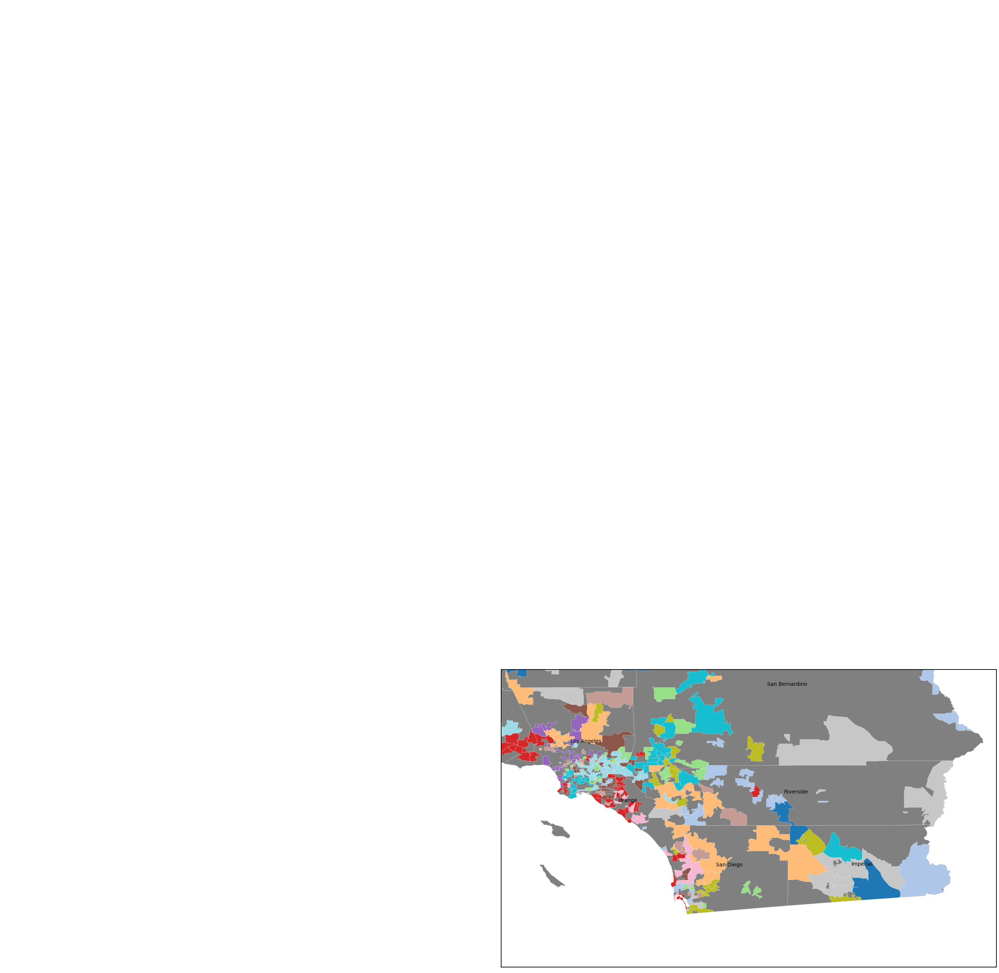

<IPython.core.display.Javascript object>

In [549]:
feat2plot = "highest_z_industry"
zip_shapefile_wfeat = zip_shapefile.set_index('ZCTA').join(df_state_info_gs_census_industry_ziponly[['zip_code', feat2plot]].set_index('zip_code'),
                                         how='inner')

f, ax1 = plt.subplots(figsize=(24, 18))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

zip_shapefile_wfeat.plot(column=feat2plot, 
                         categorical=True, 
                         cmap='tab20', 
                         linewidth=.3, 
                         edgecolor='white',
                         legend=False, 
                         legend_kwds={'bbox_to_anchor':(1, 1.0),
                                      'loc':'upper left',
                                      'fontsize':16,
                                      'frameon':False}, 
                         ax=ax1)

# Label counties
for idx, row in sew_sf_text.iterrows():
    #if idx % 2!=0:
    ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                 horizontalalignment='center', fontsize=14, color='black')


ax1.set_xlim([sc_long_min, sc_long_max])
ax1.set_ylim([sc_lat_min, sc_lat_max])   
        
ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)
plt.tight_layout()
plt.savefig(figure_loc + 'Map_main_industry_Socal.png', dpi=300);
;

### Work commute geographic plot

''

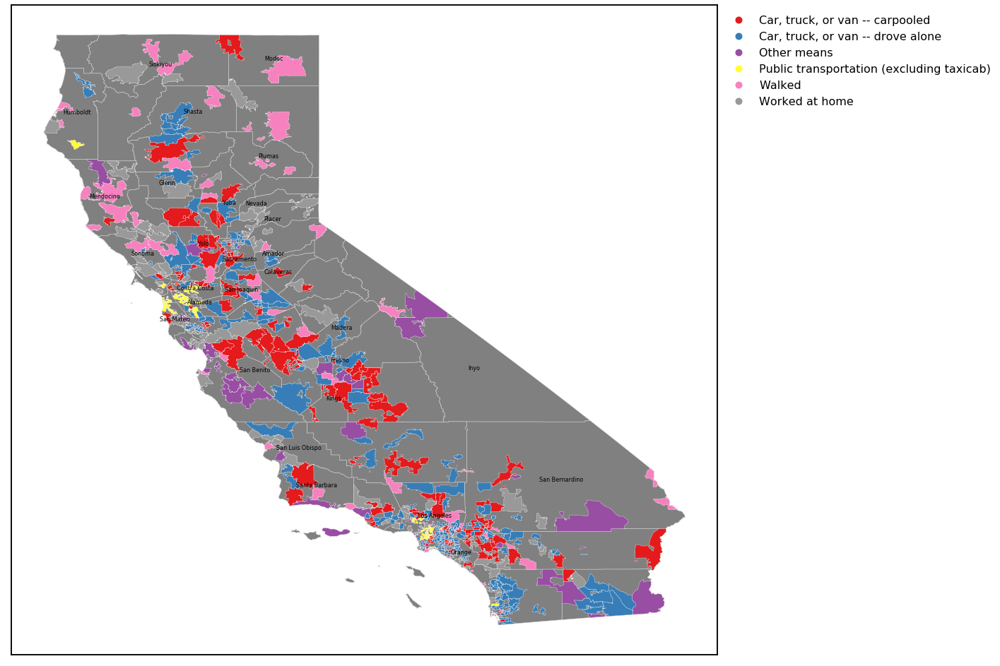

<IPython.core.display.Javascript object>

In [578]:
feat2plot = "highest_z_wc"
zip_shapefile_wfeat = zip_shapefile.set_index('ZCTA').join(df_state_info_gs_census_industry_ziponly[['zip_code', feat2plot]].set_index('zip_code'),
                                         how='inner')

f, ax1 = plt.subplots(figsize=(20, 20))

# State/county
sew_sf.boundary.plot(ax=ax1, linewidth=0.5, edgecolor='lightgray', facecolor='gray', zorder=0)

zip_shapefile_wfeat.plot(column=feat2plot, 
                         categorical=True, 
                         cmap='Set1', 
                         linewidth=.3, 
                         edgecolor='white',
                         legend=True, 
                         legend_kwds={'bbox_to_anchor':(1, 1.0),
                                      'loc':'upper left',
                                      'fontsize':16,
                                      'frameon':False}, 
                         ax=ax1)

# Label counties
for idx, row in sew_sf_text.iterrows():
    if idx % 2==0:
        ax1.annotate(s=row['NAME_PCASE'], xy=row['coords'],
                     horizontalalignment='center', fontsize=8, color='black')


ax1.axes.xaxis.set_visible(False)
ax1.axes.yaxis.set_visible(False)
plt.tight_layout()
plt.savefig(figure_loc + 'Map_main_workcommute_CA.png', dpi=300);
;

## Same zip code, different schools

In [204]:
# Get boolean index of duplicated zip code

bool_zip_dup = df_state_info_gs_census["zip_code"].duplicated(keep=False)
bool_zip_dup.sum()

401

<IPython.core.display.Javascript object>

In [ ]:
# Look at duplicated zip code and SPLICE status that are diffeent

In [214]:
col2show = [
    "County",
    "zip_code",
    "Street",
    "School",
    "City",
    "District",
    "enrollment",
    "Charter_cat_encoded",
    "splice_high",
]
df_state_info_gs_census.loc[bool_zip_dup, col2show].sort_values(by="zip_code").head(
    301
).tail(20)

,County,zip_code,Street,School,City,District,enrollment,Charter_cat_encoded,splice_high
437,Madera,93637,200 South L Street,Madera High,Madera,Madera Unified,2139.0,0,0
436,Madera,93637,755 West Pecan Avenue,Madera South High,Madera,Madera Unified,2916.0,0,0
441,Madera,93645,45077 Road 200,Minarets High,O'Neals,Chawanakee Unified,245.0,0,0
442,Madera,93645,45077 Road 220,Minarets Charter High,O'Neals,Chawanakee Unified,253.0,1,0
91,Fresno,93704,1839 Echo Avenue,Fresno High,Fresno,Fresno Unified,2410.0,0,0
90,Fresno,93704,5445 North Palm Avenue,Bullard High,Fresno,Fresno Unified,2639.0,0,0
492,Monterey,93906,1900 Independence Boulevard,Everett Alvarez High,Salinas,Salinas Union High,2466.0,0,0
493,Monterey,93906,55 Kip Drive,North Salinas High,Salinas,Salinas Union High,1977.0,0,0
891,San Mateo,94062,1201 Brewster Avenue,Sequoia High,Redwood City,Sequoia Union High,2143.0,0,0
892,San Mateo,94062,199 Churchill Avenue,Woodside High,Woodside,Sequoia Union High,1781.0,0,0


<IPython.core.display.Javascript object>

## Same address, different schools

In [207]:
# Get boolean index of duplicated zip code, address

bool_zip_street_dup = df_state_info_gs_census[["zip_code", "Street"]].duplicated(
    keep=False
)
bool_zip_street_dup.sum()

38

<IPython.core.display.Javascript object>

In [210]:
df_state_info_gs_census.loc[bool_zip_street_dup, col2show].sort_values(
    by="zip_code"
).head(20)

,County,zip_code,Street,School,City,District,enrollment,Charter_cat_encoded,splice_high
273,Los Angeles,90001,6100 South Central Avenue,Public Service Community at Diego Rivera Learn...,Los Angeles,Los Angeles Unified,527.0,0,1
274,Los Angeles,90001,6100 South Central Avenue,Communication and Technology at Diego Rivera L...,Los Angeles,Los Angeles Unified,542.0,0,1
275,Los Angeles,90001,6100 South Central Avenue,Performing Arts Community at Diego Rivera Lear...,Los Angeles,Los Angeles Unified,544.0,0,1
345,Los Angeles,90002,2265 East 103rd Street,David Starr Jordan Senior High,Los Angeles,Los Angeles Unified,557.0,0,0
344,Los Angeles,90002,2265 East 103rd Street,Animo College Preparatory Academy,Los Angeles,Los Angeles Unified,533.0,1,0
329,Los Angeles,90005,701 South Catalina Street,School for the Visual Arts and Humanities,Los Angeles,Los Angeles Unified,435.0,0,0
328,Los Angeles,90005,701 South Catalina Street,Los Angeles High School of the Arts,Los Angeles,Los Angeles Unified,430.0,0,1
289,Los Angeles,90011,300 East 53rd Street,Dr. Maya Angelou Community High,Los Angeles,Los Angeles Unified,1116.0,0,0
290,Los Angeles,90011,300 East 53rd Street,Synergy Quantum Academy,Los Angeles,Los Angeles Unified,582.0,1,1
319,Los Angeles,90028,1309 North Wilton Place,STEM Academy at Bernstein High,Hollywood,Los Angeles Unified,568.0,0,1


<IPython.core.display.Javascript object>

# Look at one school

In [219]:
df_state_info_gs_census[df_state_info_gs_census["School"].str.contains("San Juan")].T

,517,669
NCESDist,607440,634620
NCESSchool,11854,8578
NCESDistSchool,60744011854,63462008578
StatusType,Active,Active
County,Orange,Sacramento
...,...,...
graduation_rates_gradRates_eligibility_LIstudents,96,19
graduation_rates_UCCSU_eligibility_allStudents,61,28
graduation_rates_UCCSU_eligibility_nonLIstudents,72,25.2963
graduation_rates_UCCSU_eligibility_LIstudents,28,29


<IPython.core.display.Javascript object>

In [221]:
df_state_info_gs_census[df_state_info_gs_census["School"].str.contains("Fremont High")]

,NCESDist,NCESSchool,NCESDistSchool,StatusType,County,District,School,Street,StreetAbr,City,...,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_nonLIstudents,graduation_rates_UCCSU_eligibility_LIstudents,splice_high
939,614430,1696,61443001696,Active,Santa Clara,Fremont Union High,Fremont High,575 West Fremont Avenue,575 West Fremont Ave.,Sunnyvale,...,9.0,40.0,26.0,187.0,87.0,81.0,53.0,61.076923,38.0,0


<IPython.core.display.Javascript object>

# ---